<a href="https://colab.research.google.com/github/aaronjoel/DeepLearningTutorials/blob/master/Exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [ ]:
try:
  import google.colab
  import requests
  url = 'https://raw.githubusercontent.com/dvgodoy/PyTorchStepByStep/master/config.py'
  r = requests.get(url, allow_redirects=True)
  open('config.py', 'wb').write(r.content)
except ModuleNotFoundError:
  pass

from config import *
config_chapter7()
# This is needed to render the plots in this chapter
from plots.chapter7 import *

Finished!


In [ ]:
import numpy as np
from PIL import Image

import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader, Dataset, random_split, TensorDataset
from torchvision.transforms.v2 import Compose, ToImage, Normalize, \
                                      Resize, ToPILImage, CenterCrop, \
                                      RandomResizedCrop, ToDtype
from torchvision.datasets import ImageFolder
from torchvision.models import alexnet, resnet18, inception_v3

# Updated for Torchvision 0.15
from torchvision.models.alexnet import AlexNet_Weights
from torchvision.models.resnet import ResNet18_Weights
from torchvision.models.inception import Inception_V3_Weights

try:
  from torchvision.models.utils import load_state_dict_from_url
except ImportError:
  from torch.hub import load_state_dict_from_url

from stepbystep.v3 import StepByStep
from data_generation.rps import download_rps

## ImageNet Large Scale Visual Recognition Challenge

### Comparing Architectures

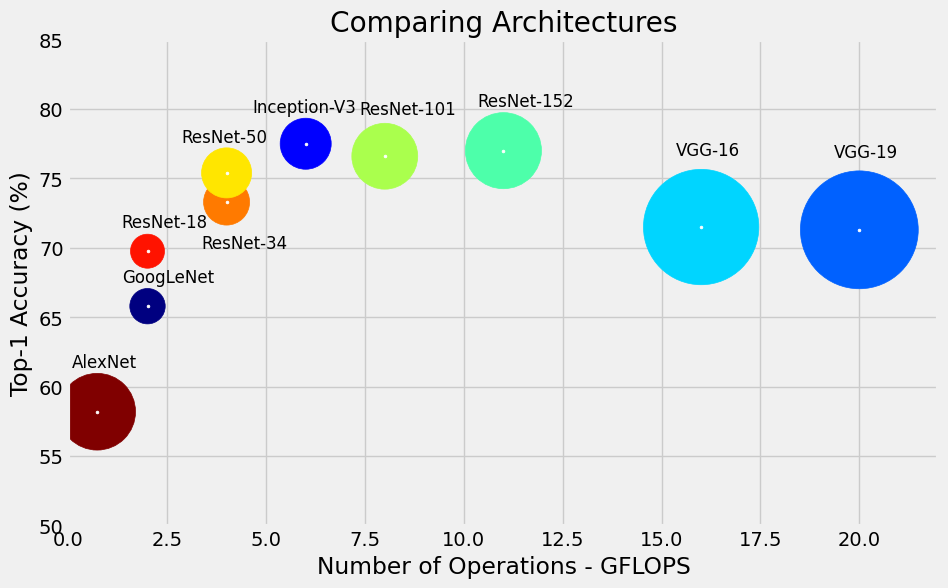

In [ ]:
fig = figure1()

In [ ]:
alex = alexnet(weights=None)
alex

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
alex = alexnet(weights=AlexNet_Weights.DEFAULT)
alex

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
result1 = F.adaptive_avg_pool2d(torch.randn(16, 32, 32), output_size=(6, 6))
result1

tensor([[[-5.1441e-02, -3.7149e-01, -1.1219e-01,  1.2818e-01, -1.1761e-01,
           2.9534e-01],
         [ 3.2966e-02, -1.3504e-01,  9.8484e-02, -8.0629e-02, -1.5040e-01,
           9.9876e-02],
         [ 1.0938e-01,  1.5424e-02,  6.5842e-02, -2.4477e-01, -2.0348e-01,
          -3.5543e-02],
         [-1.1523e-01, -9.2299e-02,  3.2826e-01,  1.2655e-01,  3.1530e-01,
          -9.4676e-03],
         [-1.9790e-01,  1.6354e-01, -1.3214e-01,  7.2522e-02,  1.6313e-01,
          -6.7018e-02],
         [ 2.8621e-02, -7.3002e-02,  1.3604e-02,  1.6178e-01, -7.1903e-02,
           8.2596e-02]],

        [[ 3.2800e-01,  1.4509e-01,  1.2009e-01, -1.9108e-01, -1.2717e-01,
          -8.3733e-02],
         [ 2.7320e-01,  2.9845e-01,  1.2158e-01, -3.9873e-03,  2.1634e-01,
           2.7941e-02],
         [ 1.9414e-02,  6.9060e-02,  2.1985e-02,  7.3835e-02,  1.1137e-01,
           1.9471e-01],
         [ 1.0275e-01, -4.5660e-02,  1.7088e-02, -2.4887e-02, -4.3433e-02,
          -1.3075e-01],
        

In [ ]:
result1.shape

torch.Size([16, 6, 6])

In [ ]:
result2 = F.adaptive_avg_pool2d(torch.randn(16, 12, 12), output_size=(6, 6))
result2.shape

torch.Size([16, 6, 6])

In [ ]:
weights = AlexNet_Weights.DEFAULT
weights

AlexNet_Weights.IMAGENET1K_V1

In [ ]:
url = weights.url
url

'https://download.pytorch.org/models/alexnet-owt-7be5be79.pth'

In [ ]:
# You may still load the state dict from the URL if you want...
state_dict = load_state_dict_from_url(url, model_dir='./pretrained', progress=True)
state_dict

OrderedDict([('features.0.weight',
              Parameter containing:
              tensor([[[[ 1.1864e-01,  9.4069e-02,  9.5435e-02,  ...,  5.5822e-02,
                          2.1575e-02,  4.9963e-02],
                        [ 7.4882e-02,  3.8940e-02,  5.2979e-02,  ...,  2.5709e-02,
                         -1.1299e-02,  4.1590e-03],
                        [ 7.5425e-02,  3.8779e-02,  5.4930e-02,  ...,  4.3596e-02,
                          1.0225e-02,  1.3251e-02],
                        ...,
                        [ 9.3155e-02,  1.0374e-01,  6.7547e-02,  ..., -2.0277e-01,
                         -1.2839e-01, -1.1220e-01],
                        [ 4.3544e-02,  6.4916e-02,  3.6164e-02,  ..., -2.0248e-01,
                         -1.1376e-01, -1.0719e-01],
                        [ 4.7369e-02,  6.2543e-02,  2.4758e-02,  ..., -1.1844e-01,
                         -9.5567e-02, -8.3890e-02]],
              
                       [[-7.2634e-02, -5.7996e-02, -8.0661e-02,  ..., -6.0

In [ ]:
type(state_dict)

collections.OrderedDict

In [ ]:
alex = alexnet(weights=None)
alex.load_state_dict(state_dict)

<All keys matched successfully>

### Model Freezing

In [ ]:
def freeze_model(model):
  for parameter in model.parameters():
    parameter.requires_grad = False

In [ ]:
freeze_model(alex)

In [ ]:
print(alex.classifier)

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)


In [ ]:
alex

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
torch.manual_seed(11)
alex.classifier[6]

Linear(in_features=4096, out_features=1000, bias=True)

In [ ]:
alex.classifier[6] = nn.Linear(in_features=4096, out_features=3)

In [ ]:
alex

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
for name, param in alex.named_parameters():
  if param.requires_grad == True:
    print(name)

classifier.6.weight
classifier.6.bias


In [ ]:
torch.manual_seed(17)
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_alex = optim.Adam(alex.parameters(), lr=3e-4)

In [ ]:
# This may take a couple of minutes...
download_rps()

rps folder already exists!
rps-test-set folder already exists!


In [ ]:
normalizer = Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])

normalizer

Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], inplace=False)

In [ ]:
composer = Compose([
    Resize(256),
    CenterCrop(224),
    ToImage(),
    ToDtype(torch.float32, scale=True),
    normalizer
])

In [ ]:
train_data = ImageFolder(root='rps', transform=composer)
val_data = ImageFolder(root='rps-test-set', transform=composer)

# Build a loader of each set
train_loader = DataLoader(train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16)

### Model Training

In [ ]:
sbs_alex = StepByStep(alex, multi_loss_fn, optimizer_alex)
sbs_alex.set_loaders(train_loader, val_loader)
sbs_alex.train(1)

In [ ]:
StepByStep.loader_apply(val_loader, sbs_alex.correct)

tensor([[111, 124],
        [124, 124],
        [124, 124]])

In [ ]:
alex.classifier[6] = nn.Identity()
print(alex.classifier)

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Identity()
)


In [ ]:
def preprocessed_dataset(model, loader, device=None):
  if device is None:
    device = next(model.parameters()).device

  features = None
  labels = None

  for i, (x, y) in enumerate(loader):
    model.eval()
    x = x.to(device)
    output = model(x)
    if i == 0:
      features = output.detach().cpu()
      labels = y.cpu()
    else:
      features = torch.cat([features, output.detach().cpu()])
      labels = torch.cat([labels, y.cpu()])

  dataset = TensorDataset(features, labels)
  return dataset


In [ ]:
train_preproc = preprocessed_dataset(alex, train_loader)
val_preproc = preprocessed_dataset(alex, val_loader)

In [ ]:
torch.save(train_preproc.tensors, 'rps_preproc.pth')
torch.save(val_preproc.tensors, 'rps_val_preproc.pth')

In [ ]:
train_preproc_loader = DataLoader(train_preproc, batch_size=16, shuffle=True)
val_preproc_loader = DataLoader(val_preproc, batch_size=16)

In [ ]:
torch.manual_seed(17)
top_model = nn.Sequential(nn.Linear(4096, 3))
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_top = optim.Adam(top_model.parameters(), lr=3e-4)

In [ ]:
sbs_top = StepByStep(top_model, multi_loss_fn, optimizer_top)
sbs_top.set_loaders(train_preproc_loader, val_preproc_loader)
sbs_top.train(10)

In [ ]:
sbs_alex.model.classifier

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Identity()
)

In [ ]:
sbs_alex.model.classifier[6] = top_model
sbs_alex.model.classifier

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Sequential(
    (0): Linear(in_features=4096, out_features=3, bias=True)
  )
)

In [ ]:
StepByStep.loader_apply(val_loader, sbs_alex.correct)

tensor([[109, 124],
        [124, 124],
        [124, 124]])

In [ ]:
# repreating import from the top for reference
from torchvision.models.inception import Inception_V3_Weights

# This is the recommended way of loading a pretrained model's weights
model = inception_v3(weights=Inception_V3_Weights.DEFAULT)

freeze_model(model)

torch.manual_seed(42)
model.AuxLogits.fc = nn.Linear(768, 3)
model.fc = nn.Linear(2048, 3)

In [ ]:
def inception_loss(outputs, labels):
  try:
    main, aux = outputs
  except ValueError:
    main = outputs
    aux = None
    loss_aux = 0

  multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
  loss_main = multi_loss_fn(main, labels)

  if aux is not None:
    loss_aux = multi_loss_fn(aux, labels)

  return loss_main + 0.4 * loss_aux

In [ ]:
optimizer_model = optim.Adam(model.parameters(), lr=3e-4)
sbs_incep = StepByStep(model, inception_loss, optimizer_model)

In [ ]:
normalizer = Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])

composer = Compose([
    Resize(299),
    ToImage(),
    ToDtype(torch.float32, scale=True),
    normalizer
])

train_data = ImageFolder(root='rps', transform=composer)
val_data = ImageFolder(root='rps-test-set', transform=composer)

# Builds a loader of each set
train_loader = DataLoader(train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16)

In [ ]:
sbs_incep.set_loaders(train_loader, val_loader)
sbs_incep.train(1)

In [ ]:
StepByStep.loader_apply(val_loader, sbs_incep.correct)

tensor([[110, 124],
        [ 88, 124],
        [116, 124]])

In [ ]:
scissors = Image.open('rps/scissors/scissors01-001.png')
image = ToDtype(torch.float32, scale=True)(ToImage()(scissors))[:3, :, :].view(1, 3, 300, 300)

weights = torch.tensor([0.2126, 0.7152, 0.0722]).view(1, 3, 1, 1)
convolved = F.conv2d(input=image, weight=weights)

converted = ToPILImage()(convolved[0])
grayscale = scissors.convert('L')

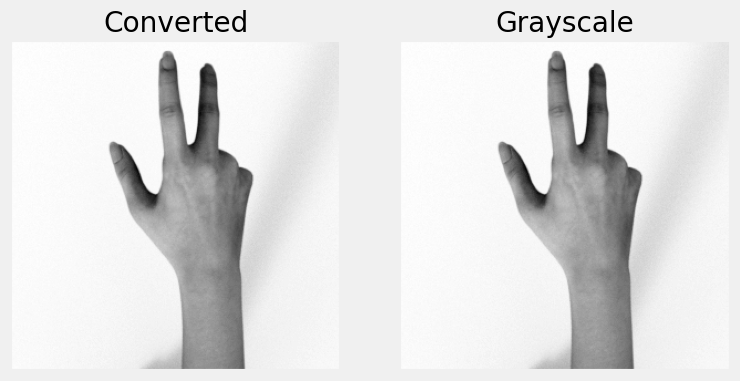

In [ ]:
fig = compare_grayscale(converted, grayscale)

In [ ]:
class Inception(nn.Module):
  def __init__(self, in_channels):
    super(Inception, self).__init__()
    # in_channels@HxW -> 2@HxW
    self.branch1x1_1 = nn.Conv2d(in_channels, 2, kernel_size=1)

    # in_channels@HxW -> 2@HxW -> 3@HxW
    self.branch5x5_1 = nn.Conv2d(in_channels, 2, kernel_size=1)
    self.branch5x5_2 = nn.Conv2d(2, 3, kernel_size=5, padding=2)

    # in_channels@HxW -> 2@HxW -> 3@HxW
    self.branch3x3_1 = nn.Conv2d(in_channels, 2, kernel_size=1)
    self.branch3x3_2 = nn.Conv2d(2, 3, kernel_size=3, padding=1)

    # in_channels@HxW -> in_channels@HxW -> 2@HxW
    self.branch_pool_1 = nn.AvgPool2d(kernel_size=3, stride=1, padding=1)
    self.branch_pool_2 = nn.Conv2d(in_channels, 2, kernel_size=1)

  def forward(self, x):
    # Produces 2 channels
    branch1x1 = self.branch1x1_1(x)
    # Produces 3 channels
    branch5x5 = self.branch5x5_1(x)
    branch5x5 = self.branch5x5_2(branch5x5)
    # Produces 3 channels
    branch3x3 = self.branch3x3_1(x)
    branch3x3 = self.branch3x3_2(branch3x3)
    # Produces 2 channels
    branch_pool = self.branch_pool_1(x)
    branch_pool = self.branch_pool_2(branch_pool)
    # Concatenates all channels together (10)
    outputs = torch.cat([branch1x1, branch5x5, branch3x3, branch_pool], 1)
    return outputs

In [ ]:
inception = Inception(in_channels=3)
output = inception(image)
output.shape

torch.Size([1, 10, 300, 300])

In [ ]:
class BasicConv2d(nn.Module):
  def __init__(self, in_channels, out_channels, **kwargs):
    super(BasicConv2d, self).__init__()
    self.conv = nn.Conv2d(in_channels, out_channels, bias=False, **kwargs)
    self.bn = nn.BatchNorm2d(out_channels, eps=0.001)

  def forward(self, x):
    x = self.conv(x)
    x = self.bn(x)
    return F.relu(x, inplace=True)

In [ ]:
torch.manual_seed(23)
dummy_points = torch.randn((200, 2)) + torch.rand((200, 2)) * 2
dummy_labels = torch.randint(2, (200, 1))
dummy_dataset = TensorDataset(dummy_points, dummy_labels)
dummy_loader = DataLoader(dummy_dataset, batch_size=64, shuffle=True)

In [ ]:
iterator = iter(dummy_loader)
batch1 = next(iterator)
batch2 = next(iterator)
batch3 = next(iterator)

In [ ]:
type(batch1)

list

In [ ]:
mean1, var1 = batch1[0].mean(axis=0), batch1[0].var(axis=0)
mean1, var1

(tensor([0.9850, 1.0381]), tensor([1.4802, 1.1832]))

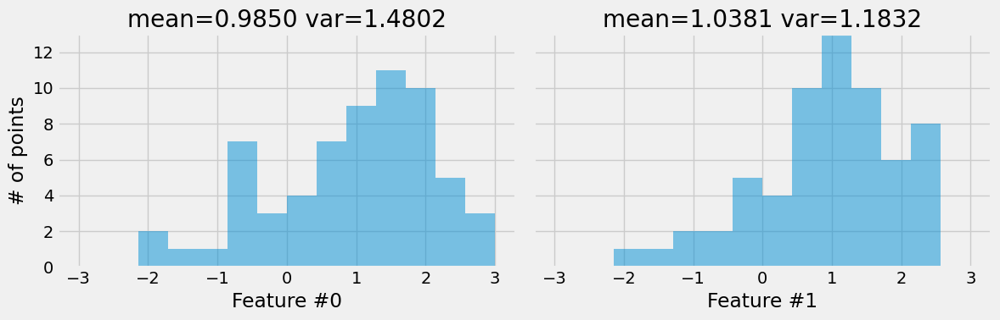

In [ ]:
fig = before_batchnorm(batch1)

In [ ]:
batch_normalizer = nn.BatchNorm1d(num_features=2, affine=False, momentum=None)
batch_normalizer.state_dict()

OrderedDict([('running_mean', tensor([0., 0.])),
             ('running_var', tensor([1., 1.])),
             ('num_batches_tracked', tensor(0))])

In [ ]:
normed1 = batch_normalizer(batch1[0])
normed1

tensor([[ 3.5294e-02,  2.4507e-01],
        [ 1.0954e+00, -5.6060e-01],
        [-1.2684e+00,  4.4658e-01],
        [-5.9223e-01, -4.6068e-01],
        [-1.2011e-01,  4.5633e-01],
        [ 4.4574e-01,  5.4753e-01],
        [ 1.3022e+00, -3.4447e-02],
        [ 1.0362e-01, -1.1256e-01],
        [-3.7560e-01, -8.1757e-02],
        [ 4.3082e-02, -3.0999e-01],
        [-5.8744e-02, -2.6682e-03],
        [ 2.3332e-01, -5.1483e-03],
        [-2.5645e+00, -2.2702e-02],
        [ 8.7857e-01,  1.3181e+00],
        [ 1.5394e+00, -1.4564e+00],
        [-1.2924e+00,  9.4922e-01],
        [ 1.9194e-01, -1.3980e+00],
        [ 6.7805e-01, -4.1402e-01],
        [-1.0289e+00, -7.6355e-01],
        [ 6.4708e-01, -2.6097e-01],
        [ 1.3352e+00,  2.5475e-01],
        [ 5.4173e-01,  8.6071e-01],
        [ 4.6939e-01,  1.1206e-01],
        [-3.6800e-01,  1.0380e+00],
        [ 3.0614e-01,  1.3793e-01],
        [ 1.2011e+00, -8.2151e-01],
        [ 1.6119e+00,  3.7348e-01],
        [ 1.1179e+00,  7.633

In [ ]:
batch_normalizer.state_dict()

OrderedDict([('running_mean', tensor([0.9850, 1.0381])),
             ('running_var', tensor([1.4802, 1.1832])),
             ('num_batches_tracked', tensor(1))])

In [ ]:
normed1.mean(axis=0), normed1.var(axis=0)

(tensor([6.7055e-08, 1.4435e-07]), tensor([1.0159, 1.0159]))

In [ ]:
normed1.var(axis=0, unbiased=False)

tensor([1.0000, 1.0000])

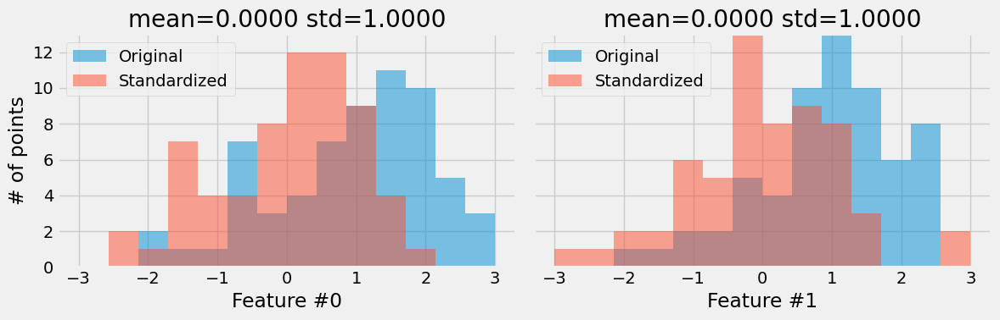

In [ ]:
fig = after_batchnorm(batch1, normed1)

In [ ]:
normed2 = batch_normalizer(batch2[0])
batch_normalizer.state_dict()

OrderedDict([('running_mean', tensor([0.9611, 0.9964])),
             ('running_var', tensor([1.4247, 1.0460])),
             ('num_batches_tracked', tensor(2))])

In [ ]:
mean2, var2 = batch2[0].mean(axis=0), batch2[0].var(axis=0)
running_mean, running_var = (mean1 + mean2) / 2, (var1 + var2) / 2
running_mean, running_var

(tensor([0.9611, 0.9964]), tensor([1.4247, 1.0460]))

In [ ]:
batch_normalizer.eval()
normed3 = batch_normalizer(batch3[0])
normed3.mean(axis=0), normed3.var(axis=0, unbiased=False)

(tensor([-0.0201,  0.2208]), tensor([0.7170, 1.0761]))

In [ ]:
batch_normalizer_mom = nn.BatchNorm1d(num_features=2, affine=False, momentum=0.1)
batch_normalizer_mom.state_dict()

OrderedDict([('running_mean', tensor([0., 0.])),
             ('running_var', tensor([1., 1.])),
             ('num_batches_tracked', tensor(0))])

In [ ]:
normed1_mom = batch_normalizer_mom(batch1[0])
batch_normalizer_mom.state_dict()

OrderedDict([('running_mean', tensor([0.0985, 0.1038])),
             ('running_var', tensor([1.0480, 1.0183])),
             ('num_batches_tracked', tensor(1))])

In [ ]:
running_mean = torch.zeros((1, 2))
running_mean

tensor([[0., 0.]])

In [ ]:
running_mean = 0.1 * batch1[0].mean(axis=0) + (1 - 0.1) * running_mean
running_mean

tensor([[0.0985, 0.1038]])

In [ ]:
torch.manual_seed(39)
dummy_images = torch.rand((200, 3, 10, 10))
dummy_labels = torch.randint(2, (200, 1))
dummy_dataset = TensorDataset(dummy_images, dummy_labels)
dummy_loader = DataLoader(dummy_dataset, batch_size=64, shuffle=True)

iterator = iter(dummy_loader)
batch1 = next(iterator)
batch1[0].shape

torch.Size([64, 3, 10, 10])

In [ ]:
batch_normalizer = nn.BatchNorm2d(num_features=3, affine=False, momentum=None)
normed1 = batch_normalizer(batch1[0])
normed1.mean(axis=[0, 2, 3]), normed1.var(axis=[0, 2, 3], unbiased=False)

(tensor([ 2.3283e-08, -2.3693e-08,  8.8960e-08]),
 tensor([0.9999, 0.9999, 0.9999]))

## Learning the Identity

In [ ]:
torch.manual_seed(23)
dummy_points = torch.randn((100, 1))
dummy_dataset = TensorDataset(dummy_points, dummy_points)
dummy_loader = DataLoader(dummy_dataset, batch_size=16, shuffle=True)

In [ ]:
class Dummy(nn.Module):
  def __init__(self):
    super(Dummy, self).__init__()
    self.linear = nn.Linear(1, 1)
    self.activation = nn.ReLU()

  def forward(self, x):
    out = self.linear(x)
    out = self.activation(out)
    return out

In [ ]:
torch.manual_seed(555)
dummy_model = Dummy()
dummy_loss_fn = nn.MSELoss()
dummy_optimizer = optim.SGD(dummy_model.parameters(), lr=0.1)

In [ ]:
dummy_sbs = StepByStep(dummy_model, dummy_loss_fn, dummy_optimizer)
dummy_sbs.set_loaders(dummy_loader)
dummy_sbs.train(200)

In [ ]:
np.concatenate([dummy_points[:5].numpy(),
                dummy_sbs.predict(dummy_points)[:5]], axis=1)

array([[-0.9012059 ,  0.        ],
       [ 0.56559485,  0.56559485],
       [-0.48822638,  0.        ],
       [ 0.75069577,  0.7506957 ],
       [ 0.58925384,  0.58925384]], dtype=float32)

In [ ]:
class DummyResidual(nn.Module):
  def __init__(self):
    super(DummyResidual, self).__init__()
    self.linear = nn.Linear(1, 1)
    self.activation = nn.ReLU()

  def forward(self, x):
    identity = x
    out = self.linear(x)
    out = self.activation(out)
    out = out + identity
    return out

In [ ]:
torch.manual_seed(555)
dummy_model = DummyResidual()
dummy_loss_fn = nn.MSELoss()
dummy_optimizer = optim.SGD(dummy_model.parameters(), lr=0.1)
dummy_sbs = StepByStep(dummy_model, dummy_loss_fn, dummy_optimizer)
dummy_sbs.set_loaders(dummy_loader)
dummy_sbs.train(100)

In [ ]:
np.concatenate([dummy_points[:5].numpy(),
                dummy_sbs.predict(dummy_points)[:5]], axis=1)

array([[-0.9012059 , -0.9012059 ],
       [ 0.56559485,  0.56559485],
       [-0.48822638, -0.48822638],
       [ 0.75069577,  0.75069577],
       [ 0.58925384,  0.58925384]], dtype=float32)

In [ ]:
dummy_model.state_dict()

OrderedDict([('linear.weight', tensor([[0.1490]])),
             ('linear.bias', tensor([-0.3329]))])

In [ ]:
dummy_points.max()

tensor(2.2347)

In [ ]:
class ResidualBlock(nn.Module):
  def __init__(self, in_channels, out_channels, stride=1, skip=True):
    super(ResidualBlock, self).__init__()
    self.skip = skip

    self.conv1 = nn.Conv2d(
        in_channels,
        out_channels,
        kernel_size=3,
        padding=1,
        stride=stride,
        bias=False
    )

    self.bn1 = nn.BatchNorm2d(out_channels)
    self.relu = nn.ReLU(inplace=True)

    self.conv2 = nn.Conv2d(
        out_channels,
        out_channels,
        kernel_size=3,
        padding=1,
        bias=False
    )

    self.bn2 = nn.BatchNorm2d(out_channels)

    self.downsample = None
    if out_channels != in_channels:
      self.downsample = nn.Conv2d(
          in_channels,
          out_channels,
          kernel_size=1,
          stride=stride
      )

  def forward(self, x):
    identity = x
    out = self.conv1(x)
    out = self.bn1(out)
    out = self.relu(out)

    out = self.conv2(out)
    out = self.bn2(out)

    if self.skip:
      if self.downsample is not None:
        identity = self.downsample(x)
      out += identity

    out = self.relu(out)
    return out

In [ ]:
scissors = Image.open('rps/scissors/scissors01-001.png')
image = ToDtype(torch.float32, scale=True)(ToImage()(scissors))[:3, :, :].view(1, 3, 300, 300)
seed = 14
torch.manual_seed(seed)
skip_image = ResidualBlock(3, 3)(image)
skip_image = ToPILImage()(skip_image[0])

torch.manual_seed(seed)
noskip_image = ResidualBlock(3, 3, skip=False)(image)
noskip_image = ToPILImage()(noskip_image[0])

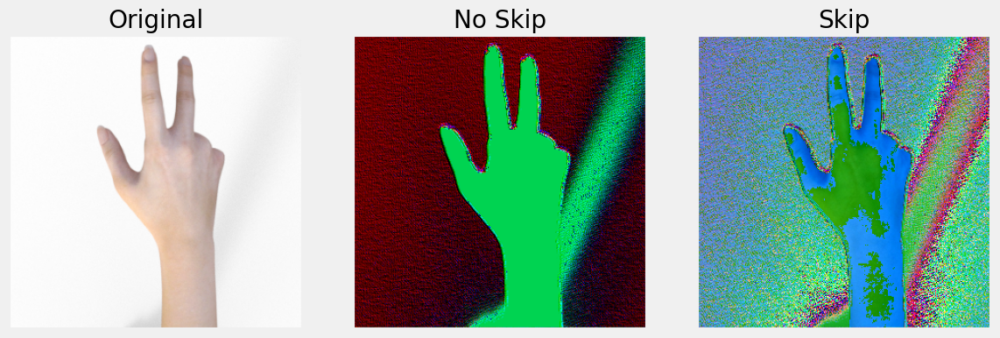

In [ ]:
fig = compare_skip(scissors, noskip_image, skip_image)

In [ ]:
# ImageNet statistics
normalizer = Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])

composer = Compose([Resize(256),
                    CenterCrop(224),
                    ToImage(),
                    ToDtype(torch.float32, scale=True),
                    normalizer])

train_data = ImageFolder(root='rps', transform=composer)
val_data = ImageFolder(root='rps-test-set', transform=composer)

# Builds a loader of each set
train_loader = DataLoader(train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16)

In [ ]:
from torchvision.models.resnet import ResNet18_Weights

model = resnet18(weights=ResNet18_Weights.DEFAULT)

torch.manual_seed(42)
model.fc = nn.Linear(512, 3)

In [ ]:
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_model = optim.Adam(model.parameters(), lr=3e-4)
sbs_transfer = StepByStep(model, multi_loss_fn, optimizer_model)

In [ ]:
sbs_transfer.set_loaders(train_loader, val_loader)
sbs_transfer.train(1)

KeyboardInterrupt: 

In [ ]:
StepByStep.loader_apply(val_loader, sbs_transfer.correct)

In [ ]:
from torchvision.models.resnet import ResNet18_Weights

device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = resnet18(weights=ResNet18_Weights.DEFAULT).to(device)

model.fc = nn.Identity()
freeze_model(model)

In [ ]:
train_preproc = preprocessed_dataset(model, train_loader)
val_preproc = preprocessed_dataset(model, val_loader)
train_preproc_loader = DataLoader(train_preproc, batch_size=16, shuffle=True)
val_preproc_loader = DataLoader(val_preproc, batch_size=16)

In [ ]:
torch.manual_seed(42)
top_model = nn.Sequential(nn.Linear(512, 3))
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_top = optim.Adam(top_model.parameters(), lr=3e-4)

In [ ]:
sbs_top = StepByStep(top_model, multi_loss_fn, optimizer_top)
sbs_top.set_loaders(train_preproc_loader, val_preproc_loader)
sbs_top.train(10)

In [ ]:
StepByStep.loader_apply(val_preproc_loader, sbs_top.correct)

In [ ]:
model.fc = top_model
sbs_temp = StepByStep(model, None, None)

In [ ]:
StepByStep.loader_apply(val_loader, sbs_temp.correct)

In [ ]:
import pandas as pd
import numpy as np

# Sample dataset
data = {
    'Student': ['Alice', 'Bob', 'Charlie', 'David', 'Eva'],
    'Age': [20, 21, 19, 22, 20],
    'Grade': ['A', 'B', 'C', 'B', 'A'],
    'Score': [85, 78, 65, 80, 95]
}

df = pd.DataFrame(data)

df

,Student,Age,Grade,Score
0,Alice,20,A,85
1,Bob,21,B,78
2,Charlie,19,C,65
3,David,22,B,80
4,Eva,20,A,95


In [ ]:
df['Student']

,Student
0,Alice
1,Bob
2,Charlie
3,David
4,Eva


In [ ]:
df.loc[1]

,1
Student,Bob
Age,21
Grade,B
Score,78


In [ ]:
df.iloc[0]

,0
Student,Alice
Age,20
Grade,A
Score,85


In [ ]:
df.iloc[1]

,1
Student,Bob
Age,21
Grade,B
Score,78


In [ ]:
df.loc[1, 'Student']

'Bob'

In [ ]:
df.loc[1:3, ['Student', 'Grade']]

,Student,Grade
1,Bob,B
2,Charlie,C
3,David,B


In [ ]:
df.iloc[2]

,2
Student,Charlie
Age,19
Grade,C
Score,65


In [ ]:
df.iloc[2, 0]

'Charlie'

In [ ]:
df.iloc[1:4, [0, 2]]

,Student,Grade
1,Bob,B
2,Charlie,C
3,David,B


In [ ]:
df.iloc[1:4]

,Student,Age,Grade,Score
1,Bob,21,B,78
2,Charlie,19,C,65
3,David,22,B,80


In [ ]:
df[df['Grade'] == 'A']

,Student,Age,Grade,Score
0,Alice,20,A,85
4,Eva,20,A,95


In [ ]:
df[df['Score'] > 80]

,Student,Age,Grade,Score
0,Alice,20,A,85
4,Eva,20,A,95


In [ ]:
# Creating a multi-index dataframe
index = pd.MultiIndex.from_product([
    ['North', 'South', 'East', 'West'], # Regions
    pd.date_range('2024-01-01', periods=5, freq='D')
], names=['Region', 'Date'])

In [ ]:
index

MultiIndex([('North', '2024-01-01'),
            ('North', '2024-01-02'),
            ('North', '2024-01-03'),
            ('North', '2024-01-04'),
            ('North', '2024-01-05'),
            ('South', '2024-01-01'),
            ('South', '2024-01-02'),
            ('South', '2024-01-03'),
            ('South', '2024-01-04'),
            ('South', '2024-01-05'),
            ( 'East', '2024-01-01'),
            ( 'East', '2024-01-02'),
            ( 'East', '2024-01-03'),
            ( 'East', '2024-01-04'),
            ( 'East', '2024-01-05'),
            ( 'West', '2024-01-01'),
            ( 'West', '2024-01-02'),
            ( 'West', '2024-01-03'),
            ( 'West', '2024-01-04'),
            ( 'West', '2024-01-05')],
           names=['Region', 'Date'])

In [ ]:
import numpy as np

data = {
    'Product': np.random.choice(['A', 'B', 'C'], len(index)),
    'Sales': np.random.randint(100, 500, len(index)),
    'Revenue': np.random.uniform(1000, 5000, len(index)).round(2)
}

data

{'Product': array(['A', 'A', 'C', 'B', 'C', 'A', 'C', 'B', 'C', 'C', 'C', 'B', 'A',
        'C', 'C', 'B', 'A', 'B', 'C', 'C'], dtype='<U1'),
 'Sales': array([343, 444, 465, 105, 477, 444, 157, 102, 451, 367, 187, 209, 384,
        356, 153, 351, 166, 193, 119, 123]),
 'Revenue': array([2018.65, 4087.39, 4892.79, 3162.35, 4738.59, 1666.06, 4971.6 ,
        1789.88, 3224.65, 4832.13, 2061.38, 1889.94, 3757.53, 2134.57,
        1135.93, 4528.01, 4556.67, 3037.2 , 2857.46, 2326.63])}

In [ ]:
pd.DataFrame(data, index=index)
df

,Student,Age,Grade,Score
0,Alice,20,A,85
1,Bob,21,B,78
2,Charlie,19,C,65
3,David,22,B,80
4,Eva,20,A,95


In [ ]:
index

MultiIndex([('North', '2024-01-01'),
            ('North', '2024-01-02'),
            ('North', '2024-01-03'),
            ('North', '2024-01-04'),
            ('North', '2024-01-05'),
            ('South', '2024-01-01'),
            ('South', '2024-01-02'),
            ('South', '2024-01-03'),
            ('South', '2024-01-04'),
            ('South', '2024-01-05'),
            ( 'East', '2024-01-01'),
            ( 'East', '2024-01-02'),
            ( 'East', '2024-01-03'),
            ( 'East', '2024-01-04'),
            ( 'East', '2024-01-05'),
            ( 'West', '2024-01-01'),
            ( 'West', '2024-01-02'),
            ( 'West', '2024-01-03'),
            ( 'West', '2024-01-04'),
            ( 'West', '2024-01-05')],
           names=['Region', 'Date'])

In [ ]:
data

{'Product': array(['A', 'A', 'C', 'B', 'C', 'A', 'C', 'B', 'C', 'C', 'C', 'B', 'A',
        'C', 'C', 'B', 'A', 'B', 'C', 'C'], dtype='<U1'),
 'Sales': array([343, 444, 465, 105, 477, 444, 157, 102, 451, 367, 187, 209, 384,
        356, 153, 351, 166, 193, 119, 123]),
 'Revenue': array([2018.65, 4087.39, 4892.79, 3162.35, 4738.59, 1666.06, 4971.6 ,
        1789.88, 3224.65, 4832.13, 2061.38, 1889.94, 3757.53, 2134.57,
        1135.93, 4528.01, 4556.67, 3037.2 , 2857.46, 2326.63])}

In [ ]:
df = pd.DataFrame(data, index=index)
df

Product  Sales  Revenue
Region Date                              
North  2024-01-01       A    343  2018.65
       2024-01-02       A    444  4087.39
       2024-01-03       C    465  4892.79
       2024-01-04       B    105  3162.35
       2024-01-05       C    477  4738.59
South  2024-01-01       A    444  1666.06
       2024-01-02       C    157  4971.60
       2024-01-03       B    102  1789.88
       2024-01-04       C    451  3224.65
       2024-01-05       C    367  4832.13
East   2024-01-01       C    187  2061.38
       2024-01-02       B    209  1889.94
       2024-01-03       A    384  3757.53
       2024-01-04       C    356  2134.57
       2024-01-05       C    153  1135.93
West   2024-01-01       B    351  4528.01
       2024-01-02       A    166  4556.67
       2024-01-03       B    193  3037.20
       2024-01-04       C    119  2857.46
       2024-01-05       C    123  2326.63

In [ ]:
index = pd.MultiIndex.from_product([
    ['North', 'South', 'East', 'West'],
    pd.date_range('2024-01-01', periods=5, freq='D')
], names=['Region', 'Date'])

In [ ]:
index

MultiIndex([('North', '2024-01-01'),
            ('North', '2024-01-02'),
            ('North', '2024-01-03'),
            ('North', '2024-01-04'),
            ('North', '2024-01-05'),
            ('South', '2024-01-01'),
            ('South', '2024-01-02'),
            ('South', '2024-01-03'),
            ('South', '2024-01-04'),
            ('South', '2024-01-05'),
            ( 'East', '2024-01-01'),
            ( 'East', '2024-01-02'),
            ( 'East', '2024-01-03'),
            ( 'East', '2024-01-04'),
            ( 'East', '2024-01-05'),
            ( 'West', '2024-01-01'),
            ( 'West', '2024-01-02'),
            ( 'West', '2024-01-03'),
            ( 'West', '2024-01-04'),
            ( 'West', '2024-01-05')],
           names=['Region', 'Date'])

In [ ]:
len(index)

20

In [ ]:
np.random.choice(['A', 'B', 'C'], len(index))

array(['C', 'B', 'A', 'C', 'C', 'A', 'B', 'B', 'A', 'C', 'A', 'B', 'C',
       'C', 'A', 'C', 'C', 'C', 'C', 'C'], dtype='<U1')

In [ ]:
np.random.randint(100, 500, len(index))

array([440, 239, 363, 464, 133, 499, 148, 457, 153, 292, 217, 168, 111,
       121, 215, 489, 214, 154, 108, 447])

In [ ]:
np.random.uniform(1000, 5000, len(index)).round(2)

array([4181.35, 4845.37, 2824.18, 1664.59, 4627.71, 3025.88, 2718.31,
       3593.62, 1896.78, 3722.08, 4689.82, 4245.78, 2562.17, 4121.44,
       4879.7 , 4572.24, 4510.77, 2729.29, 3153.37, 1362.52])

In [ ]:
df = pd.DataFrame(data, index=index)
df

Product  Sales  Revenue
Region Date                              
North  2024-01-01       A    343  2018.65
       2024-01-02       A    444  4087.39
       2024-01-03       C    465  4892.79
       2024-01-04       B    105  3162.35
       2024-01-05       C    477  4738.59
South  2024-01-01       A    444  1666.06
       2024-01-02       C    157  4971.60
       2024-01-03       B    102  1789.88
       2024-01-04       C    451  3224.65
       2024-01-05       C    367  4832.13
East   2024-01-01       C    187  2061.38
       2024-01-02       B    209  1889.94
       2024-01-03       A    384  3757.53
       2024-01-04       C    356  2134.57
       2024-01-05       C    153  1135.93
West   2024-01-01       B    351  4528.01
       2024-01-02       A    166  4556.67
       2024-01-03       B    193  3037.20
       2024-01-04       C    119  2857.46
       2024-01-05       C    123  2326.63

In [ ]:
df.loc['North']

,Product,Sales,Revenue
Date,,,
2024-01-01,A,343,2018.65
2024-01-02,A,444,4087.39
2024-01-03,C,465,4892.79
2024-01-04,B,105,3162.35
2024-01-05,C,477,4738.59


In [ ]:
df.loc[('North', '2024-01-01')]

,North
,2024-01-01
Product,A
Sales,343
Revenue,2018.65


In [ ]:
df.loc['North', 'Sales']

,Sales
Date,
2024-01-01,343
2024-01-02,444
2024-01-03,465
2024-01-04,105
2024-01-05,477


In [ ]:
df.loc[('North', '2024-01-02'),'Sales']

444

In [ ]:
df.loc[:, 'Sales']

Region  Date      
North   2024-01-01    343
        2024-01-02    444
        2024-01-03    465
        2024-01-04    105
        2024-01-05    477
South   2024-01-01    444
        2024-01-02    157
        2024-01-03    102
        2024-01-04    451
        2024-01-05    367
East    2024-01-01    187
        2024-01-02    209
        2024-01-03    384
        2024-01-04    356
        2024-01-05    153
West    2024-01-01    351
        2024-01-02    166
        2024-01-03    193
        2024-01-04    119
        2024-01-05    123
Name: Sales, dtype: int64

In [ ]:
df.iloc[0]

,North
,2024-01-01
Product,A
Sales,343
Revenue,2018.65


In [ ]:
df.iloc[:5]

Product  Sales  Revenue
Region Date                              
North  2024-01-01       A    343  2018.65
       2024-01-02       A    444  4087.39
       2024-01-03       C    465  4892.79
       2024-01-04       B    105  3162.35
       2024-01-05       C    477  4738.59

In [ ]:
df.iloc[:5, 1]

Region  Date      
North   2024-01-01    343
        2024-01-02    444
        2024-01-03    465
        2024-01-04    105
        2024-01-05    477
Name: Sales, dtype: int64

In [ ]:
df[df.Sales > 300]

Product  Sales  Revenue
Region Date                              
North  2024-01-01       A    343  2018.65
       2024-01-02       A    444  4087.39
       2024-01-03       C    465  4892.79
       2024-01-05       C    477  4738.59
South  2024-01-01       A    444  1666.06
       2024-01-04       C    451  3224.65
       2024-01-05       C    367  4832.13
East   2024-01-03       A    384  3757.53
       2024-01-04       C    356  2134.57
West   2024-01-01       B    351  4528.01

In [ ]:
df[(df.Sales > 300 & (df.index.get_level_values('Region') == 'North'))]

Product  Sales  Revenue
Region Date                              
North  2024-01-01       A    343  2018.65
       2024-01-02       A    444  4087.39
       2024-01-03       C    465  4892.79
       2024-01-04       B    105  3162.35
       2024-01-05       C    477  4738.59
South  2024-01-01       A    444  1666.06
       2024-01-02       C    157  4971.60
       2024-01-03       B    102  1789.88
       2024-01-04       C    451  3224.65
       2024-01-05       C    367  4832.13
East   2024-01-01       C    187  2061.38
       2024-01-02       B    209  1889.94
       2024-01-03       A    384  3757.53
       2024-01-04       C    356  2134.57
       2024-01-05       C    153  1135.93
West   2024-01-01       B    351  4528.01
       2024-01-02       A    166  4556.67
       2024-01-03       B    193  3037.20
       2024-01-04       C    119  2857.46
       2024-01-05       C    123  2326.63

In [ ]:
df.index

MultiIndex([('North', '2024-01-01'),
            ('North', '2024-01-02'),
            ('North', '2024-01-03'),
            ('North', '2024-01-04'),
            ('North', '2024-01-05'),
            ('South', '2024-01-01'),
            ('South', '2024-01-02'),
            ('South', '2024-01-03'),
            ('South', '2024-01-04'),
            ('South', '2024-01-05'),
            ( 'East', '2024-01-01'),
            ( 'East', '2024-01-02'),
            ( 'East', '2024-01-03'),
            ( 'East', '2024-01-04'),
            ( 'East', '2024-01-05'),
            ( 'West', '2024-01-01'),
            ( 'West', '2024-01-02'),
            ( 'West', '2024-01-03'),
            ( 'West', '2024-01-04'),
            ( 'West', '2024-01-05')],
           names=['Region', 'Date'])

In [ ]:
df[(df['Revenue'] > 2000) & (df['Revenue'] < 3000)]

Product  Sales  Revenue
Region Date                              
North  2024-01-01       A    343  2018.65
East   2024-01-01       C    187  2061.38
       2024-01-04       C    356  2134.57
West   2024-01-04       C    119  2857.46
       2024-01-05       C    123  2326.63

In [ ]:
# Select 'Sales' for 'North' and 'South' regions on '2024-01-01'
df.loc[(df.index.get_level_values('Region').isin(['North', 'South'])) & (df.index.get_level_values('Date') == '2024-01-01'), 'Sales']

,,Sales
Region,Date,
North,2024-01-01,343
South,2024-01-01,444


In [ ]:
import pandas as pd

data = {
    'Name': ['Alice', 'Bob', 'Charlie', 'David'],
    'Age': [25, 30, 22, 35],
    'City': ['New York', 'Los Angeles', 'Chicago', 'Houston']
}

df = pd.DataFrame(data)
df

,Name,Age,City
0,Alice,25,New York
1,Bob,30,Los Angeles
2,Charlie,22,Chicago
3,David,35,Houston


In [ ]:
df[df.Age > 30]

,Name,Age,City
3,David,35,Houston


In [ ]:
import pandas as pd
data = {
    'Product': ['Laptop', 'Phone', 'Tablet', 'Watch', 'Speaker'],
    'Category': ['Electronics', 'Electronics', 'Electronics', 'Wearables', 'Electronics'],
    'Price': [800, 500, 300, 200, 100]
}

df = pd.DataFrame(data)
df

,Product,Category,Price
0,Laptop,Electronics,800
1,Phone,Electronics,500
2,Tablet,Electronics,300
3,Watch,Wearables,200
4,Speaker,Electronics,100


In [ ]:
df[(df['Category'] == 'Electronics') & (df['Price'] > 400)]

,Product,Category,Price
0,Laptop,Electronics,800
1,Phone,Electronics,500


In [ ]:
df[~(df['Category'] == 'Electronics') | (df['Price'] < 250)]

,Product,Category,Price
3,Watch,Wearables,200
4,Speaker,Electronics,100


In [ ]:
categories = ['Electronics', 'Wearables']
filtered_df = df[df['Category'].isin(categories)]
filtered_df

,Product,Category,Price
0,Laptop,Electronics,800
1,Phone,Electronics,500
2,Tablet,Electronics,300
3,Watch,Wearables,200
4,Speaker,Electronics,100


In [ ]:
df.query('Price > 300 and Category == "Electronics"')

,Product,Category,Price
0,Laptop,Electronics,800
1,Phone,Electronics,500


In [ ]:
sorted_df = df.sort_values(by='Price')
sorted_df

,Product,Category,Price
4,Speaker,Electronics,100
3,Watch,Wearables,200
2,Tablet,Electronics,300
1,Phone,Electronics,500
0,Laptop,Electronics,800


In [ ]:
df.sort_values(by='Price', ascending=False)


,Product,Category,Price
0,Laptop,Electronics,800
1,Phone,Electronics,500
2,Tablet,Electronics,300
3,Watch,Wearables,200
4,Speaker,Electronics,100


In [ ]:
sorted_df = df.sort_values(by=['Category', 'Price'], ascending=[True, False])
sorted_df

,Product,Category,Price
0,Laptop,Electronics,800
1,Phone,Electronics,500
2,Tablet,Electronics,300
4,Speaker,Electronics,100
3,Watch,Wearables,200


In [ ]:
gdf = df.groupby('Category')
gdf

In [ ]:
gdf['Price'].mean()

,Price
Category,
Electronics,425.0
Wearables,200.0


In [ ]:
gdf['Category'].count()

,Category
Category,
Electronics,4
Wearables,1


In [ ]:
gdf['Product'].count()

,Product
Category,
Electronics,4
Wearables,1


In [ ]:
gdf['Price'].agg(['mean', 'max', 'min'])

,mean,max,min
Category,,,
Electronics,425.0,800,100
Wearables,200.0,200,200


In [ ]:
df.groupby('Category').describe()

Price                                                      
            count   mean         std    min    25%    50%    75%    max
Category                                                               
Electronics   4.0  425.0  298.607881  100.0  250.0  400.0  575.0  800.0
Wearables     1.0  200.0         NaN  200.0  200.0  200.0  200.0  200.0

In [ ]:
df.groupby('Category')['Price'].max()

,Price
Category,
Electronics,800
Wearables,200


In [ ]:
def price_percentile(prices):
  return prices.rank(pct=True)

In [ ]:
df['Price Percentile'] = df.groupby('Category')['Price'].transform(price_percentile)
df

,Product,Category,Price,Price Percentile
0,Laptop,Electronics,800,1.00
1,Phone,Electronics,500,0.75
2,Tablet,Electronics,300,0.50
3,Watch,Wearables,200,1.00
4,Speaker,Electronics,100,0.25


In [ ]:
500 / 800

0.625

In [ ]:
import numpy as np

def log_loss(y_true, y_proba):
  """
  Function to calculate log loss
  :param y_true: list of true values
  :param y_proba: list of probabilities for 1
  :return: overall log loss
  """
  # define an epsilon value
  # this can also be an input
  # this value is used to clip probabilities
  epsilon = 1e-15

  # Initialise empty list to store individual losses
  loss = []

  # loop over all tre and predicted probability values
  for yt, yp in zip(y_true, y_proba):
    # adjust probability
    # 0 gets converted to 1e-15
    # 1 gets converted to 1 - 1e-15
    # Why? Think abot it!
    yp = np.clip(yp, epsilon, 1 - epsilon)
    # calculate loss for one sample
    temp_loss = -1.0 * (yt * np.log(yp) + (1 - yt) * np.log(1 - yp))
    # add to loss list
    loss.append(temp_loss)
  # return mean loss over all samples
  return np.mean(loss)

In [ ]:
y_true = [0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]

y_proba = [0.1, 0.3, 0.2, 0.6, 0.8, 0.05, 0.9, 0.5, 0.3, 0.66, 0.3, 0.2, 0.85, 0.15, 0.99]

In [ ]:
log_loss(y_true, y_proba)

0.49882711861432294

In [ ]:
from sklearn import metrics

metrics.log_loss(y_true, y_proba)

0.49882711861432294

In [ ]:
def true_positive(y_true, y_pred):
  tp = 0
  for yt, yp in zip(y_true, y_pred):
    if yt == 1 and yp == 1:
      tp += 1
  return tp

def false_positive(y_true, y_pred):
  fp = 0
  for yt, yp in zip(y_true, y_pred):
    if yt == 0 and yp == 1:
      fp += 1
  return fp

def true_negative(y_true, y_pred):
  tn = 0
  for yt, yp in zip(y_true, y_pred):
    if yt == 0 and yp == 0:
      tn += 1
  return tn

def false_negative(y_true, y_pred):
  fn = 0
  for yt, yp in zip(y_true, y_pred):
    if yt == 1 and yp == 0:
      fn += 1
  return fn

def accuracy_v2(y_true, y_pred):
  tp = true_positive(y_true, y_pred)
  fp = false_positive(y_true, y_pred)
  tn = true_negative(y_true, y_pred)
  fn = false_negative(y_true, y_pred)
  accuracy_score = (tp + tn) / (tp + tn + fp + fn)
  return accuracy_score

def precision(y_true, y_pred):
  tp = true_positive(y_true, y_pred)
  fp = false_positive(y_true, y_pred)
  precision = tp / (tp + fp)
  return precision

def recall(y_true, y_pred):
  tp = true_positive(y_true, y_pred)
  fn = false_positive(y_true, y_pred)
  recall = tp / (tp + fn)
  return recall

def f1(y_true, y_pred):
  p = precision(y_true, y_pred)
  r = recall(y_true, y_pred)
  score = 2 * p * r / (p + r)
  return score

def tpr(y_true, y_pred):
  return recall(y_true, y_pred)

def fpr(y_true, y_pred):
  fp = false_positive(y_true, y_pred)
  tn = true_positive(y_true, y_pred)
  return fp / (tn + fp)



In [ ]:
import numpy as np

def macro_precision(y_true, y_pred):
  """
  Function to calculate macro averaged precision
  :param y_true: list of true values
  :param y_pred: list of predicted values
  :return: macro precision score
  """

  # find the number of classes by taking
  # length of unique values in true list
  num_classes = len(np.unique(y_true))

  # initialize precision to 0
  precision = 0

  # loop over all classes
  for class_ in range(num_classes):
    # all classes except the current one are considered negative
    temp_true = [1 if p == class_ else 0 for p in y_true]
    temp_pred = [1 if p == class_ else 0 for p in y_pred]

    # calculate true positive for current class
    tp = true_positive(temp_true, temp_pred)

    # calculate false positive for current class
    fp = false_positive(temp_true, temp_pred)

    # calculate precision for current class
    temp_precision = tp / (tp + fp)

    # keep adding precision for all classes
    precision += temp_precision

  # calculate and return average precision over all classes
  precision /= num_classes
  return precision

In [ ]:
import numpy as np

def micro_precision(y_true, y_pred):
  # find the number of classes by taking
  # the length of unique values in true list
  num_classes = len(np.unique(y_true))

  # initialise tp and fp to 0
  tp = 0
  fp = 0

  # loop over all classes
  for class_ in range(num_classes):
    # all classes except the current one are considered negative
    temp_true = [1 if p == class_ else 0 for p in y_true]
    temp_pred = [1 if p == class_ else 0 for p in y_pred]

    # calculate true positive for current class and update overall tp
    tp += true_positive(temp_true, temp_pred)

    # calculate false positive for current class and update overall fp
    fp += false_positive(temp_true, temp_pred)

  # calculate and return overall precision
  precision = tp / (tp + fp)
  return precision

In [ ]:
from collections import Counter
import numpy as np

def weighted_precision(y_true, y_pred):
  """
  Function to calculate weighted averaged precision
  :param y_true: list of true values
  :param y_pred: list of predicted values
  :return: weighted precision score
  """

  # find the number of classes by taking
  # length of unique values in true list
  num_classes = len(np.unique(y_true))

  # create class: sample count dictionary
  # it looks something like this
  # {0: 20, 1:15, 2:21}
  class_counts = Counter(y_true)

  # initialize precision to 0
  precision = 0

  # loop over all classes
  for class_ in range(num_classes):
    # all classes except the current one are considered negative
    temp_true = [1 if p == class_ else 0 for p in y_true]
    temp_pred = [1 if p == class_ else 0 for p in y_pred]

    # calculate tp and fp for class
    tp = true_positive(temp_true, temp_pred)
    fp = false_positive(temp_true, temp_pred)

    # calculate precision of class
    temp_precision = tp / (tp + fp)

    # multiply precision with count of samples in class
    weighted_precision = class_counts[class_] * temp_precision

    # add to overall precision
    precision += weighted_precision

  # calculate overall precision by dividing by total number of samples
  overall_precision = precision / len(y_true)
  return overall_precision

In [ ]:
from sklearn import metrics

In [ ]:
y_true = [0, 1, 2, 0, 1, 2, 0, 2, 2]
y_pred = [0, 2, 1, 0, 2, 1, 0, 0, 2]

In [ ]:
macro_precision(y_true, y_pred)

0.3611111111111111

In [ ]:
metrics.precision_score(y_true, y_pred, average='macro')

0.3611111111111111

In [ ]:
micro_precision(y_true, y_pred)

0.4444444444444444

In [ ]:
metrics.precision_score(y_true, y_pred, average='micro')

0.4444444444444444

In [ ]:
weighted_precision(y_true, y_pred)

0.39814814814814814

In [ ]:
metrics.precision_score(y_true, y_pred, average='weighted')

0.39814814814814814

In [ ]:
from collections import Counter
import numpy as np

def weighted_f1(y_true, y_pred):
  """
  Function to calculate weighted f1 score
  :param y_true: list of true values
  :param y_pred: list of predicted values
  :return: weighted f1 score
  """

  # find the number of classes by taking
  # the length of unique values in true list
  num_classes = len(np.unique(y_true))

  # create class: sample count dictionary
  # it looks something like this:
  # {0: 20, 1:15, 2:21}
  class_counts = Counter(y_true)

  # initialize f1 to 0
  f1 = 0

  # loop over all classes
  for class_ in range(num_classes):
    # all classes except the current one are considered negative
    temp_true = [1 if p == class_ else 0 for p in y_true]
    temp_pred = [1 if p == class_ else 0 for p in y_pred]

    # calculate precision and recall for class
    p = precision(temp_true, temp_pred)
    r = recall(temp_true, temp_pred)

    # calculate f1 of class
    if p + r != 0:
      temp_f1 = 2 * p * r / (p + r)
    else:
      temp_f1 = 0

    # multiply f1 with count of samples in class
    weighted_f1 = class_counts[class_] * temp_f1

    # add to f1 precision
    f1 += weighted_f1

  # calculate overall F1 by dividing by total number of samples
  overall_f1 = f1 / len(y_true)
  return overall_f1


In [ ]:
from sklearn import metrics

y_true = [0, 1, 2, 0, 1, 2, 0, 2, 2]
y_pred = [0, 2, 1, 0, 2, 1, 0, 0, 2]

weighted_f1(y_true, y_pred)

0.39814814814814814

In [ ]:
metrics.f1_score(y_true, y_pred, average='weighted')

0.4126984126984127

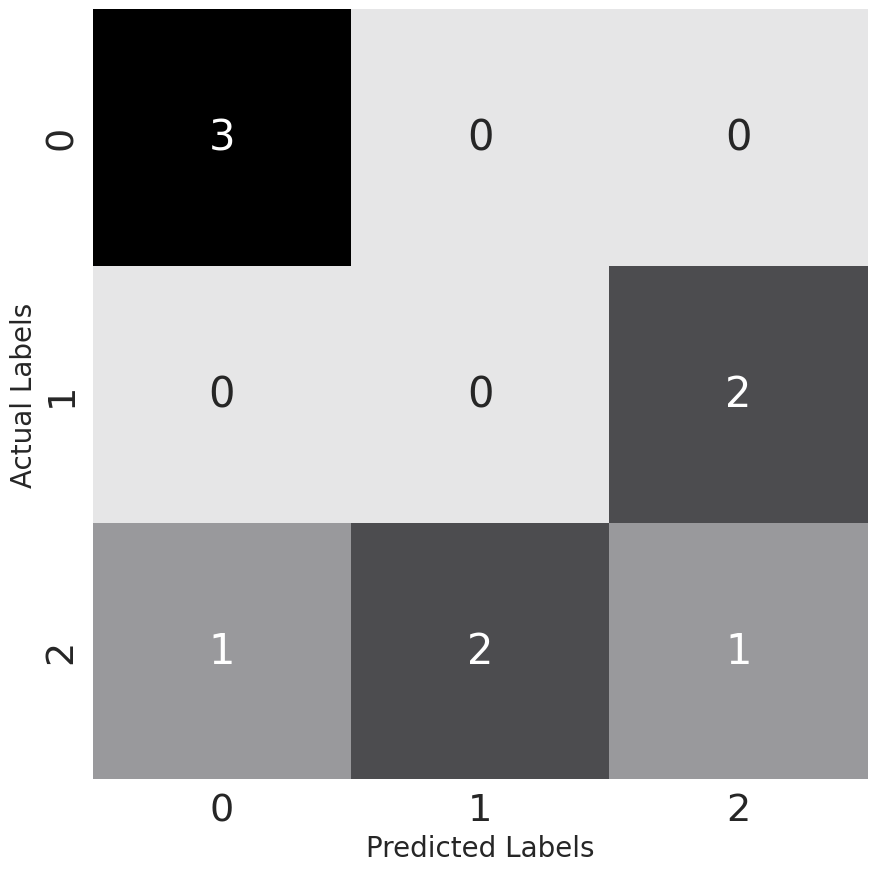

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

# some targets
y_true = [0, 1, 2, 0, 1, 2, 0, 2, 2]

# some predictions
y_pred = [0, 2, 1, 0, 2, 1, 0, 0, 2]

# get confusion matrix from sklearn
cm = metrics.confusion_matrix(y_true, y_pred)

# plot using matplotlib and seaborn
plt.figure(figsize=(10, 10))

cmap = sns.cubehelix_palette(50, hue=0.05, rot=0, light=0.9, dark=0, as_cmap=True)

sns.set(font_scale=2.5)
sns.heatmap(cm, annot=True, cmap=cmap, cbar=False)

plt.ylabel('Actual Labels', fontsize=20)
plt.xlabel('Predicted Labels', fontsize=20);

In [ ]:
def pk(y_true, y_pred, k):
  """
  This function calculates precision at k for a single sample
  :param y_true: list of values, actual classes
  :param y_pred: list of values, predicted classes
  :param k: the value for k
  :return: precision at a given value k
  """
  # if k is 0, return 0. we should never have this
  # as k is always >= 1
  if k == 0:
    return 0

  # We are interested only in top-k predictions
  y_pred = y_pred[:k]

  # convert predictions to set
  pred_set = set(y_pred)

  # convert actual values to set
  true_set = set(y_true)

  # find common values
  common_values = pred_set.intersection(true_set)

  # return length of common values over k
  return len(common_values) / len(y_pred[:k])

In [ ]:
def apk(y_true, y_pred, k):
  """
  This function calculates average precision at k
  for a single sample.
  :param y_true: list of values, actual classes
  :param y_pred: list of values, predicted classes
  :return: average precision at a given value k
  """
  # initialise p@k list of values
  pk_values = []

  # loop over all k. from 1 to k + 1
  for i in range(1, k + 1):
    # calculate p@i and append to list
    pk_values.append(pk(y_true, y_pred, i))

  # if we have no values in the list, return 0
  if len(pk_values) == 0:
    return 0
  # else, we return the sum of list over length of list
  return sum(pk_values) / len(pk_values)

In [ ]:
y_true = [
    [1, 2, 3],
    [0, 2],
    [1],
    [2, 3],
    [1, 0],
    []
]

y_pred = [
    [0, 1, 2],
    [1],
    [0, 2, 3],
    [2, 3, 4, 0],
    [0, 1, 2],
    [0]
]

In [ ]:
for i in range(len(y_true)):
  for j in range(1, 4):
    print(f"""
    y_true: {y_true[i]},
    y_pred: {y_pred[i]},
    AP@{j}: {apk(y_true[i], y_pred[i], k=j)}
    """)



    y_true: [1, 2, 3],
    y_pred: [0, 1, 2],
    AP@1: 0.0
    

    y_true: [1, 2, 3],
    y_pred: [0, 1, 2],
    AP@2: 0.25
    

    y_true: [1, 2, 3],
    y_pred: [0, 1, 2],
    AP@3: 0.38888888888888884
    

    y_true: [0, 2],
    y_pred: [1],
    AP@1: 0.0
    

    y_true: [0, 2],
    y_pred: [1],
    AP@2: 0.0
    

    y_true: [0, 2],
    y_pred: [1],
    AP@3: 0.0
    

    y_true: [1],
    y_pred: [0, 2, 3],
    AP@1: 0.0
    

    y_true: [1],
    y_pred: [0, 2, 3],
    AP@2: 0.0
    

    y_true: [1],
    y_pred: [0, 2, 3],
    AP@3: 0.0
    

    y_true: [2, 3],
    y_pred: [2, 3, 4, 0],
    AP@1: 1.0
    

    y_true: [2, 3],
    y_pred: [2, 3, 4, 0],
    AP@2: 1.0
    

    y_true: [2, 3],
    y_pred: [2, 3, 4, 0],
    AP@3: 0.8888888888888888
    

    y_true: [1, 0],
    y_pred: [0, 1, 2],
    AP@1: 1.0
    

    y_true: [1, 0],
    y_pred: [0, 1, 2],
    AP@2: 1.0
    

    y_true: [1, 0],
    y_pred: [0, 1, 2],
    AP@3: 0.8888888888888888
    

    y_true: [],


In [ ]:
def mapk(y_true, y_pred, k):
  """
  This function calculates mean avg precision at k
  for a single sample.
  :param y_true: list of values, actual classes
  :param y_pred: list of values, predicted classes
  :return: mean average precision at a given value k
  """
  # initialise empty list for apk values
  apk_values = []

  # loop over all samples
  for i in range(len(y_true)):
    # store apk values for every sample
    apk_values.append(apk(y_true[i], y_pred[i], k=k))

  # return mean of apk values list
  if len(apk_values) == 0:
    return 0
  return sum(apk_values) / len(apk_values)

In [ ]:
mapk(y_true, y_pred, k=1)

0.3333333333333333

In [ ]:
mapk(y_true, y_pred, k=0)

0.0

In [ ]:
mapk(y_true, y_pred, k=2)

0.375

In [ ]:
mapk(y_true, y_pred, k=3)

0.3611111111111111

In [ ]:
mapk(y_true, y_pred, k=4)

0.34722222222222215

In [ ]:
# taken from:
# https://github.com/benhamner/Metrics/blob/
# master/Python/ml_metrics/average_precision.py
import numpy as np
def apk(actual, predicted, k=10):
  """
  Computes the average precision at k.
  This function computes the AP at k between two lists of
  items.
  Parameters
  ----------
  actual : list
    A list of elements to be predicted (order doesn't matter)
  predicted : list
    A list of predicted elements (order does matter)
  k : int, optional
    The maximum number of predicted elements
  Returns
  -------
  score : double
  The average precision at k over the input lists
  """
  if len(predicted)>k:
    predicted = predicted[:k]

  score = 0.0
  num_hits = 0.0

  for i,p in enumerate(predicted):
    if p in actual and p not in predicted[:i]:
      num_hits += 1.0
      score += num_hits / (i+1.0)

  if not actual:
    return 0.0
  return score / min(len(actual), k)

In [ ]:
apk(y_true, y_pred, k=1)

0.0

In [ ]:
apk(y_true, y_pred, k=2)

0.25

In [ ]:
apk(y_true, y_pred, k=3)

0.16666666666666666

In [ ]:
apk(y_true, y_pred, k=4)

0.125

In [ ]:
import numpy as np

def mean_absolute_error(y_true, y_pred):
  """
  This function calculates mae
  :param y_true: list of real numbers, true values
  :param y_pred: list of real numbers, predicted values
  :return: mean absolute error
  """
  # initialise error at 0
  error = 0
  # loop over all samples in the true and predicted list
  for yt, yp in zip(y_true, y_pred):
    # calculate absolute error and add to error.
    error += np.abs(yt - yp)

  # return mean error
  return error / len(y_true)

In [ ]:
def mean_squared_error(y_true, y_pred):
  """
  This function calculates mse
  :param y_true: list of real numbers, true values
  :param y_pred: list of real numbers, predicted values
  :return: mean squared error
  """

  # initialise error at 0
  error = 0

  # loop over all samples in the true and predicted list
  for yt, yp in zip(y_true, y_pred):
    # calculate squared error and add to error
    error += (yt - yp) ** 2

  # return mean error
  return error / len(y_true)

In [ ]:
def root_mean_squared_error(y_true, y_pred):
  """
  This function calculates rmse
  :param y_true: list of real numbers, true values
  :param y_pred: list of real numbers, predicted values
  :return: root mean squared error
  """
  return np.sqrt(mean_squared_error(y_true, y_pred))

In [ ]:
import numpy as np

def mean_squared_log_error(y_true, y_pred):
  """
  This function calculates msle
  :param y_true: list of real numbers, true values
  :param y_pred: list of real numbers, predicted values
  :return: mean squared logarithmic error
  """
  # initialise error at 0
  error = 0
  # loop over all samples in true and predicted list
  for yt, yp in zip(y_true, y_pred):
    # calculate squared log error and add to error
    error += (np.log(1 + yt) - np.log(1 + yp)) ** 2

  # return mean error
  return error / len(y_true)

In [ ]:
def root_mean_squared_log_error(y_true, y_pred):
  """
  This function calculates rmsle
  :param y_true: list of real numbers, true values
  :param y_pred: list of real numbers, predicted values
  :return: root mean squared logarithmic error
  """
  return np.sqrt(mean_squared_log_error(y_true, y_pred))

In [ ]:
def mean_percentage_error(y_true, y_pred):
  """
  This function calculates mpe
  :param y_true: list of real numbers, true values
  :param y_pred: list of real numbers, predicted values
  :return: mean percentage error
  """
  # initialise error at 0
  error = 0

  # loop over all samples in true and predicted lists
  for yt, yp in zip(y_true, y_pred):
    # calculate percentage error and add it to error
    error += (yt - yp) / yt

  return error / len(y_true)

In [ ]:
import numpy as np

def mean_abs_percentage_error(y_true, y_pred):
  """
  This function calculates mape
  :param y_true: list of real numbers, true values
  :param y_pred: list of real numbers, predicted values
  :return: mean absolute percentage error
  """
  # initialise error at 0
  error = 0

  # loop over all samples in true and predicted list
  for yt, yp in zip(y_true, y_pred):
    # calculate percentage error and add to error
    error += np.abs(yt - yp) / yt

  # return mean percentage error
  return error / len(y_true)

In [ ]:
def r2(y_true, y_pred):
  """
  This function calculates r2 score
  :param y_true: list of real numbers, true values
  :param y_pred: list of real numbers, predicted values
  :return: r2 score
  """

  # calculate the mean absolute of true values
  mean_true_value = np.mean(y_true)

  # initialise numerator with 0
  numerator = 0

  # initialise denominator with 0
  denominator = 0

  # loop over all true and predicted values
  for yt, yp in zip(y_true, y_pred):
    # update numerator
    numerator += (yt - yp) ** 2

    # update denominator
    denominator += (yt - mean_true_value) ** 2

  # calculate the ratio
  ratio = numerator / denominator

  # return 1 - ratio
  return 1 - ratio

In [ ]:
import numpy as np

def mae_np(y_true, y_pred):
  return np.mean(np.abs(y_true - y_pred))

In [ ]:
from sklearn import metrics

y_true = [1, 2, 3, 1, 2, 3, 1, 2, 3]

y_pred = [2, 1, 3, 1, 2, 3, 3, 1, 2]

metrics.cohen_kappa_score(y_true, y_pred)


0.16666666666666663

In [ ]:
metrics.cohen_kappa_score(y_true, y_pred, weights='quadratic')


0.33333333333333337

In [ ]:
0.16**2

0.0256

In [ ]:
metrics.accuracy_score(y_true, y_pred)

0.4444444444444444

In [ ]:
def mcc(y_true, y_pred):
  """
  This function calculates Matthew's Correlation Coefficient
  for binary classification.
  :param y_true: list of true values
  :param y_pred: list of predicted values
  :return: mcc score
  """
  tp = true_positive(y_true, y_pred)
  tn = true_negative(y_true, y_pred)
  fp = false_positive(y_true, y_pred)
  fn = false_negative(y_true, y_pred)

  numerator = (tp * tn) - (fp * fn)

  denominator = ((tp + fp) * (fn + tn) * (fp + tn) * (tp + fn))

  denominator = denominator ** 0.5

  return numerator / denominator

In [ ]:
# Aho-Corasick version 1
from __future__ import annotations
from collections import deque

class Automaton:
  def __init__(self, keywords: list[str]):
    self.adlist: list[dict] = []
    self.adlist.append(
        {'value': "", 'next_states': [], 'fail_state': 0, 'output': []}
    )

    for keyword in keywords:
      self.add_keyword(keyword)
    self.set_fail_transitions()

  def find_next_state(self, current_state: int, char: str) -> int | None:
    for state in self.adlist[current_state]['next_states']:
      if char == self.adlist[state]['value']:
        return state
    return None

  def add_keyword(self, keyword: str) -> None:
    current_state = 0
    for character in keyword:
      next_state = self.find_next_state(current_state, character)
      if next_state is None:
        self.adlist.append(
            {
                'value': character,
                'next_states': [],
                'fail_state': 0,
                'output': []
            }
        )
        self.adlist[current_state]['next_states'].append(len(self.adlist) - 1)
        current_state = len(self.adlist) - 1
      else:
        current_state = next_state
    self.adlist[current_state]['output'].append(keyword)

  def set_fail_transitions(self) -> None:
    q: deque = deque()
    for node in self.adlist[0]['next_states']:
      q.append(node)
      self.adlist[node]['fail_state'] = 0
    while q:
      r = q.popleft()
      for child in self.adlist[r]['next_states']:
        q.append(child)
        state = self.adlist[r]['fail_state']
        while self.find_next_state(state, self.adlist[child]['value']) is None and state!= 0:
          state = self.adlist[state]['fail_state']
        self.adlist[child]['fail_state'] = self.find_next_state(state, self.adlist[child]['value'])
        if self.adlist[child]['fail_state'] is None:
          self.adlist[child]['fail_state'] = 0
        self.adlist[child]['output'] = self.adlist[child]['output'] + self.adlist[self.adlist[child]['fail_state']]['output']

  def search_in(self, string: str) -> dict[str, list[int]]:
    """
    >>> A = Automaton(['what', 'hat', 'ver', 'er'])
    >>> A.search_in('whatever, err ... , wherever')
    {'what': [0], 'hat': [1], 'ver': [5, 25], 'er': [6, 10, 22, 26]}
    """
    result: dict = {} # returns a dict with keywords and list of its occurrences
    current_state = 0
    for i in range(len(string)):
      while self.find_next_state(current_state, string[i]) is None and current_state != 0:
        current_state = self.adlist[current_state]['fail_state']
      next_state = self.find_next_state(current_state, string[i])
      if next_state is None:
        current_state = 0
      else:
        current_state = next_state
        for key in self.adlist[current_state]['output']:
          if key not in result:
            result[key] = []
          result[key].append(i - len(key) + 1)

    return result

if __name__ == '__main__':
  import doctest
  doctest.testmod()

In [ ]:
A = Automaton(["what", "hat", "ver", "er"])
A

In [ ]:
A.search_in('whatever, err ... , wherever, whenever, ever')

{'what': [0],
 'hat': [1],
 'ver': [5, 25, 35, 41],
 'er': [6, 10, 22, 26, 36, 42]}

In [ ]:
from __future__ import annotations
from collections import deque, defaultdict
from collections import namedtuple
from typing import Optional, List, Dict

# Define a named tuple for better readability
State = namedtuple('State', ['value', 'next_states', 'fail_state', 'output'])

class Automaton:
    def __init__(self, keywords: List[str]):
        """
        Initializes the Automaton with the given list of keywords.

        :param keywords: A list of strings representing the keywords to be searched.
        """
        self.adlist: List[State] = [State("", [], 0, [])]
        for keyword in keywords:
            self.add_keyword(keyword)
        self.set_fail_transitions()

    def find_next_state(self, current_state: int, char: str) -> Optional[int]:
        """
        Finds the next state based on the current state and input character.

        :param current_state: The current state index.
        :param char: The input character.
        :return: The index of the next state or None if not found.
        """
        for state in self.adlist[current_state].next_states:
            if char == self.adlist[state].value:
                return state
        return None

    def add_keyword(self, keyword: str) -> None:
        """
        Adds a keyword to the automaton, creating new states as necessary.

        :param keyword: The keyword to be added.
        """
        current_state = 0
        for character in keyword:
            next_state = self.find_next_state(current_state, character)
            if next_state is None:
                new_state_index = len(self.adlist)
                self.adlist.append(State(character, [], 0, []))
                self.adlist[current_state].next_states.append(new_state_index)
                current_state = new_state_index
            else:
                current_state = next_state
        # Add the keyword to the output of the final state
        self.adlist[current_state].output.append(keyword)

    def set_fail_transitions(self) -> None:
        """
        Sets fail transitions for the states in the automaton using BFS.

        This ensures that if a character match fails, the automaton can transition
        to a fail state and continue searching.
        """
        q: deque = deque()
        for node in self.adlist[0].next_states:
            q.append(node)
            self.adlist[node] = self.adlist[node]._replace(fail_state=0)

        while q:
            r = q.popleft()
            for child in self.adlist[r].next_states:
                q.append(child)
                state = self.adlist[r].fail_state

                while (next_fail_state := self.find_next_state(state, self.adlist[child].value)) is None and state != 0:
                    state = self.adlist[state].fail_state

                self.adlist[child] = self.adlist[child]._replace(fail_state=next_fail_state if next_fail_state is not None else 0)
                self.adlist[child] = self.adlist[child]._replace(
                    output=self.adlist[child].output + self.adlist[self.adlist[child].fail_state].output
                )

    def search_in(self, string: str) -> Dict[str, List[int]]:
        """
        Searches for all keywords in the given string and returns their starting indices.

        :param string: The string to search within.
        :return: A dictionary mapping keywords to their starting indices in the string.
        """
        result = defaultdict(list)
        current_state = 0

        for i, char in enumerate(string):
            while (next_state := self.find_next_state(current_state, char)) is None and current_state != 0:
                current_state = self.adlist[current_state].fail_state

            current_state = next_state if next_state is not None else 0

            for key in self.adlist[current_state].output:
                result[key].append(i - len(key) + 1)

        return dict(result)  # Convert defaultdict back to regular dict for the final return

if __name__ == "__main__":
    import doctest

    # Example usage with doctest
    """
    >>> A = Automaton(["what", "hat", "ver", "er"])
    >>> A.search_in("whatever, err ... , wherever")
    {'what': [0], 'hat': [1], 'ver': [5, 25], 'er': [6, 10, 22, 26]}
    """
    doctest.testmod()


In [ ]:
State

__main__.State

In [ ]:
d = State("", [], 0, [])
d

State(value='', next_states=[], fail_state=0, output=[])

In [ ]:
d.value

''

In [ ]:
d.next_states

[]

In [ ]:
d.fail_state

0

In [ ]:
d.output

[]

In [ ]:
def alternative_string_arrange(first_str: str, second_str: str) -> str:
    """
    Return the alternative arrangements of the two strings.
    :param first_str:
    :param second_str:
    :return: String
    >>> alternative_string_arrange("ABCD", "XY")
    'AXBYCD'
    >>> alternative_string_arrange("XY", "ABCD")
    'XAYBCD'
    >>> alternative_string_arrange("AB", "XYZ")
    'AXBYZ'
    >>> alternative_string_arrange("ABC", "")
    'ABC'
    """
    first_str_length: int = len(first_str)
    second_str_length: int = len(second_str)
    abs_length: int = (
        first_str_length if first_str_length > second_str_length else second_str_length
    )
    output_list: list = []
    for char_count in range(abs_length):
        if char_count < first_str_length:
            output_list.append(first_str[char_count])
        if char_count < second_str_length:
            output_list.append(second_str[char_count])
    return "".join(output_list)


if __name__ == "__main__":
    print(alternative_string_arrange("AB", "XYZ"), end=" ")

AXBYZ 

In [ ]:
!pip install pyspark --quiet
from pyspark.sql import SparkSession
from pyspark.ml.feature import HashingTF, IDF, Tokenizer


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.3/317.3 MB 1.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
spark = SparkSession.builder.appName("TF-IDF Example").getOrCreate()

In [ ]:
data = [
    (0, "This is the first document"),
    (1, "This document is the second document"),
    (2, "And this is the third one"),
    (3, 'Is this the first document?'),
    (4, 'The last document is the fifth one')
]

df = spark.createDataFrame(data, ['id', 'text'])
df.show(truncate=False)

+---+------------------------------------+
|id |text                                |
+---+------------------------------------+
|0  |This is the first document          |
|1  |This document is the second document|
|2  |And this is the third one           |
|3  |Is this the first document?         |
|4  |The last document is the fifth one  |
+---+------------------------------------+



In [ ]:
tokenizer = Tokenizer(inputCol='text', outputCol='words')
words_df = tokenizer.transform(df)
words_df

DataFrame[id: bigint, text: string, words: array<string>]

In [ ]:
hashingTF = HashingTF(inputCol='words', outputCol='rawFeatures', numFeatures=15)
hashingTF

HashingTF_a60dbab97872

In [ ]:
featurized_df = hashingTF.transform(words_df)
featurized_df

DataFrame[id: bigint, text: string, words: array<string>, rawFeatures: vector]

In [ ]:
idf = IDF(inputCol='rawFeatures', outputCol='features')
idf_model = idf.fit(featurized_df)
idf_model

IDFModel: uid=IDF_2b8318feb5fe, numDocs=5, numFeatures=15

In [ ]:
tfidf_df = idf_model.transform(featurized_df)
tfidf_df

DataFrame[id: bigint, text: string, words: array<string>, rawFeatures: vector, features: vector]

In [ ]:
result_df = tfidf_df.select('id', 'text', 'features')
result_df

DataFrame[id: bigint, text: string, features: vector]

In [ ]:
result_df.show(truncate=False, vertical=False)

+---+------------------------------------+--------------------------------------------------------------------------------------------------------+
|id |text                                |features                                                                                                |
+---+------------------------------------+--------------------------------------------------------------------------------------------------------+
|0  |This is the first document          |(15,[2,3,4,10,13],[0.0,0.1823215567939546,0.0,0.4054651081081644,0.6931471805599453])                   |
|1  |This document is the second document|(15,[2,3,4,6,10],[0.0,0.1823215567939546,0.0,0.6931471805599453,0.8109302162163288])                    |
|2  |And this is the third one           |(15,[0,1,2,3,4,6],[0.6931471805599453,0.6931471805599453,0.0,0.1823215567939546,0.0,0.6931471805599453])|
|3  |Is this the first document?         |(15,[1,2,3,4,13],[0.6931471805599453,0.0,0.1823215567939546,0.0,0.6931

In [ ]:
# Sample data (documents with tokenized words)
from pyspark.ml.feature import Word2Vec, Tokenizer

data = [
    (0, ['apple', 'banana', 'orange', 'grape']),
    (1, ['apple', 'banana', 'cherry', 'pear']),
    (2, ['banana', 'cherry', 'grape', 'kiwi']),
    (3, ['apple', 'pear', 'kiwi', 'orange']),
    (4, ['cherry', 'grape', 'kiwi', 'orange'])
]

# Create a DataFrame from the sample data
df = spark.createDataFrame(data, ['id', 'words'])
df.show(truncate=False)

+---+------------------------------+
|id |words                         |
+---+------------------------------+
|0  |[apple, banana, orange, grape]|
|1  |[apple, banana, cherry, pear] |
|2  |[banana, cherry, grape, kiwi] |
|3  |[apple, pear, kiwi, orange]   |
|4  |[cherry, grape, kiwi, orange] |
+---+------------------------------+



In [ ]:
word2vec = Word2Vec(vectorSize=3, minCount=0, inputCol='words', outputCol='features')
model = word2vec.fit(df)
result = model.transform(df)
result

DataFrame[id: bigint, words: array<string>, features: vector]

In [ ]:
result.show(truncate=False)

+---+------------------------------+--------------------------------------------------------------------+
|id |words                         |features                                                            |
+---+------------------------------+--------------------------------------------------------------------+
|0  |[apple, banana, orange, grape]|[0.0016455687582492828,-0.023693233262747526,-0.0020845048129558563]|
|1  |[apple, banana, cherry, pear] |[-0.014575442299246788,-0.0481374217197299,0.003389917314052582]    |
|2  |[banana, cherry, grape, kiwi] |[0.024315932299941778,-0.05252471147105098,0.06025929283350706]     |
|3  |[apple, pear, kiwi, orange]   |[-0.03477043705061078,-0.00250144861638546,-0.06811259780079126]    |
|4  |[cherry, grape, kiwi, orange] |[0.031177883502095938,-0.017769115511327982,0.03305553738027811]    |
+---+------------------------------+--------------------------------------------------------------------+



In [ ]:
data = [
    (0, ["apple", "banana", "orange", "grape"]),
     (1, ["apple", "banana", "cherry", "pear"]),
    (2, ["banana", "cherry", "grape", "kiwi"]),
     (3, ["apple", "pear", "kiwi", "orange"]),
    (4, ["cherry", "grape", "kiwi", "orange"])
]

df = spark.createDataFrame(data, ["id", "words"])
print(df.show(truncate=False))

+---+------------------------------+
|id |words                         |
+---+------------------------------+
|0  |[apple, banana, orange, grape]|
|1  |[apple, banana, cherry, pear] |
|2  |[banana, cherry, grape, kiwi] |
|3  |[apple, pear, kiwi, orange]   |
|4  |[cherry, grape, kiwi, orange] |
+---+------------------------------+

None


In [ ]:
from pyspark.ml.feature import CountVectorizer, Tokenizer

cv = CountVectorizer(inputCol='words', outputCol='features', vocabSize=7)

model = cv.fit(df)

result = model.transform(df)

result.show(truncate=False)

+---+------------------------------+-------------------------------+
|id |words                         |features                       |
+---+------------------------------+-------------------------------+
|0  |[apple, banana, orange, grape]|(7,[0,1,3,4],[1.0,1.0,1.0,1.0])|
|1  |[apple, banana, cherry, pear] |(7,[1,4,5,6],[1.0,1.0,1.0,1.0])|
|2  |[banana, cherry, grape, kiwi] |(7,[1,2,3,5],[1.0,1.0,1.0,1.0])|
|3  |[apple, pear, kiwi, orange]   |(7,[0,2,4,6],[1.0,1.0,1.0,1.0])|
|4  |[cherry, grape, kiwi, orange] |(7,[0,2,3,5],[1.0,1.0,1.0,1.0])|
+---+------------------------------+-------------------------------+



In [ ]:
from pyspark.ml.feature import FeatureHasher

In [ ]:
spark = SparkSession.builder.appName("FeatureHasher Example").getOrCreate()
data = [ (0, "apple", "banana", "orange"), (1, "apple", "banana", "cherry"),  (2, "banana", "cherry", "grape"),
    (3, "apple", "pear", "kiwi"),  (4, "cherry", "grape", "kiwi") ]
df = spark.createDataFrame(data, ["id", "feature1", "feature2", "feature3"])
print(df.show(truncate=False))

+---+--------+--------+--------+
|id |feature1|feature2|feature3|
+---+--------+--------+--------+
|0  |apple   |banana  |orange  |
|1  |apple   |banana  |cherry  |
|2  |banana  |cherry  |grape   |
|3  |apple   |pear    |kiwi    |
|4  |cherry  |grape   |kiwi    |
+---+--------+--------+--------+

None


In [ ]:
hasher = FeatureHasher(inputCols=['feature1', 'feature2', 'feature3'],
                       outputCol='features',
                       numFeatures=10)

result = hasher.transform(df)

result.show(truncate=False)

+---+--------+--------+--------+--------------------------+
|id |feature1|feature2|feature3|features                  |
+---+--------+--------+--------+--------------------------+
|0  |apple   |banana  |orange  |(10,[3,7,9],[1.0,1.0,1.0])|
|1  |apple   |banana  |cherry  |(10,[3,6,7],[1.0,1.0,1.0])|
|2  |banana  |cherry  |grape   |(10,[0,4,7],[1.0,1.0,1.0])|
|3  |apple   |pear    |kiwi    |(10,[0,7,8],[1.0,1.0,1.0])|
|4  |cherry  |grape   |kiwi    |(10,[0,2,6],[1.0,1.0,1.0])|
+---+--------+--------+--------+--------------------------+



In [ ]:
from pyspark.ml.feature import VectorAssembler

data = [
    (1, 2, 3, 4),
    (5, 6, 7, 8),
    (9, 10, 11, 12)
]

columns = ['feature1', 'feature2', 'feature3', 'feature4']

df = spark.createDataFrame(data, columns)

df.show()

+--------+--------+--------+--------+
|feature1|feature2|feature3|feature4|
+--------+--------+--------+--------+
|       1|       2|       3|       4|
|       5|       6|       7|       8|
|       9|      10|      11|      12|
+--------+--------+--------+--------+



In [ ]:
assembler = VectorAssembler(inputCols=columns, outputCol='features')
output_df = assembler.transform(df)
output_df.show()

+--------+--------+--------+--------+--------------------+
|feature1|feature2|feature3|feature4|            features|
+--------+--------+--------+--------+--------------------+
|       1|       2|       3|       4|   [1.0,2.0,3.0,4.0]|
|       5|       6|       7|       8|   [5.0,6.0,7.0,8.0]|
|       9|      10|      11|      12|[9.0,10.0,11.0,12.0]|
+--------+--------+--------+--------+--------------------+



In [ ]:
from pyspark.ml.feature import StringIndexer

data = [
    ('A', 10),
    ('A', 20),
    ('B', 30),
    ('B', 20),
    ('B', 30),
    ('C', 40),
    ('C', 10),
    ('D', 10)
]

columns = ['Categories', 'Value']
df = spark.createDataFrame(data, columns)

df.show()

+----------+-----+
|Categories|Value|
+----------+-----+
|         A|   10|
|         A|   20|
|         B|   30|
|         B|   20|
|         B|   30|
|         C|   40|
|         C|   10|
|         D|   10|
+----------+-----+



In [ ]:
indexer = StringIndexer(inputCol='Categories', outputCol='Categories_Indexed')
indexerModel = indexer.fit(df)
indexed_df = indexerModel.transform(df)
indexed_df.show()

+----------+-----+------------------+
|Categories|Value|Categories_Indexed|
+----------+-----+------------------+
|         A|   10|               1.0|
|         A|   20|               1.0|
|         B|   30|               0.0|
|         B|   20|               0.0|
|         B|   30|               0.0|
|         C|   40|               2.0|
|         C|   10|               2.0|
|         D|   10|               3.0|
+----------+-----+------------------+



In [ ]:
from pyspark.ml.feature import OneHotEncoder

data = [
    (0.0, 1.0),
    (1.0, 0.0),
    (2.0, 1.0)
]

columns = ['input1', 'input2']

df = spark.createDataFrame(data, columns)

df.show()

+------+------+
|input1|input2|
+------+------+
|   0.0|   1.0|
|   1.0|   0.0|
|   2.0|   1.0|
+------+------+



In [ ]:
encoder = OneHotEncoder(inputCols=["input1", "input2"], outputCols=["output1", "output2"])
encoded_df = encoder.fit(df)
encoded_df = encoded_df.transform(df)
encoded_df.show(truncate=False)

+------+------+-------------+-------------+
|input1|input2|output1      |output2      |
+------+------+-------------+-------------+
|0.0   |1.0   |(2,[0],[1.0])|(1,[],[])    |
|1.0   |0.0   |(2,[1],[1.0])|(1,[0],[1.0])|
|2.0   |1.0   |(2,[],[])    |(1,[],[])    |
+------+------+-------------+-------------+



In [ ]:
from pyspark.ml.feature import Tokenizer, RegexTokenizer
spark = SparkSession.builder.appName("TokenizerExample").getOrCreate()
data = [("Th+is is a sam+ple sent+ence.",)]
columns = ["text"]
df = spark.createDataFrame(data, columns)
df.show()

+--------------------+
|                text|
+--------------------+
|Th+is is a sam+pl...|
+--------------------+



In [ ]:
tokenizer = Tokenizer(inputCol="text", outputCol="tokens")
tokenized_df = tokenizer.transform(df)
regex_tokenizer = RegexTokenizer(inputCol="text", outputCol="regex_tokens", pattern="\\+")
regex_tokenized_df = regex_tokenizer.transform(df)
tokenized_df.show(truncate=False)
regex_tokenized_df.show(truncate=False)

+-----------------------------+-----------------------------------+
|text                         |tokens                             |
+-----------------------------+-----------------------------------+
|Th+is is a sam+ple sent+ence.|[th+is, is, a, sam+ple, sent+ence.]|
+-----------------------------+-----------------------------------+

+-----------------------------+----------------------------------+
|text                         |regex_tokens                      |
+-----------------------------+----------------------------------+
|Th+is is a sam+ple sent+ence.|[th, is is a sam, ple sent, ence.]|
+-----------------------------+----------------------------------+



In [ ]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import StopWordsRemover, Tokenizer

data = [
    ("This is the first sentence.",),
    ("And here's another sentence.",),
    ('A third sentence for the DataFrame.',)
]

columns = ["text"]

df = spark.createDataFrame(data, columns)

tokenizer = Tokenizer(inputCol='text', outputCol='words')

df = tokenizer.transform(df)

df.show()

+--------------------+--------------------+
|                text|               words|
+--------------------+--------------------+
|This is the first...|[this, is, the, f...|
|And here's anothe...|[and, here's, ano...|
|A third sentence ...|[a, third, senten...|
+--------------------+--------------------+



In [ ]:
stopwords_remover = StopWordsRemover(inputCol='words', outputCol='filtered_words')
filtered_df = stopwords_remover.transform(df)
filtered_df.show(truncate=False)

+-----------------------------------+------------------------------------------+-----------------------------+
|text                               |words                                     |filtered_words               |
+-----------------------------------+------------------------------------------+-----------------------------+
|This is the first sentence.        |[this, is, the, first, sentence.]         |[first, sentence.]           |
|And here's another sentence.       |[and, here's, another, sentence.]         |[another, sentence.]         |
|A third sentence for the DataFrame.|[a, third, sentence, for, the, dataframe.]|[third, sentence, dataframe.]|
+-----------------------------------+------------------------------------------+-----------------------------+



In [ ]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import Bucketizer
from pyspark.sql.functions import col

data = [(0, 1.5), (1, 2.5), (2, 3.5), (3, 4.5), (4, 5.5)]
columns = ['id', 'value']

df = spark.createDataFrame(data, columns)
df.show()

+---+-----+
| id|value|
+---+-----+
|  0|  1.5|
|  1|  2.5|
|  2|  3.5|
|  3|  4.5|
|  4|  5.5|
+---+-----+



In [ ]:
splits = [0.0, 2.0, 4.0, float('inf')]
bucketizer = Bucketizer(splits=splits, inputCol='value', outputCol='bucket')
bucketizer_df = bucketizer.transform(df)
bucketizer_df.show()

+---+-----+------+
| id|value|bucket|
+---+-----+------+
|  0|  1.5|   0.0|
|  1|  2.5|   1.0|
|  2|  3.5|   1.0|
|  3|  4.5|   2.0|
|  4|  5.5|   2.0|
+---+-----+------+



In [ ]:
from pyspark.ml.feature import StandardScaler
from pyspark.ml.linalg import Vectors

data = [(0, Vectors.dense([1.0, 0.1, -1.0]),),
        (1, Vectors.dense([2.0, 1.1, 1.0]),),
        (2, Vectors.dense([3.0, 10.1, 2.0]),)]

columns = ['id', 'features']

df = spark.createDataFrame(data, columns)

df.show()

+---+--------------+
| id|      features|
+---+--------------+
|  0|[1.0,0.1,-1.0]|
|  1| [2.0,1.1,1.0]|
|  2|[3.0,10.1,2.0]|
+---+--------------+



In [ ]:
scaler = StandardScaler(inputCol='features',
                        outputCol='scaled_features',
                        withStd=True,
                        withMean=True)

scaler_model = scaler.fit(df)

scaled_df = scaler_model.transform(df)

scaled_df.show(truncate=False)

+---+--------------+----------------------------------------------+
|id |features      |scaled_features                               |
+---+--------------+----------------------------------------------+
|0  |[1.0,0.1,-1.0]|[-1.0,-0.6657502859356826,-1.0910894511799618]|
|1  |[2.0,1.1,1.0] |[0.0,-0.4841820261350419,0.2182178902359923]  |
|2  |[3.0,10.1,2.0]|[1.0,1.1499323120707245,0.8728715609439694]   |
+---+--------------+----------------------------------------------+



In [ ]:
from pyspark.ml.feature import MinMaxScaler
from pyspark.ml.linalg import Vectors
data = [(0, Vectors.dense([1.0, 0.1, -1.0]),),
        (1, Vectors.dense([2.0, 1.1, 1.0]),),
        (2, Vectors.dense([3.0, 10.1, 3.0]),)]
columns = ["id", "features"]
df = spark.createDataFrame(data, columns)
df.show()

+---+--------------+
| id|      features|
+---+--------------+
|  0|[1.0,0.1,-1.0]|
|  1| [2.0,1.1,1.0]|
|  2|[3.0,10.1,3.0]|
+---+--------------+



In [ ]:
scaler = MinMaxScaler(inputCol='features', outputCol='scaled_features')
scaler_model = scaler.fit(df)
scaled_df = scaler_model.transform(df)
scaled_df.show(truncate=False)

+---+--------------+---------------+
|id |features      |scaled_features|
+---+--------------+---------------+
|0  |[1.0,0.1,-1.0]|(3,[],[])      |
|1  |[2.0,1.1,1.0] |[0.5,0.1,0.5]  |
|2  |[3.0,10.1,3.0]|[1.0,1.0,1.0]  |
+---+--------------+---------------+



In [ ]:
data = [(0, Vectors.dense([1.0, 0.1, -1.0]),),
        (1, Vectors.dense([2.0, 1.1, 1.0]),),
        (2, Vectors.dense([3.0, 10.1, 3.0]),)]
columns = ["id", "features"]
df = spark.createDataFrame(data, columns)
df.show()

+---+--------------+
| id|      features|
+---+--------------+
|  0|[1.0,0.1,-1.0]|
|  1| [2.0,1.1,1.0]|
|  2|[3.0,10.1,3.0]|
+---+--------------+



In [ ]:
from pyspark.ml.feature import Normalizer
normalizer = Normalizer(inputCol="features", outputCol="normalized_features", p=2.0)
normalized_df = normalizer.transform(df)
normalized_df.select("id", "features", "normalized_features").show(truncate=False)

+---+--------------+------------------------------------------------------------+
|id |features      |normalized_features                                         |
+---+--------------+------------------------------------------------------------+
|0  |[1.0,0.1,-1.0]|[0.7053456158585983,0.07053456158585983,-0.7053456158585983]|
|1  |[2.0,1.1,1.0] |[0.8025723539051279,0.4414147946478204,0.40128617695256397] |
|2  |[3.0,10.1,3.0]|[0.27384986857909926,0.9219612242163009,0.27384986857909926]|
+---+--------------+------------------------------------------------------------+



In [ ]:
from pyspark.ml.feature import PCA
from pyspark.ml.linalg import Vectors
data = [(0, Vectors.dense([1.0, 0.1, -1.0])),
        (1, Vectors.dense([2.0, 1.1, 1.0])),
        (2, Vectors.dense([3.0, 10.1, 3.0]))]
columns = ["id", "features"]
df = spark.createDataFrame(data, columns)
df.show()

+---+--------------+
| id|      features|
+---+--------------+
|  0|[1.0,0.1,-1.0]|
|  1| [2.0,1.1,1.0]|
|  2|[3.0,10.1,3.0]|
+---+--------------+



In [ ]:
pca = PCA(k=2, inputCol='features', outputCol='pca_features')
pca_model = pca.fit(df)
pca_df = pca_model.transform(df)
pca_df.show(truncate=False)

+---+--------------+------------------------------------------+
|id |features      |pca_features                              |
+---+--------------+------------------------------------------+
|0  |[1.0,0.1,-1.0]|[0.06466700238304013,-0.45367188451874657]|
|1  |[2.0,1.1,1.0] |[-1.6616789696362084,1.284065030233573]   |
|2  |[3.0,10.1,3.0]|[-10.870750062210382,0.19181523649833365] |
+---+--------------+------------------------------------------+



In [ ]:
from pyspark.ml.feature import PolynomialExpansion
from pyspark.ml.linalg import Vectors

data = [(0, Vectors.dense([1.0, 2.0])),
 (1, Vectors.dense([2.0, 3.0])),
  (2, Vectors.dense([3.0, 4.0]))]

columns = ["id", "features"]
df = spark.createDataFrame(data, columns)
df.show()

+---+---------+
| id| features|
+---+---------+
|  0|[1.0,2.0]|
|  1|[2.0,3.0]|
|  2|[3.0,4.0]|
+---+---------+



In [ ]:
poly_expansion = PolynomialExpansion(inputCol="features", outputCol="expanded_features", degree=2)
expanded_df = poly_expansion.transform(df)
expanded_df.show(truncate=False)

+---+---------+-----------------------+
|id |features |expanded_features      |
+---+---------+-----------------------+
|0  |[1.0,2.0]|[1.0,1.0,2.0,2.0,4.0]  |
|1  |[2.0,3.0]|[2.0,4.0,3.0,6.0,9.0]  |
|2  |[3.0,4.0]|[3.0,9.0,4.0,12.0,16.0]|
+---+---------+-----------------------+



In [ ]:
from pyspark.ml.feature import ChiSqSelector
from pyspark.ml.linalg import Vectors
from pyspark.sql.functions import col
data = [(0, Vectors.dense([1.0, 0.1, -1.0]), 1.0),
        (1, Vectors.dense([2.0, 1.1, 1.0]), 0.0),
        (2, Vectors.dense([3.0, 10.1, 3.0]), 0.0)]
columns = ["id", "features", "label"]
df = spark.createDataFrame(data, columns)
df.show()

+---+--------------+-----+
| id|      features|label|
+---+--------------+-----+
|  0|[1.0,0.1,-1.0]|  1.0|
|  1| [2.0,1.1,1.0]|  0.0|
|  2|[3.0,10.1,3.0]|  0.0|
+---+--------------+-----+



In [ ]:
selector = ChiSqSelector(numTopFeatures=1, featuresCol="features", outputCol="selected_features", labelCol="label")
selector_model = selector.fit(df)
selected_df = selector_model.transform(df)
selected_df.select("id", "selected_features").show(truncate=False)

+---+-----------------+
|id |selected_features|
+---+-----------------+
|0  |[1.0]            |
|1  |[2.0]            |
|2  |[3.0]            |
+---+-----------------+



In [ ]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import VectorSlicer
from pyspark.ml.linalg import Vectors
data = [(0, Vectors.dense([1.0, 2.0, 3.0, 4.0, 5.0])),
        (1, Vectors.dense([2.0, 3.0, 4.0, 5.0, 6.0])),
        (2, Vectors.dense([3.0, 4.0, 5.0, 6.0, 7.0]))]
columns = ["id", "features"]
df = spark.createDataFrame(data, columns)
df.show()

+---+--------------------+
| id|            features|
+---+--------------------+
|  0|[1.0,2.0,3.0,4.0,...|
|  1|[2.0,3.0,4.0,5.0,...|
|  2|[3.0,4.0,5.0,6.0,...|
+---+--------------------+



In [ ]:
slicer = VectorSlicer(inputCol="features", outputCol="selected_features", indices=[1, 3, 4])
sliced_df = slicer.transform(df)
sliced_df.select("id", "selected_features").show(truncate=False)

+---+-----------------+
|id |selected_features|
+---+-----------------+
|0  |[2.0,4.0,5.0]    |
|1  |[3.0,5.0,6.0]    |
|2  |[4.0,6.0,7.0]    |
+---+-----------------+



In [ ]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import RFormula
spark = SparkSession.builder.appName("RFormulaExample").getOrCreate()
data = [(1.0, 1.0, "a"),
        (0.0, 2.0, "b"),
        (0.0, 0.0, "a")]
columns = ["y", "x", "s"]
df = spark.createDataFrame(data, columns)
df.show()

+---+---+---+
|  y|  x|  s|
+---+---+---+
|1.0|1.0|  a|
|0.0|2.0|  b|
|0.0|0.0|  a|
+---+---+---+



In [ ]:
rf = RFormula(formula='y ~ x + s')
model = rf.fit(df)
transformed_df = model.transform(df)
transformed_df.show(truncate=False)

+---+---+---+---------+-----+
|y  |x  |s  |features |label|
+---+---+---+---------+-----+
|1.0|1.0|a  |[1.0,1.0]|1.0  |
|0.0|2.0|b  |[2.0,0.0]|0.0  |
|0.0|0.0|a  |[0.0,1.0]|0.0  |
+---+---+---+---------+-----+



In [ ]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import UnivariateFeatureSelector
from pyspark.ml.linalg import Vectors
data = [(1.0, Vectors.dense([1.0, 0.1, -1.0])),
        (0.0, Vectors.dense([2.0, 1.1, 1.0])),
        (0.0, Vectors.dense([3.0, 10.1, 3.0]))]
columns = ["label", "features"]
df = spark.createDataFrame(data, columns)
df.show()

+-----+--------------+
|label|      features|
+-----+--------------+
|  1.0|[1.0,0.1,-1.0]|
|  0.0| [2.0,1.1,1.0]|
|  0.0|[3.0,10.1,3.0]|
+-----+--------------+



In [ ]:
selector = UnivariateFeatureSelector(featuresCol="features", outputCol="selected_features")
selector.setFeatureType("continuous").setLabelType("categorical").setSelectionThreshold(1)
selected_df = selector.fit(df).transform(df)
selected_df.show(truncate=False)

+-----+--------------+-----------------+
|label|features      |selected_features|
+-----+--------------+-----------------+
|1.0  |[1.0,0.1,-1.0]|[1.0]            |
|0.0  |[2.0,1.1,1.0] |[2.0]            |
|0.0  |[3.0,10.1,3.0]|[3.0]            |
+-----+--------------+-----------------+



In [ ]:
class Person:

  def __init__(self,
               family_name,
               given_name,
               honorific = None,
               middle_name = None,
               suffix = None,
               email_address = None,
               phone_number = None):

    self.family_name = family_name
    self.given_name = given_name
    self.honorific = honorific
    self.middle_name = middle_name
    self.suffix = suffix
    self.email_address = email_address
    self.phone_number = phone_number

  @property
  def family_name(self):
    return self._family_name

  @family_name.setter
  def family_name(self, value):
    if not isinstance(value, str):
      raise TypeError(
          f'{self.__class__.__name__}.family_name '
          'expects a str value, but was passed '
          f'"{value}" ({type(value).__name__}).'
      )
    self._family_name = value

  @family_name.deleter
  def family_name(self):
    if hasattr(self, '_family_name'):
      del self._family_name

  @property
  def given_name(self):
    return self._given_name

  @given_name.setter
  def given_name(self, value):
    if not isinstance(value, str):
      raise TypeError(
          f'{self.__class__.__name__}.given_name '
          'expects a str value, but was passed '
          f'"{value}" ({type(value).__name__}).'
      )
    self._given_name = value

  @given_name.deleter
  def given_name(self):
    if hasattr(self, '_given_name'):
      del self._given_name

  @property
  def honorific(self):
    return self._honorific

  @honorific.setter
  def honorific(self, value):
    if value and not isinstance(value, str):
      raise TypeError(
          f'{self.__class__.__name__}.honorific '
          'expects a str value, but was passed '
          f'"{value}" ({type(value).__name__}).'
      )
    self._honorific = value

  @honorific.deleter
  def honorific(self):
    if hasattr(self, '_honorific'):
      del self._honorific

  @property
  def middle_name(self):
    return self._middle_name

  @middle_name.setter
  def middle_name(self, value):
    if value and not isinstance(value, str):
      raise TypeError(
          f'{self.__class__.__name__}.middle_name '
          'expects a str value, but was passed '
          f'"{value}" ({type(value).__name__}).'
      )
    self._middle_name = value

  @middle_name.deleter
  def middle_name(self):
    if hasattr(self, '_middle_name'):
      del self._middle_name

  @property
  def suffix(self):
    return self._suffix

  @suffix.setter
  def suffix(self, value):
    if value and not isinstance(value, str):
      raise TypeError(
          f'{self.__class__.__name__}.suffix '
          'expects a str value, but was passed '
          f'"{value}" ({type(value).__name__})'
      )
    self._suffix = value

  @suffix.deleter
  def suffix(self):
    if hasattr(self, '_suffix'):
      del self._suffix

  @property
  def email_address(self):
    return self._email_address

  @email_address.setter
  def email_address(self, value):
    if value and not isinstance(value, str):
      raise TypeError(
          f'{self.__class__.__name__}.email_address '
          'expects a str value, but was passed '
          f'"{value}" ({type(value).__name__}).'
      )
    self._email_address = value

  @email_address.deleter
  def email_address(self):
    if hasattr(self, '_email_address'):
      del self._email_address

  @property
  def phone_number(self):
    return self._phone_number

  @phone_number.setter
  def phone_number(self, value):
    if value and not isinstance(value, str):
      raise TypeError(
          f'{self.__class__.__name__}.phone_number '
          'expects a str value, but was passed '
          f'"{value}" ({type(value).__name__})'
      )
    self._phone_number = value

  @phone_number.deleter
  def phone_number(self):
    if hasattr(self, '_phone_number'):
      del self._phone_number

In [ ]:
person = Person('Lontsi', 'Joel', 'Dr.', 'Aaron', 'AJ', 'jlontsi@gmail.com', '072-695-3843')

In [ ]:
person.family_name

'Lontsi'

In [ ]:
person.given_name

'Joel'

In [ ]:
person.honorific

'Dr.'

In [ ]:
person.honorific

'Dr.'

In [ ]:
person.email_address

'jlontsi@gmail.com'

In [ ]:
person.phone_number

'072-695-3843'

In [ ]:
from __future__ import annotations

def some_function(obj: MyClass) -> None:
  ...

class MyClass:
  ...

In [ ]:
def some_function(obj: MyClass) -> None:
    ...


class MyClass:
    ...

In [ ]:
%%writefile annotations_examples_30.py
"""
Examples of type-annotation as of Python 3.0
"""

import os

def example_function(
    str_arg: str,
    int_arg: int,
    float_arg: float,
    bool_arg: bool,
    list_arg: list,
    dict_arg: dict,
    *args: int|float,
    **kwargs: object) -> None:

  print(f'{__file__.split(os.sep)[-1].split(".")[0]}'
        '::example_function called:')
  print(f'str_arg ..... ({type(str_arg).__name__}) {str_arg}')
  print(f'int_arg ..... ({type(int_arg).__name__}) {int_arg}')
  print(f'float_arg ... ({type(float_arg).__name__}) {float_arg}')
  print(f'bool_arg .... ({type(bool_arg).__name__}) {bool_arg}')
  print(f'list_arg .... ({type(list_arg).__name__}) {list_arg}')
  print(f'dict_arg .... ({type(dict_arg).__name__}) {dict_arg}')
  print(f'args ........ ({type(args).__name__}) {args}')
  print(f'kwargs ...... ({type(kwargs).__name__}) {kwargs}')

if __name__ == '__main__':
  from inspect import getfullargspec
  from pprint import pprint

  example_function(
      'str_arg',
      1,
      2.345,
      True,
      ['list', 'values', 6, 7.89],
      {'name': 'string', 'value': 2},
      0,
      1.234,
      kw1='kwarg-string',
      kw2=5,
      kw3=6.789
  )

  print('== Annotations of example_function '.ljust(59, '='))
  pprint(getfullargspec(example_function).annotations)


Writing annotations_examples_30.py


In [ ]:
%run annotations_examples_30.py

annotations_examples_30::example_function called:
str_arg ..... (str) str_arg
int_arg ..... (int) 1
float_arg ... (float) 2.345
bool_arg .... (bool) True
list_arg .... (list) ['list', 'values', 6, 7.89]
dict_arg .... (dict) {'name': 'string', 'value': 2}
args ........ (tuple) (0, 1.234)
kwargs ...... (dict) {'kw1': 'kwarg-string', 'kw2': 5, 'kw3': 6.789}
== Annotations of example_function ========================
{'args': int | float,
 'bool_arg': <class 'bool'>,
 'dict_arg': <class 'dict'>,
 'float_arg': <class 'float'>,
 'int_arg': <class 'int'>,
 'kwargs': <class 'object'>,
 'list_arg': <class 'list'>,
 'return': None,
 'str_arg': <class 'str'>}


<Figure size 640x480 with 0 Axes>

In [ ]:
%%writefile annotations_examples_35.py
"""
Examples of type-annotation as of Python 3.5
"""
import os
from typing import Any, Dict, List, Union

def example_function(
    str_arg: str,
    int_arg: int,
    float_arg: float,
    bool_arg: bool,
    list_arg: List[Any],
    dict_arg: Dict[str, Any],
    *args: Union[int, float],
    **kwargs: Any) -> None:

  print(
      f'{__file__.split(os.sep)[-1].split(".")[0]}'
      '::example_function called:'
  )

  print(f'str_arg ..... ({type(str_arg).__name__}) {str_arg}')
  print(f'int_arg ..... ({type(int_arg).__name__}) {int_arg}')
  print(f'float_arg ... ({type(float_arg).__name__}) {float_arg}')
  print(f'bool_arg .... ({type(bool_arg).__name__}) {bool_arg}')
  print(f'list_arg .... ({type(list_arg).__name__}) {list_arg}')
  print(f'dict_arg .... ({type(dict_arg).__name__}) {dict_arg}')
  print(f'args ........ ({type(args).__name__}) {args}')
  print(f'kwargs ...... ({type(kwargs).__name__}) {kwargs}')

if __name__ == '__main__':
  from inspect import getfullargspec
  from pprint import pprint

  example_function(
      'str_arg', 1, 2.345, True,
      ['list', 'values', 6, 7.89],
      {'name': 'string', 'value': 2},
      0, 1.234,
      kw1='kwarg-string',
      kw2=5,
      kw3=6.7
  )

  print('== Annotations of example_function '.ljust(59, '='))
  pprint(getfullargspec(example_function))
  print(end='\n\n')
  pprint(getfullargspec(example_function).annotations)

Writing annotations_examples_35.py


In [ ]:
%run annotations_examples_35.py

annotations_examples_35::example_function called:
str_arg ..... (str) str_arg
int_arg ..... (int) 1
float_arg ... (float) 2.345
bool_arg .... (bool) True
list_arg .... (list) ['list', 'values', 6, 7.89]
dict_arg .... (dict) {'name': 'string', 'value': 2}
args ........ (tuple) (0, 1.234)
kwargs ...... (dict) {'kw1': 'kwarg-string', 'kw2': 5, 'kw3': 6.7}
== Annotations of example_function ========================
FullArgSpec(args=['str_arg', 'int_arg', 'float_arg', 'bool_arg', 'list_arg', 'dict_arg'], varargs='args', varkw='kwargs', defaults=None, kwonlyargs=[], kwonlydefaults=None, annotations={'return': None, 'str_arg': <class 'str'>, 'int_arg': <class 'int'>, 'float_arg': <class 'float'>, 'bool_arg': <class 'bool'>, 'list_arg': typing.List[typing.Any], 'dict_arg': typing.Dict[str, typing.Any], 'args': typing.Union[int, float], 'kwargs': typing.Any})


{'args': typing.Union[int, float],
 'bool_arg': <class 'bool'>,
 'dict_arg': typing.Dict[str, typing.Any],
 'float_arg': <class 'float'

In [ ]:
dfa = pd.read_csv('https://raw.githubusercontent.com/PacktPublishing/Plotly-Dash-Cookbook/refs/heads/main/Cookbook/chapter_02/data/customers-10000.csv')

In [ ]:
chunk_size = 100
chunks = pd.read_csv('https://raw.githubusercontent.com/PacktPublishing/Plotly-Dash-Cookbook/refs/heads/main/Cookbook/chapter_02/data/customers-10000.csv',
                     chunksize=chunk_size)

In [ ]:
for chunk in chunks:
    print(chunk.shape)

(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)
(100, 12)


In [ ]:
df = chunk

In [ ]:
df.dtypes

,0
Index,int64
Customer Id,object
First Name,object
Last Name,object
Company,object
City,object
Country,object
Phone 1,object
Phone 2,object
Email,object


In [ ]:
df['Country'].astype('category')

,Country
9900,Puerto Rico
9901,Russian Federation
9902,Tuvalu
9903,Comoros
9904,Argentina
...,...
9995,Cote d'Ivoire
9996,Namibia
9997,United States Virgin Islands
9998,Niger


In [ ]:
pd.read_csv('https://raw.githubusercontent.com/PacktPublishing/Plotly-Dash-Cookbook/refs/heads/main/Cookbook/chapter_02/data/cpi_rates_uk.csv', skiprows=4)

,2023,May,129.1,7.9,0.6,131.3,8.7,0.7,117.5,4.2
0,NaN,Jun,129.4,7.3,0.2,131.5,7.9,0.1,118.1,4.4
1,NaN,Jul,129.0,6.4,-0.3,130.9,6.8,-0.4,118.6,4.5
2,NaN,Aug,129.4,6.3,0.4,131.3,6.7,0.3,119.2,4.8
3,NaN,Sep,130.1,6.3,0.5,132.0,6.7,0.5,119.8,5.0
4,NaN,Oct,130.2,4.7,0.1,132.0,4.6,0.0,120.6,5.4
5,NaN,Nov,130.0,4.2,-0.1,131.7,3.9,-0.2,121.1,5.3
6,NaN,Dec,130.5,4.2,0.4,132.2,4.0,0.4,121.6,5.3
7,2024,Jan,130.0,4.2,-0.4,131.5,4.0,-0.6,122.1,5.4
8,NaN,Feb,130.8,3.8,0.6,132.3,3.4,0.6,123.2,6.0
9,NaN,Mar,131.6,3.8,0.6,133.0,3.2,0.6,123.9,6.3


In [ ]:
pd.read_excel('https://raw.githubusercontent.com/PacktPublishing/Plotly-Dash-Cookbook/refs/heads/main/Cookbook/chapter_02/data/gdp_sectors.xls')

,Figure 2: All three main sectors contributed positively to GDP growth in May 2024,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,"Contributions to monthly GDP growth, May 2023 ...",NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,Notes,1. Sum of component contributions may not sum ...,NaN,NaN,NaN
3,Unit,Percentage points (%),NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
5,Date,GDP,Services,Production,Construction
6,May 2023,-0.31,-0.12,-0.12,-0.07
7,Jun 2023,0.77,0.26,0.33,0.18
8,Jul 2023,-0.52,-0.35,-0.13,-0.03
9,Aug 2023,-0.01,0.1,-0.06,-0.06


In [ ]:
pd.read_excel('https://raw.githubusercontent.com/PacktPublishing/Plotly-Dash-Cookbook/refs/heads/main/Cookbook/chapter_02/data/gdp_sectors.xls',
              skiprows=6)

,Date,GDP,Services,Production,Construction
0,May 2023,-0.31,-0.12,-0.12,-0.07
1,Jun 2023,0.77,0.26,0.33,0.18
2,Jul 2023,-0.52,-0.35,-0.13,-0.03
3,Aug 2023,-0.01,0.10,-0.06,-0.06
4,Sep 2023,0.01,-0.01,-0.02,0.04
5,Oct 2023,-0.44,-0.23,-0.17,-0.03
6,Nov 2023,0.22,0.19,0.06,-0.04
7,Dec 2023,-0.07,-0.10,0.08,-0.04
8,Jan 2024,0.38,0.40,-0.09,0.06
9,Feb 2024,0.25,0.23,0.12,-0.10


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
df_vertical = pd.DataFrame({
    'Month': ['Jan', 'Jan', 'Feb', 'Feb', 'Mar', 'Mar', 'Apr', 'Apr'],
    'Region': ['North', 'South', 'North', 'South', 'North', 'South', 'North', 'South'],
    'Product': ['A', 'A', 'A', 'A', 'A', 'A', 'B', 'B'],
    'Sales': [250, 200, 260, 210, 270, 220, 180, 210],
    'Costs': [130, 100, 130, 100, 120, 120, 100, 100]
})

df_vertical

,Month,Region,Product,Sales,Costs
0,Jan,North,A,250,130
1,Jan,South,A,200,100
2,Feb,North,A,260,130
3,Feb,South,A,210,100
4,Mar,North,A,270,120
5,Mar,South,A,220,120
6,Apr,North,B,180,100
7,Apr,South,B,210,100


In [ ]:
df_horizontal = pd.DataFrame({
    'Month': ['Jan', 'Feb', 'Mar', 'Apr'],
    'North': [250, 260, 270, 180],
    'South': [200, 210, 220, 210]
})

df_horizontal

,Month,North,South
0,Jan,250,200
1,Feb,260,210
2,Mar,270,220
3,Apr,180,210


In [ ]:
df_vertical

,Month,Region,Product,Sales,Costs
0,Jan,North,A,250,130
1,Jan,South,A,200,100
2,Feb,North,A,260,130
3,Feb,South,A,210,100
4,Mar,North,A,270,120
5,Mar,South,A,220,120
6,Apr,North,B,180,100
7,Apr,South,B,210,100


In [ ]:
df_vertical.shape

(8, 5)

In [ ]:
df_vertical.pivot(index='Month', columns='Region')

Product       Sales       Costs      
Region   North South North South North South
Month                                       
Apr          B     B   180   210   100   100
Feb          A     A   260   210   130   100
Jan          A     A   250   200   130   100
Mar          A     A   270   220   120   120

In [ ]:
df_vertical.pivot(index='Month', columns='Region', values='Sales')

Region,North,South
Month,,
Apr,180,210
Feb,260,210
Jan,250,200
Mar,270,220


In [ ]:
df_vertical.pivot(index='Month', columns='Region', values=['Sales', 'Costs'])


Sales       Costs      
Region North South North South
Month                         
Apr      180   210   100   100
Feb      260   210   130   100
Jan      250   200   130   100
Mar      270   220   120   120

In [ ]:
df_vertical.pivot(index='Month', columns=['Product', 'Region'], values=['Sales', 'Costs'])

Sales                       Costs                     
Product      A             B             A             B       
Region   North  South  North  South  North  South  North  South
Month                                                          
Apr        NaN    NaN  180.0  210.0    NaN    NaN  100.0  100.0
Feb      260.0  210.0    NaN    NaN  130.0  100.0    NaN    NaN
Jan      250.0  200.0    NaN    NaN  130.0  100.0    NaN    NaN
Mar      270.0  220.0    NaN    NaN  120.0  120.0    NaN    NaN

In [ ]:
df_vertical.pivot(index=['Month', 'Product'], columns=['Region'], values=['Sales', 'Costs'])

Sales       Costs      
Region        North South North South
Month Product                        
Apr   B         180   210   100   100
Feb   A         260   210   130   100
Jan   A         250   200   130   100
Mar   A         270   220   120   120

In [ ]:
df_horizontal

,Month,North,South
0,Jan,250,200
1,Feb,260,210
2,Mar,270,220
3,Apr,180,210


In [ ]:
pd.melt(df_horizontal)

,variable,value
0,Month,Jan
1,Month,Feb
2,Month,Mar
3,Month,Apr
4,North,250
5,North,260
6,North,270
7,North,180
8,South,200
9,South,210


In [ ]:
df_horizontal

,Month,North,South
0,Jan,250,200
1,Feb,260,210
2,Mar,270,220
3,Apr,180,210


In [ ]:
melted_df = pd.melt(df_horizontal,
                    id_vars=['Month'],
                    value_vars=['North', 'South'],
                    var_name='Region',
                    value_name='Sales')
melted_df

,Month,Region,Sales
0,Jan,North,250
1,Feb,North,260
2,Mar,North,270
3,Apr,North,180
4,Jan,South,200
5,Feb,South,210
6,Mar,South,220
7,Apr,South,210


In [ ]:
df = pd.DataFrame({
    'Name': ['Andrea', 'Bert', 'Carl', 'David', 'Elena', 'Andrea', 'Louis', 'Lucy', 'Mary', 'Zoe', 'Bert', 'Louis', 'Elena', 'Bert'],
 'Surname': ['Smith', 'Williams', 'Addison', 'Brown', 'Miller',  'Smith', 'Taylor', 'Brown', 'Moore', 'Anderson', 'Steward', 'Smith', 'Brown', 'Williams'],

    'Maths' : [10.,  np.nan, 9.0, 8.5, np.nan, 10., 10.0, 7.5, 9.0, 6.5, 7.5, 10.0, 8.5, np.nan],
    'Spanish' : [8.0, 9.0, np.nan, 8.5, 9.0, 8.0, 10., 1.0, 7.5, 6.5, 8.5, 10.0, 9.5, 9.0],
    'Chemistry' :  [10., 9.0, 9.5, 8.5, 9.0,  10., 10.0, 7.5, np.nan, 6.5, 10., 10.0, 7.5, 9.0]
})
df.head()

,Name,Surname,Maths,Spanish,Chemistry
0,Andrea,Smith,10.0,8.0,10.0
1,Bert,Williams,NaN,9.0,9.0
2,Carl,Addison,9.0,NaN,9.5
3,David,Brown,8.5,8.5,8.5
4,Elena,Miller,NaN,9.0,9.0


In [ ]:
df

,Name,Surname,Maths,Spanish,Chemistry
0,Andrea,Smith,10.0,8.0,10.0
1,Bert,Williams,NaN,9.0,9.0
2,Carl,Addison,9.0,NaN,9.5
3,David,Brown,8.5,8.5,8.5
4,Elena,Miller,NaN,9.0,9.0
5,Andrea,Smith,10.0,8.0,10.0
6,Louis,Taylor,10.0,10.0,10.0
7,Lucy,Brown,7.5,1.0,7.5
8,Mary,Moore,9.0,7.5,NaN
9,Zoe,Anderson,6.5,6.5,6.5


In [ ]:
df.duplicated()

,0
0,False
1,False
2,False
3,False
4,False
5,True
6,False
7,False
8,False
9,False


In [ ]:
duplicated = df.duplicated()
df[duplicated]

,Name,Surname,Maths,Spanish,Chemistry
5,Andrea,Smith,10.0,8.0,10.0
13,Bert,Williams,NaN,9.0,9.0


In [ ]:
duplicated_name = df.duplicated(subset=['Name'])
duplicated_name

,0
0,False
1,False
2,False
3,False
4,False
5,True
6,False
7,False
8,False
9,False


In [ ]:
df[duplicated_name]

,Name,Surname,Maths,Spanish,Chemistry
5,Andrea,Smith,10.0,8.0,10.0
10,Bert,Steward,7.5,8.5,10.0
11,Louis,Smith,10.0,10.0,10.0
12,Elena,Brown,8.5,9.5,7.5
13,Bert,Williams,NaN,9.0,9.0


In [ ]:
duplicated_name = df.duplicated(subset=['Name', 'Surname'])
duplicated_name

,0
0,False
1,False
2,False
3,False
4,False
5,True
6,False
7,False
8,False
9,False


In [ ]:
df[duplicated_name]

,Name,Surname,Maths,Spanish,Chemistry
5,Andrea,Smith,10.0,8.0,10.0
13,Bert,Williams,NaN,9.0,9.0


In [ ]:
df.drop_duplicates()

,Name,Surname,Maths,Spanish,Chemistry
0,Andrea,Smith,10.0,8.0,10.0
1,Bert,Williams,NaN,9.0,9.0
2,Carl,Addison,9.0,NaN,9.5
3,David,Brown,8.5,8.5,8.5
4,Elena,Miller,NaN,9.0,9.0
6,Louis,Taylor,10.0,10.0,10.0
7,Lucy,Brown,7.5,1.0,7.5
8,Mary,Moore,9.0,7.5,NaN
9,Zoe,Anderson,6.5,6.5,6.5
10,Bert,Steward,7.5,8.5,10.0


In [ ]:
df['Maths'].isna()

,Maths
0,False
1,True
2,False
3,False
4,True
5,False
6,False
7,False
8,False
9,False


In [ ]:
df[df['Maths'].isna()]

,Name,Surname,Maths,Spanish,Chemistry
1,Bert,Williams,NaN,9.0,9.0
4,Elena,Miller,NaN,9.0,9.0
13,Bert,Williams,NaN,9.0,9.0


In [ ]:
df.isnull().sum()

,0
Name,0
Surname,0
Maths,3
Spanish,1
Chemistry,1


In [ ]:
df.dropna()

,Name,Surname,Maths,Spanish,Chemistry
0,Andrea,Smith,10.0,8.0,10.0
3,David,Brown,8.5,8.5,8.5
5,Andrea,Smith,10.0,8.0,10.0
6,Louis,Taylor,10.0,10.0,10.0
7,Lucy,Brown,7.5,1.0,7.5
9,Zoe,Anderson,6.5,6.5,6.5
10,Bert,Steward,7.5,8.5,10.0
11,Louis,Smith,10.0,10.0,10.0
12,Elena,Brown,8.5,9.5,7.5


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
dates = pd.date_range('1/1/2020', periods=8)
data = np.random.randn(8, 3)
df = pd.DataFrame(data,
                  index=dates,
                  columns=['A', 'B', 'C'])

df.head()

,A,B,C
2020-01-01,1.394023,-0.246133,-1.205720
2020-01-02,-3.135381,-0.222530,0.479918
2020-01-03,0.775877,-0.535598,-0.097394
2020-01-04,0.498418,1.281324,2.017310
2020-01-05,-0.517417,-0.360532,1.393276


In [ ]:
df['Squared_A'] = df['A'] ** 2
df

,A,B,C,Squared_A
2020-01-01,1.394023,-0.246133,-1.205720,1.943299
2020-01-02,-3.135381,-0.222530,0.479918,9.830611
2020-01-03,0.775877,-0.535598,-0.097394,0.601985
2020-01-04,0.498418,1.281324,2.017310,0.248421
2020-01-05,-0.517417,-0.360532,1.393276,0.267720
2020-01-06,1.421644,-1.995918,-0.693415,2.021072
2020-01-07,0.956512,-0.130498,0.146334,0.914915
2020-01-08,-0.117296,-0.811048,0.714302,0.013758


In [ ]:
df['CosA'] = np.cos(df['A'])
df

,A,B,C,Squared_A,CosA
2020-01-01,1.394023,-0.246133,-1.205720,1.943299,0.175855
2020-01-02,-3.135381,-0.222530,0.479918,9.830611,-0.999981
2020-01-03,0.775877,-0.535598,-0.097394,0.601985,0.713807
2020-01-04,0.498418,1.281324,2.017310,0.248421,0.878340
2020-01-05,-0.517417,-0.360532,1.393276,0.267720,0.869100
2020-01-06,1.421644,-1.995918,-0.693415,2.021072,0.148600
2020-01-07,0.956512,-0.130498,0.146334,0.914915,0.576374
2020-01-08,-0.117296,-0.811048,0.714302,0.013758,0.993129


In [ ]:
df['Sum_AB'] = df['A'] + df['B']
df

,A,B,C,Squared_A,CosA,Sum_AB
2020-01-01,1.394023,-0.246133,-1.205720,1.943299,0.175855,1.147889
2020-01-02,-3.135381,-0.222530,0.479918,9.830611,-0.999981,-3.357911
2020-01-03,0.775877,-0.535598,-0.097394,0.601985,0.713807,0.240279
2020-01-04,0.498418,1.281324,2.017310,0.248421,0.878340,1.779743
2020-01-05,-0.517417,-0.360532,1.393276,0.267720,0.869100,-0.877948
2020-01-06,1.421644,-1.995918,-0.693415,2.021072,0.148600,-0.574274
2020-01-07,0.956512,-0.130498,0.146334,0.914915,0.576374,0.826013
2020-01-08,-0.117296,-0.811048,0.714302,0.013758,0.993129,-0.928344


In [ ]:
df['Prod_AB'] = df['A'] * df['B']
df

,A,B,C,Squared_A,CosA,Sum_AB,Prod_AB
2020-01-01,1.394023,-0.246133,-1.205720,1.943299,0.175855,1.147889,-0.343115
2020-01-02,-3.135381,-0.222530,0.479918,9.830611,-0.999981,-3.357911,0.697717
2020-01-03,0.775877,-0.535598,-0.097394,0.601985,0.713807,0.240279,-0.415558
2020-01-04,0.498418,1.281324,2.017310,0.248421,0.878340,1.779743,0.638636
2020-01-05,-0.517417,-0.360532,1.393276,0.267720,0.869100,-0.877948,0.186545
2020-01-06,1.421644,-1.995918,-0.693415,2.021072,0.148600,-0.574274,-2.837485
2020-01-07,0.956512,-0.130498,0.146334,0.914915,0.576374,0.826013,-0.124823
2020-01-08,-0.117296,-0.811048,0.714302,0.013758,0.993129,-0.928344,0.095133


In [ ]:
from math import sin, cos

def my_function(x, y, z):
  if x + y > 3:
    return sin(x) + cos(y) + sin(z)
  else:
    return cos(x) + cos(y) + cos(z)

df['function_ABC'] = df.apply(lambda x: my_function(x['A'], x['B'], x['C']), axis=1)
df

,A,B,C,Squared_A,CosA,Sum_AB,Prod_AB,function_ABC
2020-01-01,1.394023,-0.246133,-1.205720,1.943299,0.175855,1.147889,-0.343115,1.502737
2020-01-02,-3.135381,-0.222530,0.479918,9.830611,-0.999981,-3.357911,0.697717,0.862394
2020-01-03,0.775877,-0.535598,-0.097394,0.601985,0.713807,0.240279,-0.415558,2.569032
2020-01-04,0.498418,1.281324,2.017310,0.248421,0.878340,1.779743,0.638636,0.731963
2020-01-05,-0.517417,-0.360532,1.393276,0.267720,0.869100,-0.877948,0.186545,1.981399
2020-01-06,1.421644,-1.995918,-0.693415,2.021072,0.148600,-0.574274,-2.837485,0.505236
2020-01-07,0.956512,-0.130498,0.146334,0.914915,0.576374,0.826013,-0.124823,2.557184
2020-01-08,-0.117296,-0.811048,0.714302,0.013758,0.993129,-0.928344,0.095133,2.437418


In [ ]:
def color_function(x):
  if x < -3:
    return 'black'
  elif x > 3:
    return 'green'
  else:
    return 'yellow'

df['color'] = df.apply(lambda x: color_function(x['C']), axis=1)
df

,A,B,C,Squared_A,CosA,Sum_AB,Prod_AB,function_ABC,color
2020-01-01,1.394023,-0.246133,-1.205720,1.943299,0.175855,1.147889,-0.343115,1.502737,yellow
2020-01-02,-3.135381,-0.222530,0.479918,9.830611,-0.999981,-3.357911,0.697717,0.862394,yellow
2020-01-03,0.775877,-0.535598,-0.097394,0.601985,0.713807,0.240279,-0.415558,2.569032,yellow
2020-01-04,0.498418,1.281324,2.017310,0.248421,0.878340,1.779743,0.638636,0.731963,yellow
2020-01-05,-0.517417,-0.360532,1.393276,0.267720,0.869100,-0.877948,0.186545,1.981399,yellow
2020-01-06,1.421644,-1.995918,-0.693415,2.021072,0.148600,-0.574274,-2.837485,0.505236,yellow
2020-01-07,0.956512,-0.130498,0.146334,0.914915,0.576374,0.826013,-0.124823,2.557184,yellow
2020-01-08,-0.117296,-0.811048,0.714302,0.013758,0.993129,-0.928344,0.095133,2.437418,yellow


In [ ]:
df['Flag'] = df['A'] >= 0
df

,A,B,C,Squared_A,CosA,Sum_AB,Prod_AB,function_ABC,color,Flag
2020-01-01,1.394023,-0.246133,-1.205720,1.943299,0.175855,1.147889,-0.343115,1.502737,yellow,True
2020-01-02,-3.135381,-0.222530,0.479918,9.830611,-0.999981,-3.357911,0.697717,0.862394,yellow,False
2020-01-03,0.775877,-0.535598,-0.097394,0.601985,0.713807,0.240279,-0.415558,2.569032,yellow,True
2020-01-04,0.498418,1.281324,2.017310,0.248421,0.878340,1.779743,0.638636,0.731963,yellow,True
2020-01-05,-0.517417,-0.360532,1.393276,0.267720,0.869100,-0.877948,0.186545,1.981399,yellow,False
2020-01-06,1.421644,-1.995918,-0.693415,2.021072,0.148600,-0.574274,-2.837485,0.505236,yellow,True
2020-01-07,0.956512,-0.130498,0.146334,0.914915,0.576374,0.826013,-0.124823,2.557184,yellow,True
2020-01-08,-0.117296,-0.811048,0.714302,0.013758,0.993129,-0.928344,0.095133,2.437418,yellow,False


In [ ]:
df['Flag_to_Colors'] = df['Flag'].map({
    True: 'green',
    False: 'red'
})

df

,A,B,C,Squared_A,CosA,Sum_AB,Prod_AB,function_ABC,color,Flag,Flag_to_Colors
2020-01-01,1.394023,-0.246133,-1.205720,1.943299,0.175855,1.147889,-0.343115,1.502737,yellow,True,green
2020-01-02,-3.135381,-0.222530,0.479918,9.830611,-0.999981,-3.357911,0.697717,0.862394,yellow,False,red
2020-01-03,0.775877,-0.535598,-0.097394,0.601985,0.713807,0.240279,-0.415558,2.569032,yellow,True,green
2020-01-04,0.498418,1.281324,2.017310,0.248421,0.878340,1.779743,0.638636,0.731963,yellow,True,green
2020-01-05,-0.517417,-0.360532,1.393276,0.267720,0.869100,-0.877948,0.186545,1.981399,yellow,False,red
2020-01-06,1.421644,-1.995918,-0.693415,2.021072,0.148600,-0.574274,-2.837485,0.505236,yellow,True,green
2020-01-07,0.956512,-0.130498,0.146334,0.914915,0.576374,0.826013,-0.124823,2.557184,yellow,True,green
2020-01-08,-0.117296,-0.811048,0.714302,0.013758,0.993129,-0.928344,0.095133,2.437418,yellow,False,red


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
%matplotlib inline

pd.set_option('display.precision', 2)
sns.set(rc={"axes.facecolor": "Beige", 'axes.grid': False})
#plt.style.use('fivethirtyeight')
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Load the dataset
df = pd.read_csv('heart_disease_uci.csv')
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


In [ ]:
df = df.dropna()
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


In [ ]:
print(f'Records: {df.shape[0]}')
print(f'Columns: {df.shape[1]}')

Records: 299
Columns: 16


In [ ]:
top_leagues = df['cp'].value_counts().nlargest(4).index
top_leagues

Index(['asymptomatic', 'non-anginal', 'atypical angina', 'typical angina'], dtype='object', name='cp')

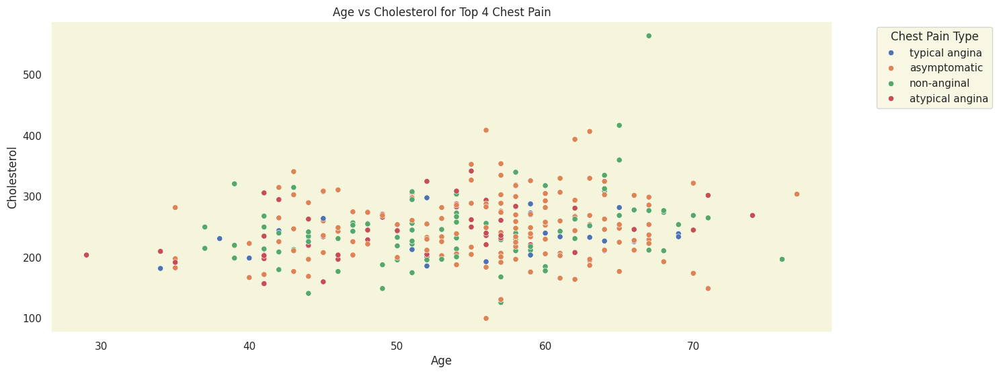

In [ ]:
#display(top_leagues)

plt.figure(figsize=(15, 6))
sns.scatterplot(x='age', y='chol', data=df[df['cp'].isin(top_leagues)], hue='cp')
plt.title('Age vs Cholesterol for Top 4 Chest Pain')
plt.xlabel('Age')
plt.ylabel('Cholesterol')
plt.legend(title='Chest Pain Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [ ]:
import plotly.express as px

fig = px.scatter(df, x='chol', y='age', color='sex')
fig.update_layout(width=1200, height=600)

fig.update_layout(title_text='Scatter Plot of Cholesterol vs. Age (colored by Sex)')

fig.show()

In [ ]:
from plotly.offline import iplot

fig = px.box(
    x = df['age'],
    labels = {'x': 'Age'},
    title="5-Number-Summary(Box Plot) of Age"
)

fig.show()

In [ ]:
iplot(fig)

In [ ]:
import plotly.express as px

fig = px.scatter(
    df,
    x='chol',
    y='age',
    color='cp',
    size='oldpeak',
    size_max=30,
    hover_name='exang'
)

fig.update_layout(width=1800, height=600)
fig.update_layout(title_text='Scatter Plot of Cholesterol vs. Age (coloured by Chest Pain)')
fig.show()

In [ ]:
fig = px.scatter(data_frame=df,
                 x='age',
                 y='chol',
                 color='cp',
                 size='ca',
                 hover_data=['oldpeak'])

fig.update_layout(title_text="<b> Cholesterol Vs Age <b>",
                  titlefont={'size': 24, 'family': 'Serif'},
                  width=1500,
                  height=750
                  )
fig.show()

In [ ]:
import plotly.express as px

fig = px.scatter(
    df,
    x='chol',
    y='age',
    color='cp',
    size='oldpeak',
    size_max=30,
    hover_name='exang',
    facet_col='cp',
    log_x=True
)

fig.update_layout(width=1600, height=600)

fig.update_layout(title_text='Scatter Plot of Cholesterol vs. Age (coloured by Chest Pain [cp])')

fig.show()

In [ ]:
fig = px.bar(
    df,
    x='age',
    y='chol',
    hover_data=['oldpeak'],
    color='sex',
    height=400
)

fig.show()

In [ ]:
df.groupby(['cp', 'slope']).agg({'id': 'count'})

id
cp              slope          
asymptomatic    downsloping  11
                flat         84
                upsloping    49
atypical angina downsloping   2
                flat         11
                upsloping    36
non-anginal     downsloping   5
                flat         33
                upsloping    45
typical angina  downsloping   3
                flat         11
                upsloping     9

In [ ]:
df.groupby(['cp', 'slope']).agg({'id': 'count'}).reset_index()

,cp,slope,id
0,asymptomatic,downsloping,11
1,asymptomatic,flat,84
2,asymptomatic,upsloping,49
3,atypical angina,downsloping,2
4,atypical angina,flat,11
5,atypical angina,upsloping,36
6,non-anginal,downsloping,5
7,non-anginal,flat,33
8,non-anginal,upsloping,45
9,typical angina,downsloping,3


In [ ]:
def generate_rating_df(df):
  rating_df = df.groupby(['cp', 'slope']).agg({'id': 'count'}).reset_index()
  rating_df = rating_df[rating_df['id'] != 0]
  rating_df.columns = ['cp', 'slope', 'counts']
  rating_df = rating_df.sort_values('slope')
  return rating_df

In [ ]:
rating_df = generate_rating_df(df)
rating_df

,cp,slope,counts
0,asymptomatic,downsloping,11
3,atypical angina,downsloping,2
6,non-anginal,downsloping,5
9,typical angina,downsloping,3
1,asymptomatic,flat,84
4,atypical angina,flat,11
7,non-anginal,flat,33
10,typical angina,flat,11
2,asymptomatic,upsloping,49
5,atypical angina,upsloping,36


In [ ]:
fig = px.bar(rating_df,
             x='cp',
             y='counts',
             color='slope')

fig.update_traces(textposition='auto', textfont_size=20)

fig.update_layout(barmode='stack')

fig.show()

In [ ]:
def generate_rating_df(df):
    rating_df = df.groupby(['cp', 'slope']).agg({'id': 'count'}).reset_index()
    rating_df = rating_df[rating_df['id'] != 0]
    rating_df.columns = ['cp', 'slope', 'counts']
    rating_df = rating_df.sort_values('slope')
    return rating_df

rating_df = generate_rating_df(df)
fig = px.bar(rating_df, x='cp', y='counts', color='slope')

fig.update_traces(textposition='auto',
                  textfont_size=20)

fig.update_layout(barmode='group')

fig.show()

In [ ]:
def generate_rating_df(df):
  rating_df = df.groupby(['cp', 'slope']).agg({'id': 'count'}).reset_index()
  rating_df = rating_df[rating_df['id'] != 0]
  rating_df.columns = ['cp', 'slope', 'counts']
  rating_df = rating_df.sort_values('slope')
  return rating_df

rating_df = generate_rating_df(df)

fig = px.bar(rating_df, x='cp', y='counts', color='slope', barmode='group', text='counts')
fig.show()

In [ ]:
import plotly.express as px

def generate_rating_df(df):
    rating_df = df.groupby(['cp', 'slope']).agg({'id': 'count'}).reset_index()
    rating_df = rating_df[rating_df['id'] != 0]
    rating_df.columns = ['cp', 'slope', 'counts']
    rating_df = rating_df.sort_values('slope')
    return rating_df

rating_df = generate_rating_df(df)


fig = px.bar(rating_df, x='cp', y='counts', color='slope', barmode='group',
             text='counts',
             )

fig.update_traces(textposition='auto',
                  textfont_size=20)

fig.show()

In [ ]:
def generate_rating_df(df):
    rating_df = df.groupby(['cp', 'slope']).agg({'id': 'count'}).reset_index()
    rating_df = rating_df[rating_df['id'] != 0]
    rating_df.columns = ['cp', 'slope', 'counts']
    rating_df = rating_df.sort_values('slope')

    # Calculate percentages
    total_counts = rating_df['counts'].sum()
    rating_df['percentage'] = rating_df['counts'] / total_counts * 100

    return rating_df

rating_df = generate_rating_df(df)

fig = px.bar(rating_df, x='cp', y='counts', color='slope', text='percentage')

fig.update_traces(
    texttemplate='%{text:.1f}%',
    textposition='outside',
    textfont_size=16
)

fig.update_layout(
    barmode='group',
    yaxis_title='Count',
    xaxis_title='CP',
    legend_title='Slope'
)

fig.update_layout(
    height=550,
    width=1500,
    title_text="Distribution of Chest Pain Type by Percentage",
    title_font_size=24
)


fig.show()

In [ ]:
fig = px.scatter(data_frame=df,
                 x='age',
                 y='chol',
                 color='cp',
                 size='ca',
                 hover_data=['oldpeak'],
                 marginal_x='histogram',
                 marginal_y='box')


fig.update_layout(title_text='<b> Age vs Cholesterol <b>',
                  titlefont = {'size': 24, 'family': 'Serif'},
                  width=1500,
                  height=750)

fig.show()

In [ ]:
fig = px.scatter(data_frame = df,
                 x="age",
                 y="chol",
                 color="thalch",
                 size='ca',
                 hover_data=['oldpeak'],
                 marginal_x="histogram",
                 marginal_y="box")

fig.update_layout(title_text="<b> Age vs Cholesterol <b>",
                  titlefont={'size': 24, 'family':'Serif'},
                  width=1500,
                  height=750,
                 )

fig.show()



In [ ]:
fig = px.scatter(data_frame=df,
                 x='age',
                 y='chol',
                 size='ca',
                 size_max=30,
                 color='sex',
                 trendline='ols')

fig.update_layout(title_text='<b> Age vs Cholesterol <b>',
                  titlefont={'size':24, 'family':'Serif'},
                  width=1500,
                  height=750)

fig.show()

In [ ]:
fig = px.scatter(data_frame=df,
                 x='age',
                 y='chol',
                 size='ca',
                 size_max=30,
                 color='sex',
                 trendline='ols',
                 trendline_scope='overall',
                 trendline_color_override='black')


fig.update_layout(title_text='<b>Chest Pain vs Gender<b>',
                  titlefont={'size': 24, 'family': 'Serif'},
                  width=1500,
                  height=750)

fig.show()

In [ ]:
fig = px.histogram(df,
                   x='age',
                   height=500,
                   width=900,
                   template='simple_white',
                   color='sex',
                   color_discrete_sequence=['purple', 'pink'])

fig.update_layout(title={'text': 'Histogram of Persons by Age', 'font': {'size': 25}},
                  title_font_family="Times New Roman",
                  title_font_color='darkgrey',
                  title_x=0.2)

fig.update_layout(
    font_family='classic-roman',
    font_color='grey',
    yaxis_title={'text': ' count', 'font': {'size': 18}},
    xaxis_title={'text': ' Age', 'font': {'size': 18}}
)

fig.show()

# Activation Functions for Non-Linear Function Approximation

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

from tqdm.notebook import trange, tqdm
import matplotlib.pyplot as plt

In [ ]:
# Create a data distribution
def create_data(data_points):
  data_class1 = torch.rand(data_points, 2) * 1.45
  data_class2 = torch.rand(data_points, 2) * 3

  mask = ~((data_class2[:, 0] < 1.55) * (data_class2[:, 1] < 1.55))
  data_class2 = data_class2[mask]

  # Labels
  data_label1 = torch.zeros(data_class1.shape[0], 1)
  data_label2 = torch.ones(data_class2.shape[0], 1)

  # Combine data
  x_data = torch.cat((data_class1, data_class2), 0)
  y_data = torch.cat((data_label1, data_label2), 0)

  return x_data, y_data

In [ ]:
# Combine data
x_train, y_train = create_data(1000)
x_test, y_test = create_data(500)

In [ ]:
x_train.shape

torch.Size([1728, 2])

In [ ]:
y_train.shape

torch.Size([1728, 1])

In [ ]:
x_test.shape

torch.Size([864, 2])

In [ ]:
y_test.shape

torch.Size([864, 1])

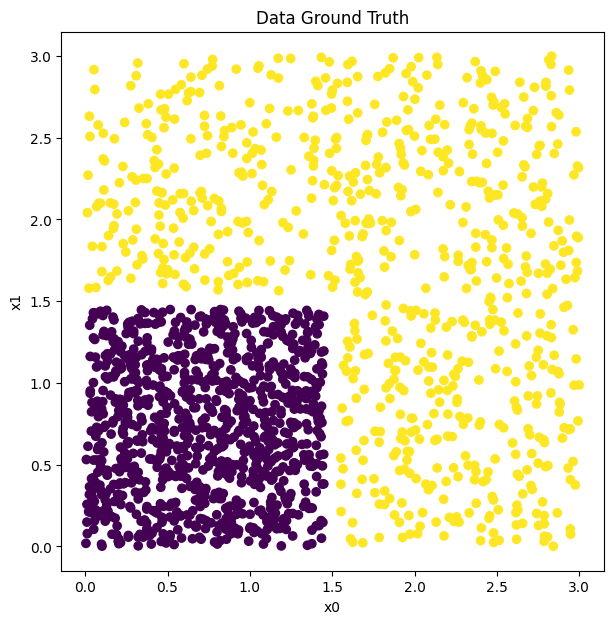

In [ ]:
# Lets see what the data looks like
plt.figure(figsize=(7, 7))
plt.scatter(x_train[:, 0].numpy(), x_train[:, 1].numpy(), c=y_train.flatten().numpy())
_ = plt.xlabel('x0')
_ = plt.ylabel('x1')
_ = plt.title("Data Ground Truth")

## Create a Linear Logistic Regression Model


In [ ]:
logistic_linear = nn.Linear(2, 1)
loss_function = nn.BCEWithLogitsLoss()

# Create our optimizer - lr = 0.1
logistic_optimizer = torch.optim.Adam(logistic_linear.parameters(), lr=0.1)

# Number of times we iterate over the dataset
max_epoch = 100

logistic_loss_log = []  # Keep track of the loss values
logistic_acc = []  # Keep track of the accuracy

for epoch in range(max_epoch):
  with torch.no_grad():
    y_test_hat = logistic_linear(x_test)

    # The decision boundary is at 0.5 (between 0 and 1) AFTER  the sigmoid
    # The input to the Sigmoid function that gives 0.5 to 0!
    # Therefore the decision bounday for the RAW output is at 0!!
    class_pred = (y_test_hat > 0).float()
    logistic_acc.append(float(sum(class_pred == y_test)) / float(y_test.shape[0]))

  # Perform a training step
  y_train_hat = logistic_linear(x_train)
  loss = loss_function(y_train_hat, y_train)

  logistic_optimizer.zero_grad()
  loss.backward()
  logistic_optimizer.step()

  logistic_loss_log.append(loss.item())

print(f"Accuracy of linear model(GD): {logistic_acc[-1]:.2%}")

Accuracy of linear model(GD): 92.48%


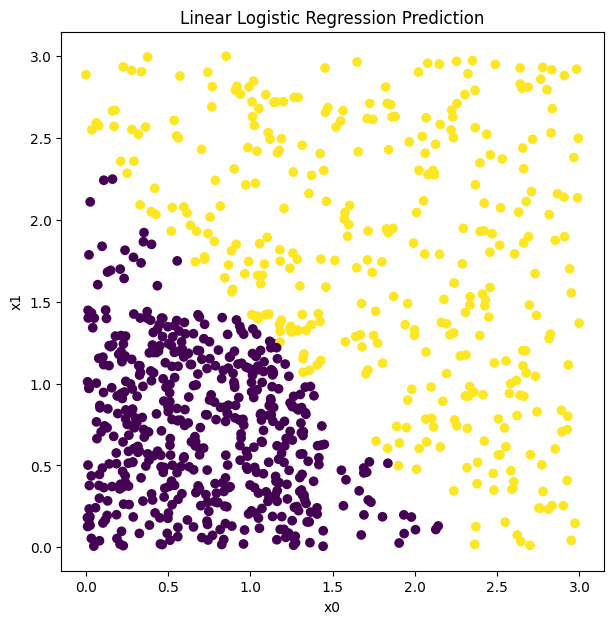

In [ ]:
# Let see what the data looks like
plt.figure(figsize=(7, 7))
plt.scatter(x_test[:, 0].numpy(), x_test[:, 1].numpy(), c=class_pred.flatten().numpy())
plt.xlabel('x0')
plt.ylabel('x1')
plt.title("Linear Logistic Regression Prediction");

In [ ]:
w0 = 1
w1 = -(1.5 * w0)
w_0 = torch.FloatTensor([[w0, 0],
                         [0, w0]])

b_0 = torch.FloatTensor([[w1, w1]])

print(f"Weights:\n{w_0.numpy()}")
print(f"Bias:\n{b_0.numpy()}")

Weights:
[[1. 0.]
 [0. 1.]]
Bias:
[[-1.5 -1.5]]


In [ ]:
h1 = F.linear(x_train, w_0, bias=b_0)
h1

tensor([[-0.8831, -0.1272],
        [-0.8724, -0.2633],
        [-1.1206, -0.3900],
        ...,
        [-0.3803,  1.1787],
        [ 1.0060,  0.6500],
        [ 0.9566, -1.3130]])

In [ ]:
x_train.shape, w_0.shape, b_0.shape

(torch.Size([1728, 2]), torch.Size([2, 2]), torch.Size([1, 2]))

In [ ]:
h1.shape

torch.Size([1728, 2])

In [ ]:
h2 = torch.sigmoid(h1)

In [ ]:
t = x_train @ w_0.T + b_0
t

tensor([[-0.8831, -0.1272],
        [-0.8724, -0.2633],
        [-1.1206, -0.3900],
        ...,
        [-0.3803,  1.1787],
        [ 1.0060,  0.6500],
        [ 0.9566, -1.3130]])

In [ ]:
h2

tensor([[0.2925, 0.4682],
        [0.2948, 0.4346],
        [0.2459, 0.4037],
        ...,
        [0.4060, 0.7647],
        [0.7322, 0.6570],
        [0.7224, 0.2120]])

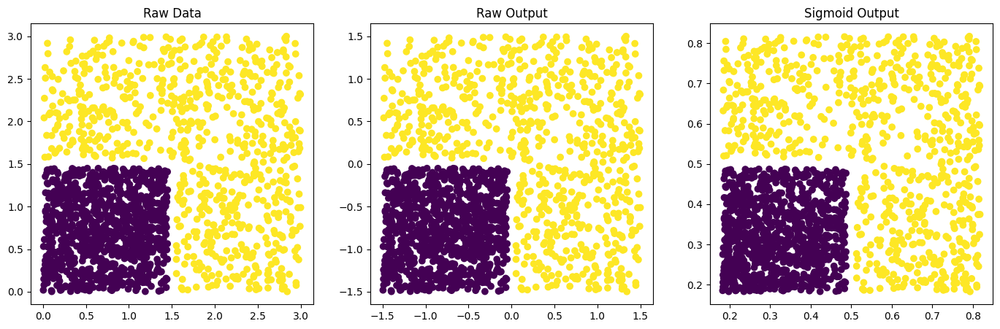

In [ ]:
# Plot out the Raw data vs Raw output and Sigmoid output
# What happens as you increase w0??
# Increase w0 until the data becomes linearly separable!

plt.figure(figsize=(17, 5))
plt.subplot(131)
plt.scatter(x_train[:, 0].numpy(), x_train[:, 1].numpy(), c=y_train.flatten().numpy())
plt.title("Raw Data")

plt.subplot(132)
plt.scatter(h1[:, 0].numpy(), h1[:, 1].numpy(), c=y_train.flatten().numpy())
plt.title("Raw Output")

plt.subplot(133)
plt.scatter(h2[:, 0].numpy(), h2[:, 1].numpy(), c=y_train.flatten().numpy())
plt.title('Sigmoid Output');

In [ ]:
# Create a line between the points (0, 0.6) and (0.6, 0)
point0 = torch.tensor([0.6, 0])
point1 = torch.tensor([0, 0.6])

w0 = 1
w1 = 1
w2 = -0.6
w_1 = torch.FloatTensor([[w0, w1]])
b_1 = torch.FloatTensor([w2])
print(f"Weights: {w_1.numpy()}")
print(f"Bias: {b_1.numpy()}")

h3 = F.linear(h2, w_1, bias=b_1)
class_pred = (h3 > 0).float()

# Calculate the accuracy
acc = float(sum(class_pred == y_train)) / float(y_train.shape[0])
print(f"Non-linear accuracy {acc:.2%}")

Weights: [[1. 1.]]
Bias: [-0.6]
Non-linear accuracy 63.31%


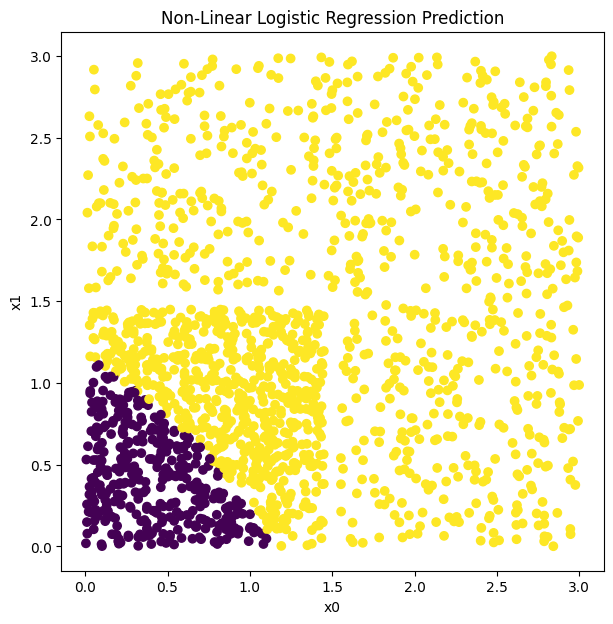

In [ ]:
plt.figure(figsize=(7, 7))

plt.scatter(x_train[:, 0].numpy(), x_train[:, 1].numpy(), c=class_pred.flatten().numpy())
_ = plt.xlabel('x0')
_ = plt.ylabel('x1')
_ = plt.title("Non-Linear Logistic Regression Prediction");

# Train a Non-Linear Logistic Regression Model with PyTorch

In [ ]:
class NonLinearModel(nn.Module):
  def __init__(self, input_size, output_size, hidden_size):
    super().__init__()
    self.linear1 = nn.Linear(input_size, hidden_size)
    self.linear2 = nn.Linear(hidden_size, output_size)

  def forward(self, x):
    self.h1 = self.linear1(x)
    self.h2 = torch.sigmoid(self.h1)
    self.h3 = self.linear2(self.h2)

    return self.h3

In [ ]:
logistic_nonlinear = NonLinearModel(input_size=2, output_size=1, hidden_size=2)
loss_function = nn.BCEWithLogitsLoss()

# Create our optimizer lr = 0.1
logistic_optimizer = torch.optim.Adam(logistic_nonlinear.parameters(), lr=1e-2)

logistic_loss_log = []
logistic_acc = []

In [ ]:
# Number of times we iterate over the dataset
max_epoch = 5000

for epoch in trange(max_epoch, desc='training Epochs'):
  with torch.no_grad():
    y_test_hat = logistic_nonlinear(x_test)

    class_pred = (y_test_hat > 0).float()
    logistic_acc.append(float(sum(class_pred == y_test)) / float(y_test.shape[0]))

  # Perform a training step
  y_train_hat = logistic_nonlinear(x_train)
  loss = loss_function(y_train_hat, y_train)

  logistic_optimizer.zero_grad()
  loss.backward()
  logistic_optimizer.step()

  logistic_loss_log.append(loss.item())

print(f"Accuracy of Non-linear model (GD): {logistic_acc[-1]:.2%}")

training Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Accuracy of Non-linear model (GD): 100.00%


Text(0.5, 1.0, 'Training Loss During training')

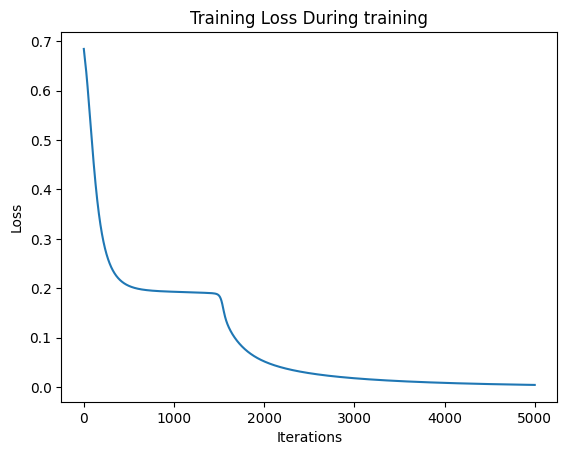

In [ ]:
plt.plot(logistic_loss_log)
plt.xlabel('Iterations')
plt.ylabel("Loss")
plt.title("Training Loss During training")


Text(0, 0.5, 'x1')

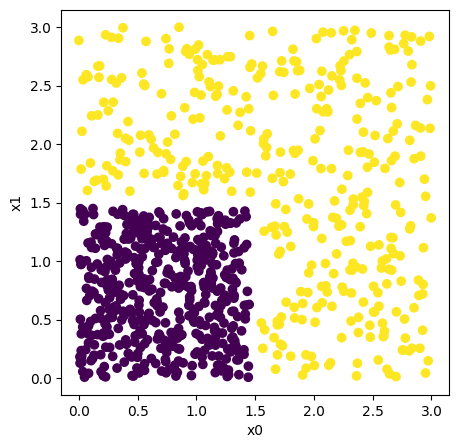

In [ ]:
with torch.no_grad():
  y_test_hat = logistic_nonlinear(x_test)
  class_pred = (y_test_hat > 0).float()

plt.figure(figsize=(5, 5))
plt.scatter(x_test[:, 0].numpy(), x_test[:, 1].numpy(), c=class_pred.flatten().numpy())
plt.xlabel('x0')
plt.ylabel('x1')

# Approximating a Region of the Sine Function

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset

from tqdm.notebook import trange, tqdm

In [ ]:
torch.rand(10)

tensor([0.3536, 0.2340, 0.5863, 0.3966, 0.7601, 0.1000, 0.3499, 0.1911, 0.9315,
        0.8901])

In [ ]:
torch.rand(10) * -9

tensor([-2.9415, -0.6576, -8.9394, -8.5930, -4.6531, -6.9606, -3.7090, -5.1034,
        -3.3315, -1.7028])

In [ ]:
torch.rand(10) * 18 -9

tensor([ 6.8941,  6.6650, -2.0412, -7.9964, -4.6566, -4.3844, -6.7759,  5.7981,
        -0.4681, -4.2496])

In [ ]:
torch.rand(10).shape[0]

10

In [ ]:
len(torch.rand(10))

10

In [ ]:
torch.pi

3.141592653589793

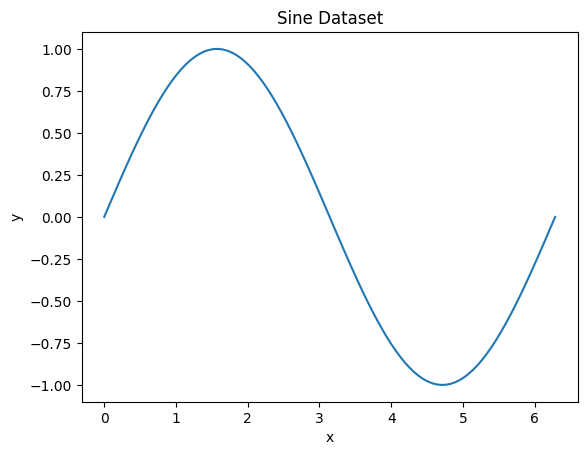

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset

# Generate synthetic data for the sine wave
x_data = torch.linspace(0, 2 * np.pi, 100)  # Create x values from 0 to 2*pi
y_data = torch.sin(x_data)  # Calculate y values using sine function

# Create a TensorDataset for easier handling
sine_dataset = TensorDataset(x_data, y_data)

# Plot the sine wave
plt.plot(sine_dataset.tensors[0].numpy(), sine_dataset.tensors[1].numpy())  # Access data using tensors[0] and tensors[1]
plt.xlabel('x')
plt.ylabel('y')
plt.title('Sine Dataset');

In [ ]:
def create_random_x_points(num_datapoints, low=-9, high=9):
  return torch.rand(num_datapoints) * (high - low) - high

# Create a SineDataset class by inheriting the PyTorch Dataset class
class SineDataset(Dataset):
  """
  Data noisey sinewave dataset
  num_datapoints - the number of datapoints you want
  """
  def __init__(self, num_datapoints, low=-9, high=9):
    # Lets generate the noisy sinewave points
    # Create "num_datapoints" worth of random x points using a uniform distribution (0-1)
    # using torch.rand, then sacale and shift the points to be between -9 and -9
    self.x_data = create_random_x_points(num_datapoints, low=-9, high=9)

    # Calculate the sin of all data points in the x vector and then scale the amplitude down by 2.5
    self.y_data = torch.sin(self.x_data) * 2.5

    # Add some gaussian noise to each datapoint using torch.randn_like
    # (scale the noise down a bit by about 20 - see how different noise lvels effects your model)
    # Not: torch.randn_like will generate a tensor of gaussian noise the same size
    # and type as the provided tensor
    self.y_data += torch.randn_like(self.y_data) / 20

  def __getitem__(self, index):
    # This function is called by the dataLOADER class whenever it wants a new mini-batch
    # The dataLOADER class will pass the dataSET class a number of datapoint indexes (mini-batch of indexes)
    # It is up to the dataSET's __getitem__ function to output the corresponding input datapoints
    # AND the corresponding labels
    return self.x_data[index], self.y_data[index]

  def __len__(self):
    # We also need to specify a "length" function, Python will use this function whenever
    # You use the Python len(function)
    # We need to define it so the dataLOADER knows how big the dataSET is!
    return len(self.x_data)

In [ ]:
sine_dataset = SineDataset(100)

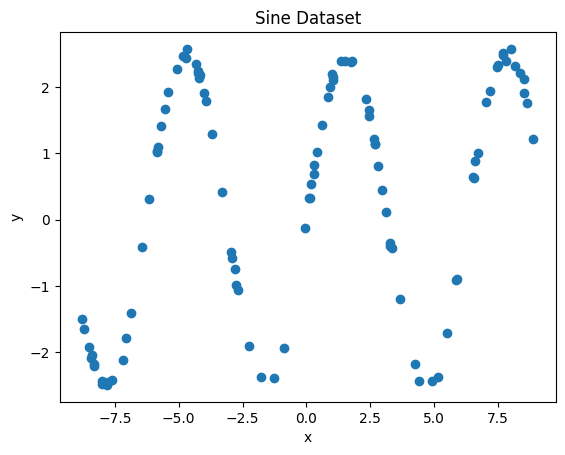

In [ ]:
plt.scatter(sine_dataset.x_data.numpy(), sine_dataset.y_data.numpy())
plt.xlabel('x')
plt.ylabel('y')
plt.title('Sine Dataset');

In [ ]:
n_x_train = 30000   # the number of training datapoints
n_x_test = 8000     # the number of testing datapoints
batch_size = 16

# Create an instance of the SineDataset for both the training and test set
dataset_train = SineDataset(n_x_train)
dataset_test = SineDataset(n_x_test)

# https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader
# Now we need to pass the dataSET to the Pytorch dataLOADER class along with some other arguments
# dataset - the dataset for this dataloader
# batch_size - the size of our mini-batches
# shuffle - whether or not we want to shuffle the dataset (True for training False for testing)

data_loader_train = DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
data_loader_test = DataLoader(dataset_test, batch_size=batch_size, shuffle=False)

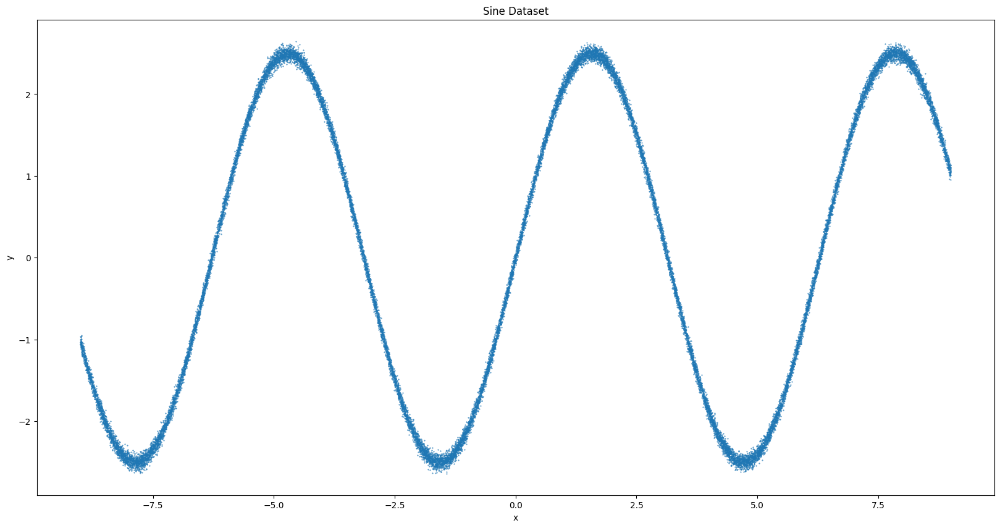

In [ ]:
fig = plt.figure(figsize=(20, 10))
plt.scatter(dataset_train.x_data.numpy(), dataset_train.y_data.numpy(), s=0.2)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Sine Dataset');

In [ ]:
# Define our network class by using the nn.module
class ShallowLinear(nn.Module):
  '''
  A simple, general purpose, fully connected network
  '''
  # Here we initialise our network and define all the layers we need
  def __init__(self, input_size, output_size, hidden_size):
    # Perform initialisation of the Pytorch superclass, this will allow us to
    # inherit functions from the nn.Module class
    super(ShallowLinear, self).__init__()

    # Define 4 linear layers for our model with the same hidden size for all
    # Note: the ouput of one layer must be the same size as the input to the next
    self.linear1 = nn.Linear(input_size, hidden_size)
    self.linear2 = nn.Linear(hidden_size, hidden_size)
    self.linear3 = nn.Linear(hidden_size, hidden_size)
    self.linear4 = nn.Linear(hidden_size, output_size)

  def forward(self, x):
    # This function is an important one and we must create it or pytorch will give us an error!
    # This function defines the 'forward pass' of our neural network
    # and will be called when we simply call our network class
    # aka we can do net(input) instead of net.forward(input)

    # Lets define the sequence of events for our forward pass!
    # We'll use a tanh activation function here
    x = self.linear1(x)
    x = torch.tanh(x)

    x = self.linear2(x)
    x = torch.tanh(x)

    x = self.linear3(x)
    x = torch.tanh(x)

    x = self.linear4(x)

    return x

In [ ]:
learning_rates = [5e-2, 1e-2, 5e-3, 1e-3, 5e-4, 5e-5]
optimizers = {'sgd': optim.SGD, 'adam': optim.Adam}

In [ ]:
# Create a model
shallow_model = ShallowLinear(input_size=1, output_size=1, hidden_size=10)

In [ ]:
def define_hyperparameters(ilr, opt_name):
  learning_rate = learning_rates[ilr]
  optimizer = optimizers[opt_name](shallow_model.parameters(), lr=learning_rate)
  loss_function = nn.MSELoss()
  return learning_rate, optimizer, loss_function


In [ ]:
nepochs = 10

training_loss_logger_dict = {}

In [ ]:
for ilr in range(len(learning_rates)):
  for opt_name in optimizers:
    learning_rate, optimizer, loss_function = define_hyperparameters(ilr, opt_name)
    shallow_model = ShallowLinear(input_size=1, output_size=1, hidden_size=16)

    training_loss_logger = []
    testing_loss_logger = []

    for epoch in trange(nepochs, desc='Epochs', leave=False):
      # Perform the training loop
      for x, y in tqdm(data_loader_train, desc='Training', leave=False):
        # Forward pass
        y_pred = shallow_model(x.reshape(-1, 1))

        # Compute the loss
        loss = loss_function(y_pred, y.reshape(-1, 1))

        # Before the backward pass, use the optimizer object to zero all the
        # gradients for the variables it will update (which are the learnable weights
        # of the model)
        optimizer.zero_grad()

        # Backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()

        # Calling the step function on an optimizer makes an update to its parameters
        optimizer.step()

        # Log the loss so we can visualize the training plot later
        training_loss_logger.append(loss.item())

      # Perform a test Loop!
      with torch.no_grad():
        # Create a variable to accumulate the test loss so we can take the average
        test_loss_accum = 0
        for i, (x, y) in enumerate(tqdm(data_loader_test, desc='Testing', leave=False)):
          # Fun the forward pass
          y_test_pred = shallow_model(x.reshape(-1, 1))

          # Compute the loss
          loss = loss_function(y_test_pred, y.reshape(-1, 1))

          # Accumulate the loss
          test_loss_accum += loss.item()

        test_loss_accum /= (i + 1)

    training_loss_logger_dict[f'{learning_rate}_{opt_name}'] = training_loss_logger
    #testing_loss_logger_dict[f'{learning_rate}_{optimizer}'] = testing_loss_logger
    print(f"Epoch [{epoch + 1}/{nepochs}], Average Test Loss {test_loss_accum:.4f} for lr={learning_rate}, optimizer={optimizer}")


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.5935 for lr=0.05, optimizer=SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.05
    maximize: False
    momentum: 0
    nesterov: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.1900 for lr=0.05, optimizer=Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.05
    maximize: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.4417 for lr=0.01, optimizer=SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.01
    maximize: False
    momentum: 0
    nesterov: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.3651 for lr=0.01, optimizer=Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.01
    maximize: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.2689 for lr=0.005, optimizer=SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.005
    maximize: False
    momentum: 0
    nesterov: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.1972 for lr=0.005, optimizer=Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.005
    maximize: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.2148 for lr=0.001, optimizer=SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    momentum: 0
    nesterov: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.2073 for lr=0.001, optimizer=Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.2334 for lr=0.0005, optimizer=SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.0005
    maximize: False
    momentum: 0
    nesterov: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.3092 for lr=0.0005, optimizer=Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0005
    maximize: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.3210 for lr=5e-05, optimizer=SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 5e-05
    maximize: False
    momentum: 0
    nesterov: False
    weight_decay: 0
)


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Training:   0%|          | 0/1875 [00:00<?, ?it/s]

Testing:   0%|          | 0/500 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss 3.2724 for lr=5e-05, optimizer=Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 5e-05
    maximize: False
    weight_decay: 0
)


In [ ]:
len(training_loss_logger_dict['0.001_sgd'])

18750

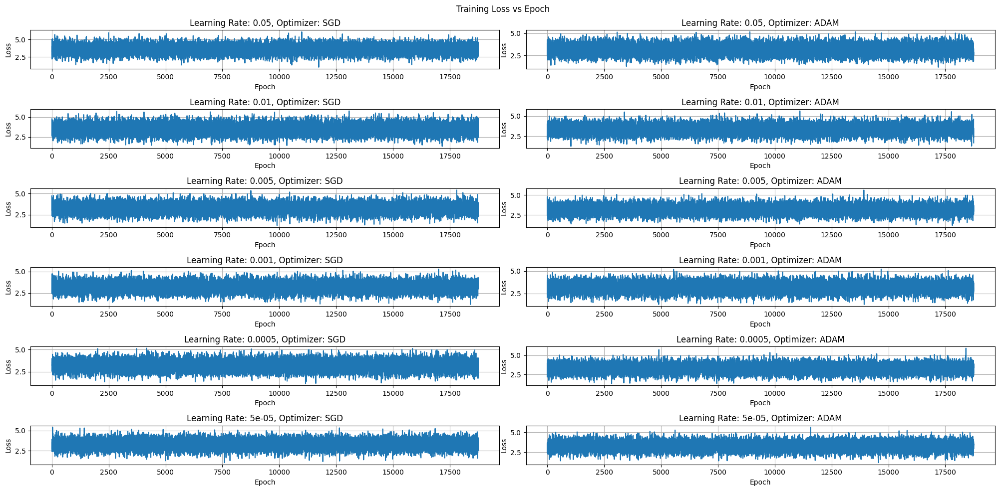

In [ ]:
fig, axs = plt.subplots(6, 2)  # Create a 2x2 grid of subplots

for i, lr in enumerate(learning_rates):
  for j, opt_name in enumerate(optimizers):
    axs[i, j].plot(training_loss_logger_dict[f'{lr}_{opt_name}'])

    axs[i, j].set_title(f'Learning Rate: {lr}, Optimizer: {opt_name.upper()}')
    axs[i, j].set_xlabel('Epoch')
    axs[i, j].set_ylabel('Loss')

    axs[i, j].grid(True)


fig.set_size_inches(20, 10) # Set the figure size
fig.suptitle('Training Loss vs Epoch')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

# PyTorch Classification with MLP

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data.dataloader as dataloader
import torch.optim as optim

from torchvision import transforms
from torchvision.datasets import MNIST
import torchvision

from tqdm.notebook import trange, tqdm
import numpy as np
import matplotlib.pyplot as plt
import time


## Classification
---
In this Notebook we are performing 'classification', that is we want our model to predict what group a given input belongs to after being trained with a large number of examples. In our case we are using MNIST, a dataset of small black and white hand written digits. We want our model to predict what digit (0-9)
 is in the image!


In [ ]:
# Size of our mini-batches
batch_size = 256
data_set_root = 'datasets'

# Create a train and test dataset using the Pytorch MNIST dataloader class
# NOTE: If you do not have the latest version of torchvision you will need to download the mnist dataset
# First as the link the old pytorch MNIST DATASET does not work!

train = MNIST(root=data_set_root, train=True, download=True, transform=transforms.ToTensor())
test = MNIST(root=data_set_root, train=False, download=True, transform=transforms.ToTensor())

# Using the PyTorch dataloader class and the PyTorch datasets we will create iterable dataloader objects
train_loader = dataloader.DataLoader(dataset=train, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=False)
test_loader = dataloader.DataLoader(dataset=test, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=False)

# NOTE: num_workers is the number of extra threads the dataloader will spawn to load the data from file,
# you will rarely need more than 4

# NOTE: pin_memory is only useful if you are training with a GPU!!! If it is  True then GPU will pre-allocate
# memory for the NEXT batch so the CPU-GPU transfer can be handled by the DMA controller freeing up the CPU

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:07<00:00, 1256204.66it/s]


Extracting datasets/MNIST/raw/train-images-idx3-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 360744.07it/s]


Extracting datasets/MNIST/raw/train-labels-idx1-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 3279316.41it/s]


Extracting datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 8596809.01it/s]


Extracting datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to datasets/MNIST/raw



In [ ]:
## IF YOU ARE USING AN OLD VERSION OF PYTORCH
# from torchvision.datasets.utils import download_and_extract_archive
# import os

# url_base = 'https://ossci-datasets.s3.amazonaws.com/mnist/'

# resources = [
#     ("train-images-idx3-ubyte.gz", "f68b3c2dcbeaaa9fbdd348bbdeb94873"),
#     ("train-labels-idx1-ubyte.gz", "d53e105ee54ea40749a09fcbcd1e9432"),
#     ("t10k-images-idx3-ubyte.gz", "9fb629c4189551a2d022fa330f9573f3"),
#     ("t10k-labels-idx1-ubyte.gz", "ec29112dd5afa0611ce80d1b7f02629c")]


# def download():
#     os.makedirs("./data/MNIST/raw", exist_ok=True)

#     # download files
#     for filename, md5 in resources:
#         url = "{}{}".format(url_base, filename)
#         print("Downloading {}".format(url))

#         download_and_extract_archive(
#             url, download_root="./data/MNIST/raw",
#             filename=filename,
#             md5=md5
#         )


# download()

In [ ]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")

### Visualise a few training samples
Lets visualise that mini-batches that the dataloader gives us

In [ ]:
# We can create an iterator using the dataloaders and take a random sample
images, labels = next(iter(train_loader))
print(f"The input data shape is: {images.shape}")
print(f"The target output data shape is: {labels.shape}")

The input data shape is: torch.Size([256, 1, 28, 28])
The target output data shape is: torch.Size([256])


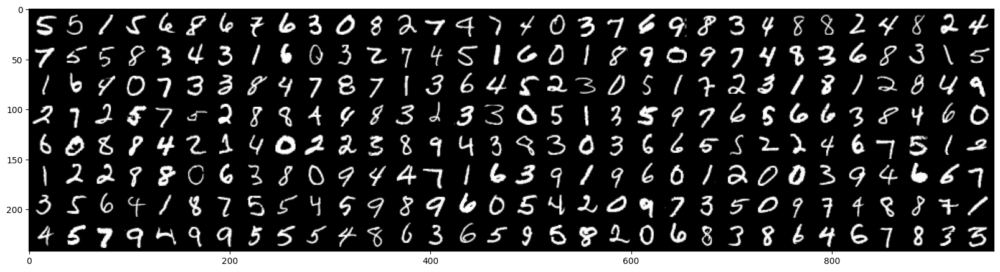

In [ ]:
# Lets visualise an entire batch of images!
plt.figure(figsize=(20, 10))
out = torchvision.utils.make_grid(images, 32)
plt.imshow(out.numpy().transpose((1, 2, 0)))

In [ ]:
class Simple_MLP(nn.Module):
  def __init__(self, num_classes):
    super(Simple_MLP, self).__init__()
    # We will use 4 linear layers
    # The input to the model is 784 (28x28 - the image size)
    # and the should be num_classes outputs
    self.fc1 = nn.Linear(in_features=784, out_features=512)
    self.fc2 = nn.Linear(in_features=512, out_features=256)
    self.fc3 = nn.Linear(in_features=256, out_features=128)
    self.fc4 = nn.Linear(in_features=128, out_features=num_classes)

  def forward(self, x):
    # The data we pass the model is a batch of single channel images
    # with shape BSX1X28X28 we need to flatten it to BSX784
    x = x.view(x.shape[0], -1)

    # We will use a relu activation function for this network! (F.relu)
    # NOTE F.relu is the "functional" version of the activation function!
    # nn.ReLU is a class constructor of a "ReLU" object
    x = self.fc1(x)
    x = F.relu(x)

    x = self.fc2(x)
    x = F.relu(x)

    x = self.fc3(x)
    x = F.relu(x)

    x = self.fc4(x)

    return x

In [ ]:
# Create our model
model = Simple_MLP(num_classes=10)

# Create our loss function
criterion = nn.CrossEntropyLoss()

# Define our optimizer & learning_rate
lr = 0.001
optimizer = optim.Adam(model.parameters(), lr=lr)

# Number of epochs
n_epochs = 10

# We can print out our model structure
print(model)

Simple_MLP(
  (fc1): Linear(in_features=784, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=128, bias=True)
  (fc4): Linear(in_features=128, out_features=10, bias=True)
)


In [ ]:
def train_epoch(model, train_loader, criterion, optimizer, loss_logger, device=device):
  for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc='Training', leave=False)):

    # Forward pass of model
    outputs = model(data.to(device))

    # Calculate the loss
    #pred = outputs.argmax(dim=1)
    loss = criterion(outputs, target.to(device))

    # Zero gradients
    optimizer.zero_grad()

    # Backprop loss
    loss.backward()

    # Optimisation step
    optimizer.step()

    loss_logger.append(loss.item())

  return model, optimizer, loss_logger

In [ ]:
def test_model(model, test_loader, criterion, loss_logger, device=device):
  with torch.no_grad():
    correct_predictions = 0
    total_predictions = 0

    for batch_idx, (data, target) in enumerate(tqdm(test_loader, desc="Testing", leave=False)):

      # Forward pass of model
      outputs = model(data.to(device))

      # Calculate the accuracy of the model
      # You'll need to accumulate the accuracy over multiple steps

      # Number of correctly predicted outputs
      correct_predictions += (outputs.argmax(dim=1) == target.to(device)).sum()

      # Total number of outputs
      total_predictions += target.shape[0]

      # Calculate the loss
      loss = criterion(outputs, target.to(device))

      loss_logger.append(loss.item())

    accuracy = (correct_predictions / total_predictions) * 100.0

  return accuracy, loss_logger

In [ ]:
model = model.to(device)

In [ ]:
# Create empty lists for the train/test losses and the test accuracy
train_loss = []
test_loss = []
test_acc = []

In [ ]:
for i in trange(n_epochs, desc='Epoch', leave=False):
  # Call the training function to perform an epoch of training
  model, optimizer, train_loss = train_epoch(model, train_loader, criterion, optimizer, train_loss, device)

  # Call the testing function to perform an epoch of testing
  acc, test_loss = test_model(model, test_loader, criterion, test_loss, device)

  # Append the test accuracy to the list
  test_acc.append(acc.item())


print(f"Final Accuracy: {acc:.2f}%")

test_acc

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Final Accuracy: 98.16%


[94.80999755859375,
 96.12000274658203,
 97.16999816894531,
 97.87999725341797,
 97.8699951171875,
 97.95999145507812,
 98.04999542236328,
 97.67999267578125,
 97.83999633789062,
 98.15999603271484]

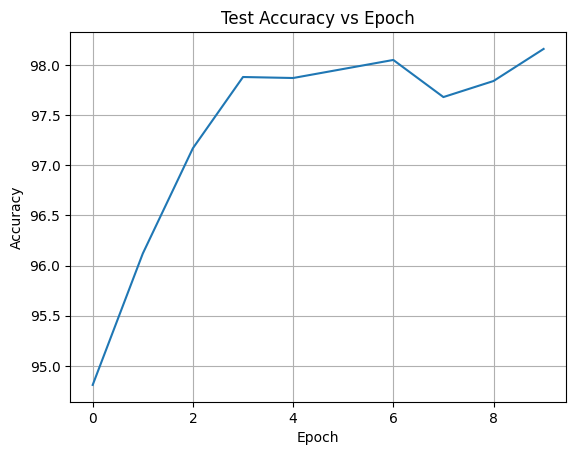

In [ ]:
# Plot the test accuracy
plt.plot(test_acc)
plt.title('Test Accuracy vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

In [ ]:
test_loss

[0.12194137275218964,
 0.22956719994544983,
 0.1777447611093521,
 0.18767277896404266,
 0.28138893842697144,
 0.24840302765369415,
 0.27673301100730896,
 0.2604244351387024,
 0.2905901372432709,
 0.1694476157426834,
 0.16397540271282196,
 0.18460406363010406,
 0.19189895689487457,
 0.17683567106723785,
 0.2649330496788025,
 0.30871668457984924,
 0.24561777710914612,
 0.21432839334011078,
 0.18874087929725647,
 0.18025028705596924,
 0.08537733554840088,
 0.07624559849500656,
 0.1699499934911728,
 0.23142492771148682,
 0.13972985744476318,
 0.21408289670944214,
 0.09166394174098969,
 0.04482860118150711,
 0.041092224419116974,
 0.07767687737941742,
 0.09254816919565201,
 0.09933419525623322,
 0.10314837843179703,
 0.060737378895282745,
 0.013269052840769291,
 0.12700046598911285,
 0.05193391069769859,
 0.17951232194900513,
 0.3717835545539856,
 0.022551892325282097,
 0.0957566350698471,
 0.14259889721870422,
 0.13793955743312836,
 0.13162359595298767,
 0.19923290610313416,
 0.18047326803

In [ ]:
train_loss

[2.299647569656372,
 2.288038969039917,
 2.2617013454437256,
 2.2263758182525635,
 2.1761536598205566,
 2.1209511756896973,
 2.0368878841400146,
 1.8787169456481934,
 1.8235576152801514,
 1.679721474647522,
 1.551409125328064,
 1.5047411918640137,
 1.2275651693344116,
 1.266239047050476,
 1.1176857948303223,
 1.0281347036361694,
 1.0027214288711548,
 0.9133079051971436,
 0.8078297972679138,
 0.7393797636032104,
 0.9040564894676208,
 0.6440585255622864,
 0.6326205134391785,
 0.6309933662414551,
 0.6318521499633789,
 0.5720977783203125,
 0.5530100464820862,
 0.6453346014022827,
 0.5234147906303406,
 0.5347445011138916,
 0.5853416323661804,
 0.5465776324272156,
 0.5050631165504456,
 0.4694685935974121,
 0.5007805228233337,
 0.4750825762748718,
 0.48348167538642883,
 0.6765638589859009,
 0.5810171365737915,
 0.47376739978790283,
 0.42833393812179565,
 0.5475881695747375,
 0.5804519653320312,
 0.5412628650665283,
 0.48971107602119446,
 0.47949033975601196,
 0.49545812606811523,
 0.507042706

In [ ]:
len(train_loss), len(test_loss)

(2350, 400)

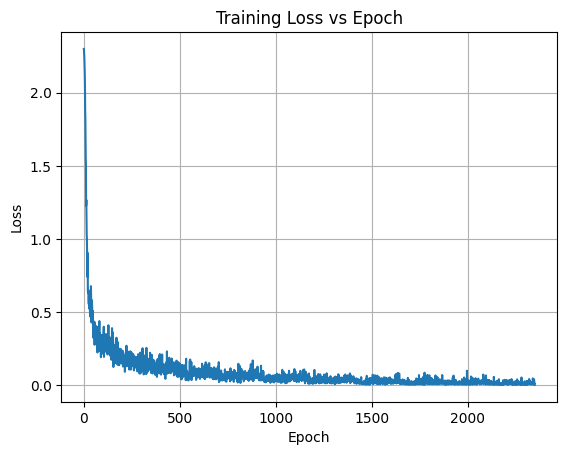

In [ ]:
# Plot the training loss
plt.plot(train_loss)
plt.title('Training Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

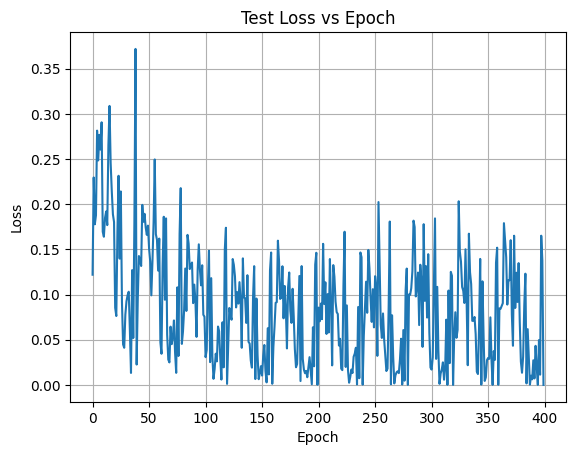

In [ ]:
# Plot the test loss
plt.plot(test_loss)
plt.title('Test Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

## Pytorch1_MLP_Function_Approximation_Solution

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset

from tqdm.notebook import trange, tqdm

class SineDataset(Dataset):
  """Data noisey sinewave dataset
  num_datapoints - the number of datapoints you want
  """
  def __init__(self, num_datapoints):
    # Lets generate the noisy sinewave points

    # Create "num_datapoints" worth of random x points using a uniform distribution (0-1)
    # using torch.rand. Then scale and shift the points to be between -9 and 9
    self.x_data = torch.rand(num_datapoints, 1)*18 - 9

    # Calculate the sin of all data points in the x vector and then scale
    self.y_data = torch.sin(self.x_data) / 2.5

    # Add noise
    self.y_data += torch.rand_like(self.y_data) / 20

  def __getitem__(self, index):
    return self.x_data[index], self.y_data[index]

  def __len__(self):
    return self.x_data.shape[0]


In [ ]:
n_x_train = 30000  # the number of training datapoints
n_x_test = 8000    # the number of testing datapoints
batch_size = 256

# Create an instance of the SineDataset for both the training and test set
dataset_train = SineDataset(n_x_train)
dataset_test = SineDataset(n_x_test)

# Now we need to pass the dataSET to the Pytorch dataLOADER class along with
# some other arguments
# batch-size - the size of our mini-batches
# shuffle - whether or not we want to shuffle the dataset
data_loader_train = DataLoader(dataset=dataset_train, batch_size=batch_size, shuffle=True)
data_loader_test = DataLoader(dataset=dataset_test, batch_size=batch_size, shuffle=False)

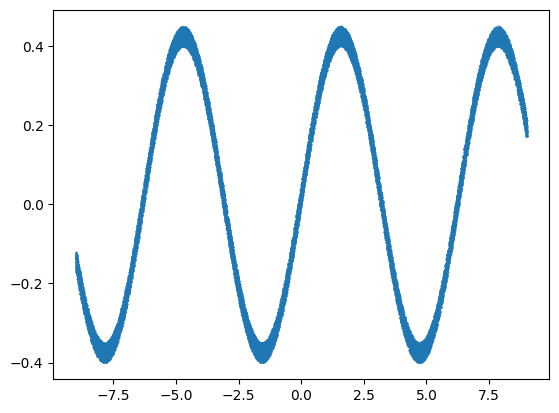

In [ ]:
fig = plt.Figure(figsize=(20, 10))
plt.scatter(dataset_train.x_data, dataset_train.y_data, s=0.2);

In [ ]:
class ShallowLinear(nn.Module):
  '''
  A simple, general purpose, fully connected neural network
  '''
  def __init__(self, input_size, output_size, hidden_size):
    super(ShallowLinear, self).__init__()
    self.linear1 = nn.Linear(in_features=input_size, out_features=hidden_size)
    self.linear2 = nn.Linear(in_features=hidden_size, out_features=hidden_size)
    self.linear3 = nn.Linear(in_features=hidden_size, out_features=hidden_size)
    self.linear4 = nn.Linear(in_features=hidden_size, out_features=output_size)

  def forward(self, x):
    x = self.linear1(x)
    x = torch.tanh(x)

    x = self.linear2(x)
    x = torch.tanh(x)

    x = self.linear3(x)
    x = torch.tanh(x)

    x = self.linear4(x)  # output layer

    return x

In [ ]:
learning_rate = 5e-4
n_epochs = 10

shallow_model = ShallowLinear(input_size=1, output_size=1, hidden_size=64).to(device)

optimizer = optim.Adam(shallow_model.parameters(), lr=learning_rate)

loss_fn = nn.MSELoss() # mean squared error

In [ ]:
training_loss_logger = []
testing_loss_logger = []

In [ ]:
for epoch in trange(n_epochs, desc='Epochs', leave=False):
  # Perform training loop!
  for x, y in tqdm(data_loader_train, desc='Training', leave=False):
    # Run forward calculation
    x, y = x.to(device), y.to(device)
    y_pred = shallow_model(x)

    # Compute loss
    loss = loss_fn(y_pred, y)

    # Before the backward pass, use the optimizer object to zero all of
    # the gradients for the variables it will update (which are the learnable weights
    # of the model)
    optimizer.zero_grad()

    # Backward pass: compute gradient of the loss with respect to model parameters
    loss.backward()

    # Calling the step function on an Optimizer makes an update to its parameters
    optimizer.step()

    # Log the loss so we can visualise the training plot later
    training_loss_logger.append(loss.item())

  # Perform the test loop!
  with torch.no_grad():
    test_loss_accum = 0
    for i, (x, y) in enumerate(tqdm(data_loader_test, desc='Testing', leave=False)):
      # Run forward calculation
      x, y = x.to(device), y.to(device)
      y_pred = shallow_model(x)

      # Compute loss.
      loss = loss_fn(y_pred, y)

      # Log the loss so we can visualise the training plot later
      testing_loss_logger.append(loss.item())
      test_loss_accum += loss

    test_loss_accum /= (i + 1)

print(f"Epoch [{epoch+1}/{n_epochs}], Average Test Loss: {test_loss_accum:.4f}")



Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Training:   0%|          | 0/118 [00:00<?, ?it/s]

Testing:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch [10/10], Average Test Loss: 0.0081


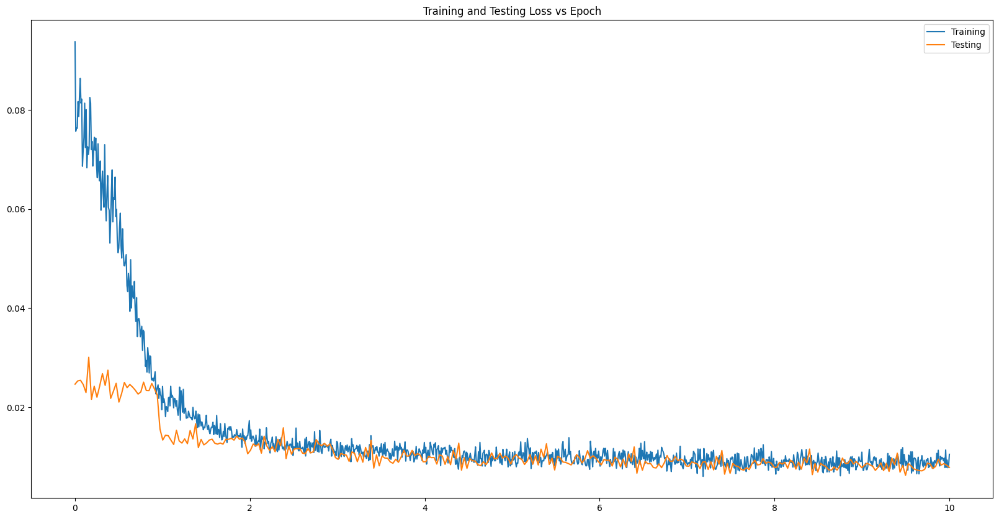

In [ ]:
fig = plt.figure(figsize=(20, 10))
plt.plot(np.linspace(0, n_epochs, len(training_loss_logger)), training_loss_logger)
plt.plot(np.linspace(0, n_epochs, len(testing_loss_logger)), testing_loss_logger)
title = plt.title("Training and Testing Loss vs Epoch")
legend = plt.legend(['Training', 'Testing']);

In [ ]:
test_outputs = []
# Perform a test Loop
with torch.no_grad():
  for x, y in data_loader_test:
    # Run forward calculation
    y_pred = shallow_model(x.to(device))
    test_outputs.append(y_pred.cpu().numpy())

test_outputs = np.concatenate(test_outputs)

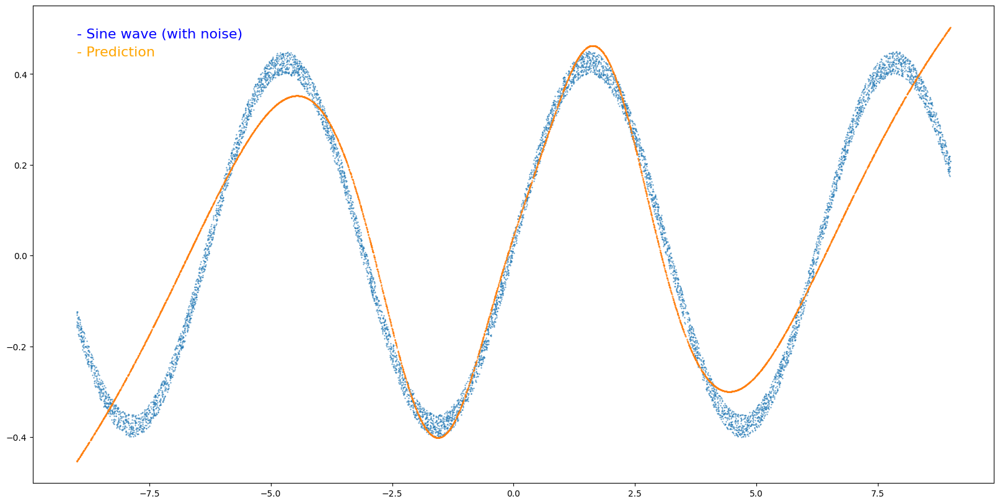

In [ ]:
fig = plt.figure(figsize=(20, 10))
plt.scatter(dataset_test.x_data, dataset_test.y_data, s=0.2)
plt.scatter(dataset_test.x_data, test_outputs, s=0.2)

plt.text(-9, 0.44, "- Prediction", color='orange', fontsize=16)
plt.text(-9, 0.48, '- Sine wave (with noise)', color='blue', fontsize=16);

In [ ]:
batch_size = 256
data_set_root = 'datasets'


train = MNIST(data_set_root, train=True, download=True, transform=transforms.ToTensor())
test = MNIST(data_set_root, train=False, download=True, transform=transforms.ToTensor())

# Using the PyTorch dataloader class and the PyTorch datasets we will create iterable dataloader objects
train_loader = dataloader.DataLoader(train, shuffle=True, batch_size=batch_size, num_workers=0, pin_memory=False)
test_loader = dataloader.DataLoader(test, shuffle=False, batch_size=batch_size, num_workers=0, pin_memory=False)

In [ ]:
images, labels = next(iter(train_loader))
print(f"The input data shape is:\n{images.shape}")
print(f"The target output data shape is:\n{labels.shape}")

The input data shape is:
torch.Size([256, 1, 28, 28])
The target output data shape is:
torch.Size([256])


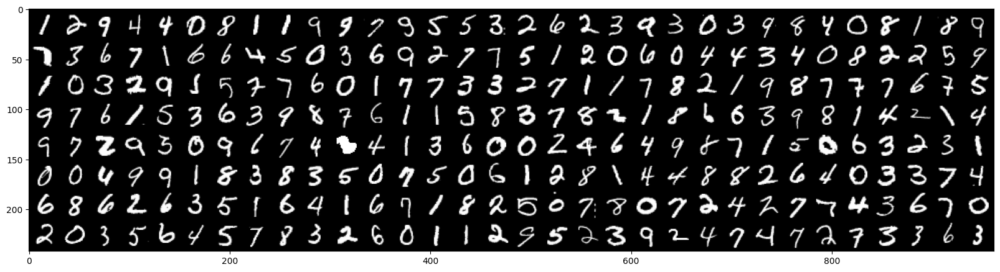

In [ ]:
# Lets visualise an entire batch of images!
plt.figure(figsize=(20, 10))
out = torchvision.utils.make_grid(images, 32)
plt.imshow(out.numpy().transpose((1, 2, 0)));

In [ ]:
# Lets create a simple MLP network similar to the sine wave approximator
class Simple_MLP(nn.Module):
  def __init__(self, num_classes):
    super(Simple_MLP, self).__init__()
    self.fc1 = nn.Linear(784, 512)
    self.fc2 = nn.Linear(512, 256)
    self.fc3 = nn.Linear(256, 128)
    self.fc4 = nn.Linear(128, num_classes)

  def forward(self, x):
    # The data we pass the model is a batch of single channel images
    # with shape BSx1x28x28 we need to flatten it to BSX784
    # To use it in a linear layer
    x = x.reshape(x.shape[0], -1)

    # We will use a relu activation function for this network! (F.relu)
    # NOTE: F.relu is the "functional" version of the activation function!
    # nn.ReLU is a class constructor of a "ReLU" object
    # These tow things are the same for MOST purposes!
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = F.relu(self.fc3(x))
    x = self.fc4(x)
    return x

In [ ]:
# Create our model
model = Simple_MLP(num_classes=10).to(device)

# Create our loss function
criterion = nn.CrossEntropyLoss()

# Define our loss function and optimizer
lr = 1e-3
optimizer = optim.Adam(model.parameters(), lr=lr)

# Number of Epochs
n_epochs = 20

# We can print out the model structure
print(model)

Simple_MLP(
  (fc1): Linear(in_features=784, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=128, bias=True)
  (fc4): Linear(in_features=128, out_features=10, bias=True)
)


In [ ]:
def train_epoch(model, train_loader, criterion, optimizer, loss_logger, device=device):
  for batch_idx, (data, target) in enumerate(tqdm(train_loader, desc='Training', leave=False)):
    outputs = model(data.to(device))
    loss = criterion(outputs, target.to(device))

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    loss_logger.append(loss.item())

  return model, optimizer, loss_logger

In [ ]:
def test_model(model, test_loader, criterion, loss_logger, device=device):
  with torch.no_grad():
    correct_predictions = 0
    total_predictions = 0
    for batch_idx, (data, target) in enumerate(tqdm(test_loader, desc='Testing', leave=False)):
      outputs = model(data.to(device))

      _, predicted = torch.max(outputs.data, 1)
      correct_predictions += (predicted == target.to(device)).sum().item()
      total_predictions += target.shape[0]

      # Calculate the loss
      loss = criterion(outputs, target.to(device))
      loss_logger.append(loss.item())

    acc = (correct_predictions / total_predictions) * 100.0
    return loss_logger, acc

In [ ]:
train_loss = []
test_loss = []
test_acc = []

In [ ]:
for i in trange(n_epochs, desc='Epoch', leave=False):
  model, optimizer, train_loss = train_epoch(model, train_loader, criterion, optimizer, train_loss)
  test_loss, acc = test_model(model, test_loader, criterion, test_loss)
  test_acc.append(acc)

print(f"Final Accuracy: {acc:.2f}%")

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Final Accuracy: 97.98%


In [ ]:
plt.title('Loss')
plt.xlabel('Epoch Number')
plt.ylabel('Loss')


In [ ]:
import pandas as pd

In [ ]:
personal_info = pd.read_csv('https://raw.githubusercontent.com/behnamyazdan/PythonForDataEngineeringCourse/refs/heads/main/02-DataManipulationAndAnalysis/datasets/personal_info.csv')
orders = pd.read_csv('https://raw.githubusercontent.com/behnamyazdan/PythonForDataEngineeringCourse/refs/heads/main/02-DataManipulationAndAnalysis/datasets/orders.csv')
df_data = pd.read_csv('https://raw.githubusercontent.com/behnamyazdan/PythonForDataEngineeringCourse/refs/heads/main/02-DataManipulationAndAnalysis/datasets/sales_data.csv')

In [ ]:
# Check for missing values in the personal info dataset
missing_values = personal_info.isnull().sum()
print(missing_values)

Name             0
Age             14
Phone Number     0
City             0
dtype: int64


In [ ]:
personal_info['Phone Number'].isnull().sum()

0

In [ ]:
# Drop rows with missing phone numbers (careful, data loss!)
cleaned_data = personal_info.dropna(subset=['Phone Number'])
cleaned_data.head()

,Name,Age,Phone Number,City
0,Name 0,28.0,11234567890,New York
1,Name 1,32.0,12234567890,Los Angeles
2,Name 2,19.0,13234567890,Chicago
3,Name 3,NaN,14234567890,San Francisco
4,Name 4,45.0,15234567890,Austin


In [ ]:
# Fill missing values with 'NA'
cleaned_data = personal_info['Phone Number'].fillna('NA')
cleaned_data.head()

,Phone Number
0,11234567890
1,12234567890
2,13234567890
3,14234567890
4,15234567890


In [ ]:
# Insert the cleaned column back into the DataFrame
personal_info['Phone Number'] = cleaned_data

In [ ]:
personal_info.head()

,Name,Age,Phone Number,City
0,Name 0,28.0,11234567890,New York
1,Name 1,32.0,12234567890,Los Angeles
2,Name 2,19.0,13234567890,Chicago
3,Name 3,NaN,14234567890,San Francisco
4,Name 4,45.0,15234567890,Austin


In [ ]:
# Convert 'age' column to numeric (assuming valid integer data)
personal_info["Age"] = pd.to_numeric(personal_info['Age'])

In [ ]:
personal_info.isnull().sum()

,0
Name,0
Age,14
Phone Number,0
City,0


In [ ]:
# Remove leading/trailing spaces from names
personal_info['Name'] = personal_info['Name'].str.strip()
personal_info.head()

,Name,Age,Phone Number,City
0,Name 0,28.0,11234567890,New York
1,Name 1,32.0,12234567890,Los Angeles
2,Name 2,19.0,13234567890,Chicago
3,Name 3,NaN,14234567890,San Francisco
4,Name 4,45.0,15234567890,Austin


In [ ]:
# Convert names to uppercase (optional)
personal_info['Name'] = personal_info['Name'].str.upper()
personal_info.head()

,Name,Age,Phone Number,City
0,NAME 0,28.0,11234567890,New York
1,NAME 1,32.0,12234567890,Los Angeles
2,NAME 2,19.0,13234567890,Chicago
3,NAME 3,NaN,14234567890,San Francisco
4,NAME 4,45.0,15234567890,Austin


In [ ]:
import pandas as pd
import re

# Read data
orders = pd.read_csv('https://raw.githubusercontent.com/behnamyazdan/PythonForDataEngineeringCourse/refs/heads/main/02-DataManipulationAndAnalysis/datasets/orders.csv')
orders.head()

,order_id,customer_id,product_id,product_name,category,price,order_date,city,country
0,1001,2001,3001,Men's Cotton Shirt,clothing,24.99,2023-05-01,New York,USA
1,1002,2002,3002,Gaming Laptop (i7 Processor),electronics,899.99,2023-05-02,Los Angeles,USA
2,1003,2003,3003,Box of Pencils (12 count),stationery,2.50,2023-05-03,Chicago,USA
3,1004,2004,3004,Fresh Apples (1 kg),grocery,5.99,2023-05-04,San Francisco,USA
4,1005,2005,3005,Travel Mug,home,-19.95,2023-05-05,Austin,USA


In [ ]:
orders.columns

Index(['order_id', 'customer_id', 'product_id', 'product_name', 'category',
       'price', 'order_date', 'city', 'country'],
      dtype='object')

In [ ]:
# Clean product descriptions (assuming format "100g" or "100 ml")
def clean_description(text):
  pattern = r"(\d+)(\s*(g|ml))?"  # matches number, optional space, and unit (g/ml)
  match = re.search(pattern, text)
  if match:
    return f"{match.group(1)} {match.group(2)}"  # Extract number and unit (if present)
  else:
    return text # Return original text if no match

orders['Product Description'] = orders['product_name'].apply(clean_description)

# Print cleaned descriptions
orders["Product Description"].head()

,Product Description
0,Men's Cotton Shirt
1,7 None
2,12 None
3,1 None
4,Travel Mug


In [ ]:
# Identify outliers (assuming prices below $10 or above $1000 are outliers)
outlier_mask = (orders['price'] < 10) | (orders['price'] > 1000)
outlier_mask

,price
0,False
1,False
2,True
3,True
4,True
5,False
6,False
7,True
8,False
9,False


In [ ]:
outlier_data = orders[outlier_mask]
outlier_data

,order_id,customer_id,product_id,product_name,category,price,order_date,city,country,Product Description
2,1003,2003,3003,Box of Pencils (12 count),stationery,2.50,2023-05-03,Chicago,USA,12 None
3,1004,2004,3004,Fresh Apples (1 kg),grocery,5.99,2023-05-04,San Francisco,USA,1 None
4,1005,2005,3005,Travel Mug,home,-19.95,2023-05-05,Austin,USA,Travel Mug
7,1008,2008,3008,12 Pack of Soda,grocery,3.99,NaN,New York,USA,12 None
13,1014,2014,3014,Kids' T-Shirt (size L),clothing,9.99,2023-05-14,Berlin,Germany,Kids' T-Shirt (size L)
15,1016,2016,3016,Water Bottle,home,8.99,2023-05-16,Austin,USA,Water Bottle
17,1018,2018,3018,Notebook (100 pages),stationery,3.20,2023-05-18,San Francisco,USA,100 None
19,1020,2020,3020,Smartphone Stand,electronics,5.49,2023-05-20,Los Angeles,USA,Smartphone Stand
21,1022,2022,3022,Pack of Batteries (AA),electronics,7.99,2023-05-22,Berlin,Germany,Pack of Batteries (AA)
22,1023,2023,3023,Men's Leather Belt,clothing,-15.00,2023-05-23,Austin,USA,Men's Leather Belt


In [ ]:
# Optionally, replace outliers with appropriate values (e.g., median)
orders.loc[outlier_mask, 'price']

,price
2,2.50
3,5.99
4,-19.95
7,3.99
13,9.99
15,8.99
17,3.20
19,5.49
21,7.99
22,-15.00


In [ ]:
orders['price'].median()

24.99

In [ ]:
orders.loc[outlier_mask, 'price'] = orders['price'].median()


In [ ]:
orders.head()

,order_id,customer_id,product_id,product_name,category,price,order_date,city,country,Product Description
0,1001,2001,3001,Men's Cotton Shirt,clothing,24.99,2023-05-01,New York,USA,Men's Cotton Shirt
1,1002,2002,3002,Gaming Laptop (i7 Processor),electronics,899.99,2023-05-02,Los Angeles,USA,7 None
2,1003,2003,3003,Box of Pencils (12 count),stationery,24.99,2023-05-03,Chicago,USA,12 None
3,1004,2004,3004,Fresh Apples (1 kg),grocery,24.99,2023-05-04,San Francisco,USA,1 None
4,1005,2005,3005,Travel Mug,home,24.99,2023-05-05,Austin,USA,Travel Mug


In [ ]:
orders.price

,price
0,24.99
1,899.99
2,24.99
3,24.99
4,24.99
5,14.50
6,79.00
7,24.99
8,129.99
9,NaN


In [ ]:
def categorize_product(name):
  if 'shirt' in name.lower():
    return "Clothing"
  elif 'computer' in name.lower():
    return "Electronics"
  else:
    return "Other"

In [ ]:
orders.category.value_counts()

,count
category,
electronics,10
home,10
clothing,7
grocery,6
stationery,4
furniture,3
beauty,3
accessories,3
sports,2


In [ ]:
orders['category'] = orders['product_name'].apply(categorize_product)

In [ ]:
orders.head()

,order_id,customer_id,product_id,product_name,category,price,order_date,city,country,Product Description
0,1001,2001,3001,Men's Cotton Shirt,Clothing,24.99,2023-05-01,New York,USA,Men's Cotton Shirt
1,1002,2002,3002,Gaming Laptop (i7 Processor),Other,899.99,2023-05-02,Los Angeles,USA,7 None
2,1003,2003,3003,Box of Pencils (12 count),Other,24.99,2023-05-03,Chicago,USA,12 None
3,1004,2004,3004,Fresh Apples (1 kg),Other,24.99,2023-05-04,San Francisco,USA,1 None
4,1005,2005,3005,Travel Mug,Other,24.99,2023-05-05,Austin,USA,Travel Mug


In [ ]:
orders.category.value_counts()

,count
category,
Other,48
Clothing,2


# Error Handling and Data Validation:

As you deal with complex data, errors and unexpected values might arise. Here's how to handle potential issues:

In [ ]:
def convert_price(price_str):
  try:
    return float(price_str.replace("$", "")) # Remove dollar sign and convert to float
  except ValueError:
    return None # Handle conversion erros (e.g., invalid price format)


In [ ]:
# Apply with error handling
orders['price']

,price
0,24.99
1,899.99
2,24.99
3,24.99
4,24.99
5,14.50
6,79.00
7,24.99
8,129.99
9,NaN


In [ ]:
orders['price'] = orders['price'].apply(str)
orders['price'] = orders['price'].apply(lambda x: f"${x}")

In [ ]:
orders.head()

,order_id,customer_id,product_id,product_name,category,price,order_date,city,country,Product Description
0,1001,2001,3001,Men's Cotton Shirt,Clothing,$24.99,2023-05-01,New York,USA,Men's Cotton Shirt
1,1002,2002,3002,Gaming Laptop (i7 Processor),Other,$899.99,2023-05-02,Los Angeles,USA,7 None
2,1003,2003,3003,Box of Pencils (12 count),Other,$24.99,2023-05-03,Chicago,USA,12 None
3,1004,2004,3004,Fresh Apples (1 kg),Other,$24.99,2023-05-04,San Francisco,USA,1 None
4,1005,2005,3005,Travel Mug,Other,$24.99,2023-05-05,Austin,USA,Travel Mug


In [ ]:
import numpy as np

In [ ]:
# Apply with error handling
orders['price'] = orders['price'].apply(convert_price)

# Validate data types after cleaning
if orders['price'].dtypes == np.float64:
  print("Price data type is valid (float)")
else:
  print("Potential issues with Price data type")

Price data type is valid (float)


In [ ]:
orders.head()

,order_id,customer_id,product_id,product_name,category,price,order_date,city,country,Product Description
0,1001,2001,3001,Men's Cotton Shirt,Clothing,24.99,2023-05-01,New York,USA,Men's Cotton Shirt
1,1002,2002,3002,Gaming Laptop (i7 Processor),Other,899.99,2023-05-02,Los Angeles,USA,7 None
2,1003,2003,3003,Box of Pencils (12 count),Other,24.99,2023-05-03,Chicago,USA,12 None
3,1004,2004,3004,Fresh Apples (1 kg),Other,24.99,2023-05-04,San Francisco,USA,1 None
4,1005,2005,3005,Travel Mug,Other,24.99,2023-05-05,Austin,USA,Travel Mug


## Handling Inconsistent Dates:

Real-world data often has inconsistent date formats. Let's tackle a "Transaction Date" column with mixed formats:

In [ ]:
import pandas as pd

# Sample data with inconsistent dates
data = {
    "Transaction ID": [1, 2, 3, 4, 5],
    "Transaction Date": ['01/01/2023', '2023-02-14', '14th March 2023', '04-April-23', 'Invalid Date']
}

df = pd.DataFrame(data)

df

,Transaction ID,Transaction Date
0,1,01/01/2023
1,2,2023-02-14
2,3,14th March 2023
3,4,04-April-23
4,5,Invalid Date


In [ ]:
# Define a custom function to parse various date formats
def parse_date(date_str):
  try:
    # Attempt multiple formats (modify as needed for your data)
    return pd.to_datetime(date_str, format='%m/%d/%Y')  # MM/DD/YYYY
  except ValueError:
    try:
      return pd.to_datetime(date_str, format='%Y-%m-%d') # YYYY-MM-DD
    except ValueError:
      try:
        return pd.to_datetime(date_str, format='%d %B %Y') # DD MonthName YYYY
      except ValueError:
        return None # Handle invalida dates

In [ ]:
# Apply the function and set the column as datetime format
df['Transaction Date'] = df['Transaction Date'].apply(parse_date)

In [ ]:
df

In [ ]:
import pandas as pd

# Sample data with inconsistent dates
data = {
  "Transaction ID": [1, 2, 3, 4, 5],
  "Transaction Date": ["01/01/2023", "2023-02-14", "14th March 2023", "04-April-23", "Invalid Date"]
}

df = pd.DataFrame(data)

# Define a custom function to parse various date formats
def parse_date(date_str):
  try:
    # Attempt multiple formats (modify as needed for your data)
    return pd.to_datetime(date_str, format="%m/%d/%Y")  # MM/DD/YYYY
  except ValueError:
    try:
      return pd.to_datetime(date_str, format="%Y-%m-%d")  # YYYY-MM-DD
    except ValueError:
      try:
        return pd.to_datetime(date_str, format="%d %B %Y")  # DD MonthName YYYY
      except ValueError:
        return None  # Handle invalid dates

# Apply the function and set the column as datetime format
df["Transaction Date"] = df["Transaction Date"].apply(parse_date)
df["Transaction Date"] = pd.to_datetime(df["Transaction Date"])

# Print cleaned dates
df

In [ ]:
# Sample data with messy addresses
data = {
    "Customer ID": [100, 101, 102, 103, 104],
    "Address": ["123 Main St. Apt. A", "456 Elm St, Anytown", '789 Oak Dr', None, "1000, Cherry Lane"]

}

df = pd.DataFrame(data)
df

In [ ]:
import re

def extract_street_number(address):
  pattern = r"(\d+)(?:\s*(?:st|nd|rd|th)?)?\s*(\w*)\b" # Matches digits, optional ordinal suffix, and street type
  match = re.search(pattern, address)
  if match:
    return match.group(1)  # Return the captured digit group (street number)
  else:
    return None

In [ ]:
def extract_street_name(address):
  pattern = r"(?<=^\d+\s*(?:st|nd|rd|th)?\s*)(\w+(?:\s+\w+)*)"  # Matches words after street number and optional suffix
  match = re.search(pattern, address)
  if match:
    return match.group(1)   # Return the captured group (street name)
  else:
    return None

In [ ]:
def extract_apartment(address):
  pattern = r"(?:\bapt|unit|#)\s*(\w+)"  # Matches "apt", "unit", or "#" followed by alphanumeric characters
  match = re.search(pattern, address, flags=re.IGNORECASE) # Case-insensitive search
  if match:
    return match.group(1) # Return the captured group (apartment number)
  else:
    return None # No match found

In [ ]:
df

In [ ]:
# Sample data with messy addresses
data = {
  "Customer ID": [100, 101, 102, 103, 104],
  "Address": ["123 Main St. Apt. A", "456 Elm St, Anytown", "789  Oak Dr", None, "1000, Cherry Lane"]
}

df = pd.DataFrame(data)

import re

def extract_street_number(address):
  pattern = r"(\d+)(?:\s*(?:st|nd|rd|th)?)?\s*(\w*)\b"  # Matches digits, optional ordinal suffix, and street type
  match = re.search(pattern, address)
  if match:
    return match.group(1)  # Return the captured digit group (street number)
  else:
    return None  # No match found

def extract_street_name(address):
  pattern = r"(?<=^\d+\s*(?:st|nd|rd|th)?\s*)(\w+(?:\s+\w+)*)"  # Matches words after street number and optional suffix
  match = re.search(pattern, address)
  if match:
    return match.group(1)  # Return the captured group (street name)
  else:
    return None  # No match found

def extract_apartment(address):
  pattern = r"(?:\bapt|unit|#)\s*(\w+)"  # Matches "apt", "unit", or "#" followed by alphanumeric characters (apartment number)
  match = re.search(pattern, address, flags=re.IGNORECASE)  # Case-insensitive search
  if match:
    return match.group(1)  # Return the captured group (apartment number)
  else:
    return None  # No match found

In [ ]:
df.Address = df.Address.astype(str)

In [ ]:
# Clean and standardize addresses
df['Street Number'] = df['Address'].apply(extract_street_number)
df

In [ ]:
df['Apartment'] = df['Address'].apply(extract_apartment)
df

In [ ]:
# Sample data with customer purchase data (continued)
data = {
  "Customer ID": [1, 1, 2, 2, 3, 3],
  "Product Name": ["Shirt", "Headphones", "Shirt", "Laptop", "Trousers", "Coffee"],
  "Transaction Date": pd.to_datetime(["2023-01-10", "2023-01-15", "2023-02-01", "2023-02-10", "2023-03-05", "2023-03-12"])
}

df = pd.DataFrame(data)

In [ ]:
df

In [ ]:
df.columns

In [ ]:
df[df['Customer ID'] == 1]

In [ ]:
df[df['Customer ID'] == 1]['Transaction Date']

In [ ]:
t = df[df['Customer ID'] == 1]['Transaction Date'].min()
t

In [ ]:
t = (df['Transaction Date'] - t)
t

In [ ]:
t.dt

In [ ]:
t.dt.days

In [ ]:
t.dt.days.min()

In [ ]:
# Calculate days since first purchase for each customer
def days_since_first_purchase(df, customer_id):
  customer_data = df[df['Customer ID'] == customer_id]
  first_purchase = customer_data["Transaction Date"].min()
  return (df["Transaction Date"] - first_purchase).dt.days.min() # Minimum days for each customer



In [ ]:
days = days_since_first_purchase(df, customer_id=1)
print(days)

In [ ]:
df['Customer ID'].apply(lambda x: days_since_first_purchase(df, x))

In [ ]:
import pandas as pd

# Sample data with customer purchase data
data = {
    "Customer ID": [1, 1, 2, 2, 3, 3],
    "Product Name": ["Shirt", "Headphones", "Shirt", "Laptop", "Trousers", "Coffee"],
    "Transaction Date": pd.to_datetime(["2023-01-10", "2023-01-15", "2023-02-01", "2023-02-10", "2023-03-05", "2023-03-12"])
}

df = pd.DataFrame(data)

# Calculate days since first purchase for each customer
def days_since_first_purchase(customer_data):
    first_purchase = customer_data["Transaction Date"].min()
    return (customer_data["Transaction Date"] - first_purchase).dt.days

df["Days Since First Purchase"] = df.groupby("Customer ID").apply(days_since_first_purchase).reset_index(drop=True)

# Print results with new feature
print(df)


In [ ]:
df.groupby("Customer ID").apply(days_since_first_purchase).reset_index(drop=True)

In [ ]:
df.groupby("Customer ID").apply(days_since_first_purchase)

In [ ]:
df_data.head()

In [ ]:
import pandas as pd

customers = pd.DataFrame(
    {
        'CustomerID': [1, 2, 3],
        'Name': ['Alice', 'Bob', 'Charlie']
    }
)

orders = pd.DataFrame({
    'OrderID': [100, 101, 102],
    'CustomerID': [1, 2, 4],
    'Amount': [100, 200, 300]
})

In [ ]:
customers

In [ ]:
orders

In [ ]:
merged_df = customers.merge(orders, on='CustomerID')
merged_df

In [ ]:
merged_df = orders.merge(customers, on='CustomerID')
merged_df

In [ ]:
merged_df = customers.merge(orders, on='CustomerID', how='left')
merged_df

In [ ]:
merged_df = orders.merge(customers, on='CustomerID', how='left')
merged_df

In [ ]:
products = pd.DataFrame({'ProductID': [11, 12, 13],
                         'OrderID': [100, 101, 102],
                         'Description': ['Laptop', 'Phone', 'Tablet']})

products

In [ ]:
merged_df = customers.merge(orders, on='CustomerID') \
                     .merge(products, how='left', on=['OrderID'], indicator=True)
print(merged_df)

In [ ]:
region_sales = pd.DataFrame({
    'Region': ['East', 'West'],
    'Sales': [10000, 15000]
})
region_sales

In [ ]:
country_sales = pd.DataFrame({
    'Country': ['US', 'Canada'],
    'Sales': [20000, 5000]
})

country_sales

In [ ]:
# Concatenate along row (axis=0)
combined_sales = pd.concat([region_sales, country_sales], axis=0)
combined_sales

In [ ]:
combined_sales = pd.concat([region_sales, country_sales])
combined_sales

In [ ]:
import pandas as pd

# Sample DataFrames with the same number of rows (important for horizontal concatenation)
customer_data = pd.DataFrame(
    {
        'CustomerID': [1, 2, 3],
        'Name': ['Alice', 'Bob', 'Charlie']
    }
)

customer_data

In [ ]:
order_data = pd.DataFrame({
    'OrderID': [100, 101, 102],
    'Amount': [100, 200, 300]
})

order_data

In [ ]:
# Concatenate horizontal (axis=1)
combined_df = pd.concat([customer_data, order_data], axis=1)
combined_df

In [ ]:
customer_data.set_index('CustomerID')

In [ ]:
order_data

In [ ]:
df_data.head()

In [ ]:
total_revenue = np.sum(df_data['Revenue'])
total_revenue

In [ ]:
avg_quantity_per_transaction = np.mean(df_data['Quantity'])
avg_quantity_per_transaction

In [ ]:
max_revenue_per_transaction = np.max(df_data['Revenue'])
max_revenue_per_transaction

In [ ]:
sorted_indices = np.argsort(df_data['Revenue'])[::-1]
sorted_indices

In [ ]:
top_5_products = df_data['Product_ID'][sorted_indices][:5].unique()
top_5_products

In [ ]:
print("\nTop 5 best-selling products based on revenue:")
for product_id in top_5_products:
    product_data = df_data[df_data['Product_ID'] == product_id]
    total_revenue_product = np.sum(product_data['Revenue'])
    total_quantity_product = np.sum(product_data['Quantity'])
    print(f"Product ID: {product_id}, Total Revenue: {total_revenue_product}, Total Quantity Sold: {total_quantity_product}")


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
x = [1, 2, 3, 4, 5]
y = [10, 14, 19, 25, 30]

plt.plot(x, y)

# Adding labels and title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Simple Line Plot')

# Display the plot
plt.show()

In [ ]:
fig, axs = plt.subplots(2, 2)  # Create a 2x2 grid of subplots

axs[0, 0].plot(x, y)
axs[0, 0].set(xlabel='X-axis0 Label', ylabel='Y-axis0 Label', title='Basic Line Plot')

axs[0, 1].plot(x, y)
axs[0, 1].set(xlabel='X-axis1 Label', ylabel='Y-axis1 Label', title='Basic Line Plot')

axs[1, 0].plot(x, y)
axs[1, 0].set(xlabel='X-axis2 Label', ylabel='Y-axis2 Label', title='Basic Line Plot')

axs[1, 1].plot(x, y)
axs[1, 1].set(xlabel='X-axis3 Label', ylabel='Y-axis3 Label', title='Basic Line Plot')

fig.set_size_inches(15, 10) # Set the figure size
fig.suptitle('Multiple Subplots Example')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

In [ ]:
plt.plot(x, y, marker='o', linestyle='--', color='g')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Customized Plot')
plt.grid(True)
plt.xlim(0, 6)
plt.ylim(5, 35)
plt.show()

In [ ]:
plt.plot(x, y)
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.title('Customized Plot')
plt.grid(True)
plt.xlim(0, 6)
plt.ylim(5, 35)
plt.savefig('plot.png')
plt.show()

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

# First subplot
axs[0, 0].plot(x, y)
axs[0, 0].set_title('Line Plot')

# Second subplot
axs[0, 1].scatter(x, y)
axs[0, 1].set_title('Scatter Plot')

# Third subplot
categories = ['A', 'B', 'C', 'D', 'E']
values = [10, 20, 15, 25, 30]
axs[1, 0].bar(categories, values)
axs[1, 0].set_title('Bar Plot')

# Fourth subplot
data = [np.random.randn(100) for _ in range(5)]
axs[1, 1].boxplot(data)
axs[1, 1].set_title('Box Plot')

plt.tight_layout() # Adjust subplots to fit in the figure area.
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# Sample data
x = [1, 2, 3, 4, 5]
y = [10, 14, 19, 25, 30]

# Creating a line plot
sns.lineplot(x=x, y=y)
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.title('Basic Line Plot')
plt.show()

In [ ]:
data = pd.DataFrame({
    'x': [1, 2, 3, 4, 5],
    'y': [10, 14, 19, 25, 20]
})

# Creating a line plot
sns.lineplot(data=data, x='x', y='y')
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.title('Line Plot with Data')
plt.show()

In [ ]:
# Creating a line plot
sns.lineplot(x=data['x'], y=data['y'])
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.title('Line Plot with Data')
plt.show()

In [ ]:
sns.set_theme(style='darkgrid')

In [ ]:
sns.set_context('talk')
sns.lineplot(x='x', y='y', data=data, marker='o')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Customized Line Plot')
plt.show()

In [ ]:
sns.lineplot(x='x', y='y', data=data)
plt.title('Line Plot')
plt.show()

In [ ]:
data = pd.DataFrame({
    'x': [1, 2, 3, 4, 5],
    'y': [10, 14, 19, 25, 30],
    'size': [50, 100, 200, 300, 400],
    'color': ['red', 'blue', 'green', 'purple', 'orange']
})

sns.scatterplot(x='x',
                y='y',
                size='size',
                hue='color',
                data=data,
                palette='coolwarm',
                edgecolor='w',
                sizes=(50, 400))

plt.title('Scatter Plot')
plt.show()

In [ ]:
# Sample data
data = pd.DataFrame({
    'x': [1, 2, 3, 4, 5],
    'y': [10, 14, 19, 25, 30],
    'size': [50, 100, 200, 300, 400],
    'color': ['red', 'blue', 'green', 'purple', 'orange']
})

sns.scatterplot(x='x', y='y', size='size', hue='color', data=data, palette='coolwarm', edgecolor='w', sizes=(50, 400))
plt.title('Scatter Plot')
plt.show()

In [ ]:
# Sample data
data = pd.DataFrame({
    'x': [1, 2, 3, 4, 5],
    'y': [10, 14, 19, 25, 30],
    'size': [50, 100, 200, 300, 400],
    'color': ['red', 'blue', 'green', 'purple', 'orange']
})

sns.scatterplot(x='x',
                y='y',
                size='size',
                hue='color',
                data=data,
                palette='coolwarm',
                edgecolor='w',
                sizes=(50, 400),
                legend=False)

plt.title('Scatter Plot')
plt.show()

In [ ]:
# Sample data
categories = ['A', 'B', 'C', 'D', 'E']
values = [10, 20, 15, 25, 30]
data = pd.DataFrame({'categories': categories, 'values': values})

sns.barplot(x='categories', y='values', data=data, palette='viridis')
plt.title('Bar Plot')
plt.show()

In [ ]:
import numpy as np

data = np.random.randn(1000)

sns.histplot(data, bins=30, kde=True)
plt.title('Histogram with KDE')
plt.show()

In [ ]:
data = [np.random.randn(8) for _ in range(5)]
df = pd.DataFrame(data)
df

In [ ]:
data = [np.random.randn(8) for _ in range(5)]
df = pd.DataFrame(data).melt(var_name='Category', value_name='Value')
df

In [ ]:
sns.boxplot(x='Category', y='Value', data=df, palette='Set3')
plt.title('Box Plot')
plt.show()

In [ ]:
data = [np.random.randn(8) for _ in range(5)]
df = pd.DataFrame(data).melt(var_name='Category', value_name='Value')

sns.violinplot(x='Category', y='Value', data=df, inner='quartile', palette='muted')
plt.title('Violin Plot')
plt.show()

In [ ]:
sns.violinplot(x='Category', y='Value', data=df, inner='quartile', hue='Category', legend=False, palette='muted')

In [ ]:
import matplotlib.pyplot as plt

x = [1, 2, 3, 4, 5]
y = [10, 14, 19, 25, 30]

plt.plot(x, y, marker='o')
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.title('Basic Line Plot')
plt.grid(True)
plt.show()

In [ ]:
plt.plot(x, y, marker='o', linestyle='--', color='g', linewidth=2, markersize=10)
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Customized Line Plot')
plt.xlim(0, 6)
plt.ylim(5, 35)
plt.grid(True)
plt.show()

In [ ]:
import seaborn as sns

sns.lineplot(x=x, y=y, marker='o')
plt.title('Seaborn Line Plot')
plt.show()

In [ ]:
sns.set(style='whitegrid')
sns.lineplot(x=x, y=y, marker='o')
plt.title('Customized Seaborn Line Plot')
plt.show()

In [ ]:
plt.scatter(x, y, c='red', marker='x')
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.title('Scatter Plot')
plt.show()

In [ ]:
sizes = [50, 100, 200, 300, 400]
colors = ['red', 'green', 'blue', 'orange', 'purple']


plt.scatter(x, y, s=sizes, c=colors, alpha=0.5, edgecolors='w', linewidth=2)
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.title('Customized Scatter Plot')
plt.show()

In [ ]:
sns.scatterplot(x=x, y=y, size=sizes, hue=colors, palette='coolwarm', edgecolor='w', linewidth=2, legend=False)
plt.title('Customised Seaborn Scatter Plot')
plt.show();

In [ ]:
categories = ['A', 'B', 'C', 'D', 'E']
values = [10, 20, 15, 25, 30]

plt.bar(categories, values)
plt.xlabel('Categories')
plt.ylabel('Values')
plt.title('Bar Plot')
plt.show()

In [ ]:
sns.barplot(x=categories, y=values)
plt.title('Seaborn Bar Plot')
plt.show()

In [ ]:
plt.bar(
    categories,
    values,
    color=['red', 'blue', 'green', 'purple', 'orange'],
    edgecolor='black'
)

plt.xlabel('Categories')
plt.ylabel('Values')
plt.title('Customized Bar Plot')
plt.show()

In [ ]:
sns.barplot(x=categories, y=values, palette='viridis', hue=categories)
plt.title('Customized Seaborn Bar Plot')
plt.show()

In [ ]:
# sample data
categories = ['A', 'B', 'C', 'D', 'E']
values1 = [10, 20, 15, 25, 30]
values2 = [15, 18, 14, 22, 28]

# Create an array with the positions of the bars on the x-axis
bar_width = 0.4
bar_positions1 = np.arange(len(categories))
bar_positions2 = bar_positions1 + bar_width

# Create the bar plots
plt.bar(bar_positions1, values1, width=bar_width, color='blue', label='Series 1')
plt.bar(bar_positions2, values2, width=bar_width, color='green', label='Series 2')

# Adding labels and title
plt.xlabel('Categories')
plt.ylabel('Values')
plt.title('Grouped Bar Plot')
plt.xticks(bar_positions1 + bar_width / 2, categories)
plt.legend()

plt.show()